# Project 5 : Feature Selection, Model Selection and Tuning - Credit Card Users Churn Prediction 

#### By   : Rakesh Jyothi Krishnan
#### Batch: PGP - ARTIFICIAL INTELLIGENCE & MACHINE LEARNING . PGP-AIML-BA-UTA-Sept'21-A
#### Date : 02/18/2022
---

# Description

## Background & Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

You need to identify the best possible model that will give the required performance

## Objective

1. Explore and visualize the dataset.
2. Build a classification model to predict if the customer is going to churn or not
3. Optimize the model using appropriate techniques
4. Generate a set of insights and recommendations that will help the bank

## Data Dictionary:

- CLIENTNUM: Client number. Unique identifier for the customer holding the account
- Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
- Customer_Age: Age in Years
- Gender: Gender of the account holder
- Dependent_count: Number of dependents
- Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
- Marital_Status: Marital Status of the account holder
- Income_Category: Annual Income Category of the account holder
- Card_Category: Type of Card
- Months_on_book: Period of relationship with the bank
- Total_Relationship_Count: Total no. of products held by the customer
- Months_Inactive_12_mon: No. of months inactive in the last 12 months
- Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
- Credit_Limit: Credit Limit on the Credit Card
- Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
- Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
- Total_Trans_Amt: Total Transaction Amount (Last 12 months)
- Total_Trans_Ct: Total Transaction Count (Last 12 months)
- Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
- Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
- Avg_Utilization_Ratio: Represents how much of the available credit the customer spent

### 1. Import  Libraries

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# to ignore warning messages
import warnings

warnings.filterwarnings("ignore")

# to set background color in plots
sns.set(color_codes=True)

# to print plots inline
%matplotlib inline
# pd.options.display.float_format = '{:,.2f}'.format

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)


# to split the data into train and test
from sklearn.model_selection import train_test_split

# To tune different models
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To get diferent metric scores
from sklearn import metrics

# To build ensemble bagging models
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

# To build linear models
from sklearn.linear_model import LogisticRegression

# To build decision tree models
from sklearn.tree import DecisionTreeClassifier

# To build ensemble boosting models
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

# To build xgboost boosting models
from xgboost import XGBClassifier

# To build stacking models
from sklearn.ensemble import StackingClassifier

# To impute missing values
from sklearn.impute import SimpleImputer, KNNImputer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To be used for one hot encoding
from sklearn.preprocessing import OneHotEncoder

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

<IPython.core.display.Javascript object>

### 2. Load Data

In [2]:
# Read data from csv file using pandas and create DataFrame object as Analytic Base Table
churn_data_ABT = pd.read_csv("BankChurners.csv")

<IPython.core.display.Javascript object>

In [3]:
# Make a copy of Analytic Base Table for further analysis and model building
churn_data = churn_data_ABT.copy()

<IPython.core.display.Javascript object>

### 3. View Data

In [4]:
# checking number of columns and rows
print(f"There are {churn_data.shape[0]} rows and {churn_data.shape[1]} columns.")

There are 10127 rows and 21 columns.


<IPython.core.display.Javascript object>

In [5]:
# Check datatypes of each columns
churn_data.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

<IPython.core.display.Javascript object>

#### Observation : 
1. Column names and its data types are listed
2. Columns "CLIENTNUM","Customer_Age","Dependent_count","Months_on_book","Total_Relationship_Count","Months_Inactive_12_mon","Contacts_Count_12_mon","Credit_Limit","Total_Revolving_Bal","Avg_Open_To_Buy","Total_Amt_Chng_Q4_Q1","Total_Trans_Amt","Total_Trans_Ct","Total_Ct_Chng_Q4_Q1" and "Avg_Utilization_Ratio" are integer data type
3. Columns "Attrition_Flag","Gender","Education_Level","Marital_Status","Income_Category" and "Card_Category" are object datatypes. They must be checked further in order to convert them as a category or not.

In [6]:
# Additional check on data for null values
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

<IPython.core.display.Javascript object>

#### Observation : 
1. Row index is from 0 to 10126 which is the unique Client Number. Total rows is 10127
2. Column index is from 0 to 19. Total columns is 20
3. There are null values in columns "Education_Level" and "Marital_Status". **Missing value treatment is required for these columns**
4. **The target variable is "Attrition_Flag."** It does not have null values

In [7]:
# Check head
churn_data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [8]:
# Check tail
churn_data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


<IPython.core.display.Javascript object>

In [9]:
# Check sample
churn_data.sample(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
8056,713382558,Existing Customer,57,F,3,College,Single,Less than $40K,Blue,42,1,1,2,2063.0,953,1110.0,0.868,4304,81,0.761,0.462
1332,827888433,Existing Customer,43,M,4,Uneducated,Single,$40K - $60K,Blue,39,5,2,2,6648.0,2242,4406.0,0.790,2089,60,0.579,0.337
5092,710482533,Existing Customer,26,M,0,NaN,Married,$120K +,Blue,17,4,2,1,30928.0,2005,28923.0,0.520,3863,72,0.756,0.065
6236,715725858,Existing Customer,43,F,3,Post-Graduate,Single,Less than $40K,Blue,26,6,2,2,2256.0,1346,910.0,0.911,4893,76,0.810,0.597
56,716632758,Existing Customer,49,F,3,Graduate,Single,Less than $40K,Blue,36,2,2,0,2802.0,2363,439.0,0.750,1295,40,0.600,0.843


<IPython.core.display.Javascript object>

#### Observation : 
1. Column "CLIENTNUM" is unique and can be dropped.
2. **Attrition_Flag is categorical. It is also the target variable.** Value "Attrited Customer" will be True or "1" and value "Existing Customer" will be False or "0".
3. Column "Customer_Age" is in years and is a continous variable
4. Columns "Gender", "Education_Level", "Marital_Status", "Income_Category" and "Card_Category" are strings and categorical variable. They can be typecast as Categorical. OneHotEncoding can be applied on these columns.
5. Columns "Dependent_count", "Months_on_book",	"Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1","Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1"  and "Avg_Utilization_Ratio" are sequential numbers


In [10]:
# Check basic summary
churn_data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,NaN,NaN,NaN,739177606.333663,36903783.450231,708082083.0,713036770.5,717926358.0,773143533.0,828343083.0
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0


<IPython.core.display.Javascript object>

#### Observation : 
1. There are missing values in columns "Education_Level" and "Marital_Status"
2. Columns "Gender", "Education_Level", "Marital_Status", "Income_Category" and "Card_Category" are strings and categorical variable. They can be typecast as Categorical. OneHotEncoding can be applied on these columns.
3. Columns "Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1","Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1" and "Avg_Utilization_Ratio" are sequential numbers




### 4. Exploratory Data Analysis

#### A. Univariate Analysis

In [11]:
# function to plot a boxplot and a histogram along the same scale.


def hist_boxplot(data, column, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,
        sharex=False,
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )
    plt.subplots_adjust(hspace=0.5)
    sns.boxplot(data=data, x=column, ax=ax_box2, showmeans=True, color="lightsalmon")
    sns.histplot(
        data=data, x=column, kde=kde, ax=ax_hist2, bins=bins, color="cornflowerblue"
    ) if bins else sns.histplot(
        data=data, x=column, kde=kde, ax=ax_hist2, color="cornflowerblue"
    )
    ax_hist2.axvline(data[column].mean(), color="green", linestyle="--")
    ax_hist2.axvline(data[column].median(), color="black", linestyle="-")
    plt.show()

<IPython.core.display.Javascript object>

In [12]:
# function to create labeled barplots


def labeled_barplot(data, column, perc=False, n=None, h=None, fig_size=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[column])  # length of the column
    count = data[column].nunique()

    if h is None:
        l = 0
    else:
        l = 20

    if fig_size is not None:
        plt.figure(figsize=(fig_size))
    else:
        if n is None:
            plt.figure(figsize=(l + count + 1, 5))
        else:
            plt.figure(figsize=(l + n + 2, 5))

    plt.xticks(rotation=45, fontsize=13)
    ax = sns.countplot(
        data=data,
        x=column,
        hue=h,
        palette="pastel",
        order=data[column].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(100 * p.get_height() / total)
        else:
            label = p.get_height()

        x = p.get_x() + p.get_width() / 2
        y = p.get_height()

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )

    plt.show()

<IPython.core.display.Javascript object>

In [13]:
# Check datatypes of columns and apply above functions according to column data type
churn_data.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

<IPython.core.display.Javascript object>

##### Univariate Analysis - Column "Attrition_Flag"

In [14]:
# Basic summary
churn_data[["Attrition_Flag"]].describe()

,Attrition_Flag
count,10127
unique,2
top,Existing Customer
freq,8500


<IPython.core.display.Javascript object>

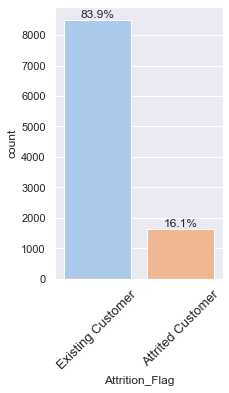

<IPython.core.display.Javascript object>

In [15]:
# Visualize data through plot
labeled_barplot(churn_data, "Attrition_Flag", perc=True)

#### Observation of  column "Attrition_Flag": 
1. **This is the target variable**
2. It is a categorical column. It has only two values "Existing Customer" and "Attrited Customer". 
3. Value "Attrited Customer" will be True or "1" and value "Existing Customer" will be False or "0". Objective of this project is to predict "Attrited Customer".
3. **Most of customers did not churn (83.9%). Whereas, 16.1 % of customers had churned.**
4. Target data is imbalanced.

##### Univariate Analysis - Column "Customer_Age"

In [16]:
# Basic summary
churn_data[["Customer_Age"]].describe()

,Customer_Age
count,10127.000000
mean,46.325960
std,8.016814
min,26.000000
25%,41.000000
50%,46.000000
75%,52.000000
max,73.000000


<IPython.core.display.Javascript object>

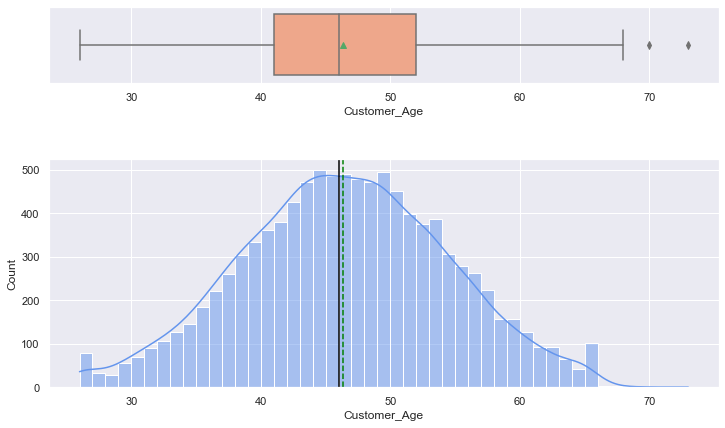

<IPython.core.display.Javascript object>

In [17]:
# Visualize data through plot
hist_boxplot(churn_data, "Customer_Age", kde=True)

#### Observation of  column "Customer_Age": 
1. It looks like a normal distribution.
2. It is not at all skewed
3. It has few outliers. But, they seems to be very close to upper whisker. So it can be legitimate values.
4. Mean and Median are same
5. Mean is 46 and median is also 46
6. There are no missing values

In [18]:
# Create bins for Customer_Age for ploting purpose
churn_data["Customer_Age_Bin"] = pd.cut(
    churn_data["Customer_Age"],
    [25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75],
    labels=[
        "26 to 30",
        "31 to 35",
        "36 to 40",
        "41 to 45",
        "46 to 50",
        "51 to 55",
        "56 to 60",
        "61 to 65",
        "65 to 70",
        "71 to 75",
    ],
)

<IPython.core.display.Javascript object>

In [19]:
# Basic summary
churn_data[["Customer_Age_Bin"]].describe()

,Customer_Age_Bin
count,10127
unique,10
top,46 to 50
freq,2388


<IPython.core.display.Javascript object>

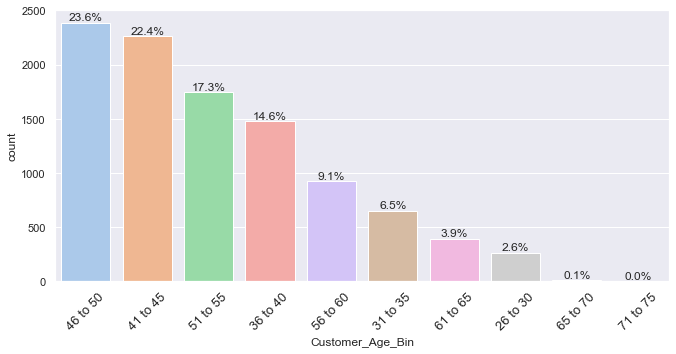

<IPython.core.display.Javascript object>

In [20]:
# Visualize data through plot
labeled_barplot(churn_data, "Customer_Age_Bin", perc=True)

#### Observation of  column "Customer_Age_Bin": 
1. Most of the customers fall under age range 46 to 50
2. Second most of the customers fall under age range 41-45
3. Third most of the customers fall under age range 51-55

##### Univariate Analysis - Column "Gender"

In [21]:
# Basic summary
churn_data[["Gender"]].describe()

,Gender
count,10127
unique,2
top,F
freq,5358


<IPython.core.display.Javascript object>

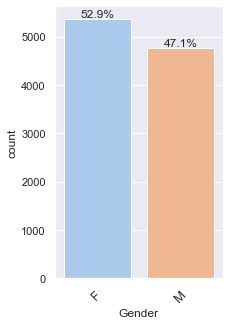

<IPython.core.display.Javascript object>

In [22]:
# Visualize data through plot
labeled_barplot(churn_data, "Gender", perc=True)

#### Observation of  column "Gender": 
1. This is a categorical variable
2. There are only two values "F" which means "Female" and "M" which means "Male"
3. Most of the customers were "Female" (52.9%) compared to "Male" (47.1%)
4. There are no missing values

##### Univariate Analysis - Column "Dependent_count"

In [23]:
# Basic summary
churn_data[["Dependent_count"]].describe()

,Dependent_count
count,10127.000000
mean,2.346203
std,1.298908
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,5.000000


<IPython.core.display.Javascript object>

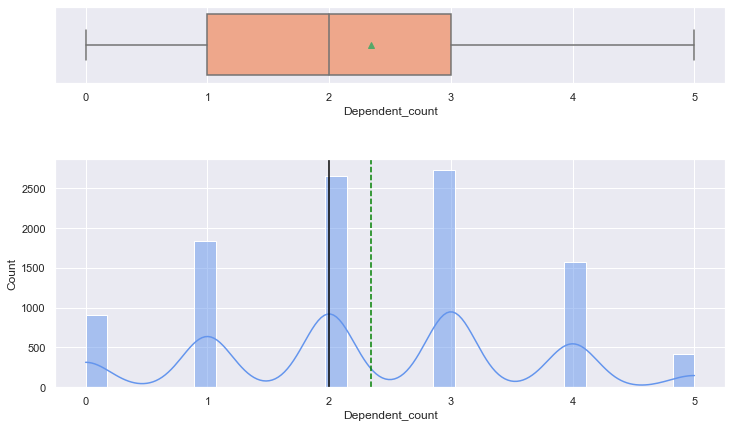

<IPython.core.display.Javascript object>

In [24]:
# Visualize data through plot
hist_boxplot(churn_data, "Dependent_count", kde=True)

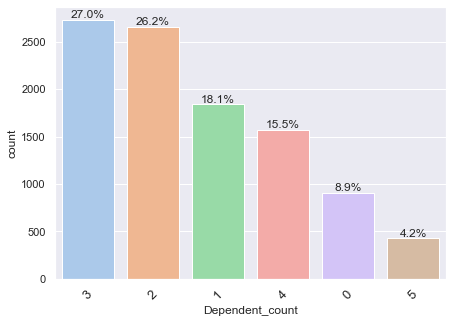

<IPython.core.display.Javascript object>

In [25]:
# Visualize data through plot
labeled_barplot(churn_data, "Dependent_count", perc=True)

#### Observation of  column "Dependent_count": 
1. This is a categorical variable even though values are numerical
2. There are only six values and they are in sequencial order
3. Most of the customers had "3" dependents (52.9%), followed by "2" (26.2%) and "1" (18.1%)
4. There are no missing values

##### Univariate Analysis - Column "Education_Level"

In [26]:
# Basic summary
churn_data[["Education_Level"]].describe()

,Education_Level
count,8608
unique,6
top,Graduate
freq,3128


<IPython.core.display.Javascript object>

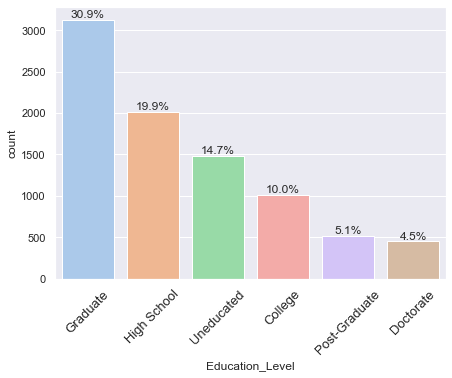

<IPython.core.display.Javascript object>

In [27]:
# Visualize data through plot
labeled_barplot(churn_data, "Education_Level", perc=True)

#### Observation of  column "Education_Level": 
1. This is a categorical variable
2. There are only six values
3. Most of the customers were "Graduate" (30.9%), followed by "High School" (19.9%) and "Uneducated" (14.7%)
4. There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Graduate"

##### Univariate Analysis - Column "Marital_Status"

In [28]:
# Basic summary
churn_data[["Marital_Status"]].describe()

,Marital_Status
count,9378
unique,3
top,Married
freq,4687


<IPython.core.display.Javascript object>

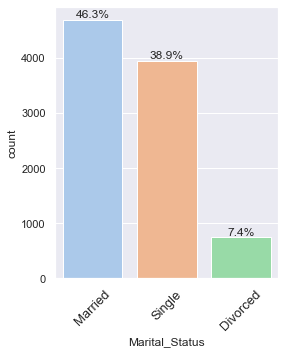

<IPython.core.display.Javascript object>

In [29]:
# Visualize data through plot
labeled_barplot(churn_data, "Marital_Status", perc=True)

#### Observation of  column "Marital_Status": 
1. This is a categorical variable 
2. There are only three values 
3. Most of the customers were "Married" (46.3%), followed by "Single" (38.9%) and "Divorced" (7.4%)
4. There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Married"

##### Univariate Analysis - Column "Income_Category"

In [30]:
# Basic summary
churn_data[["Income_Category"]].describe()

,Income_Category
count,10127
unique,6
top,Less than $40K
freq,3561


<IPython.core.display.Javascript object>

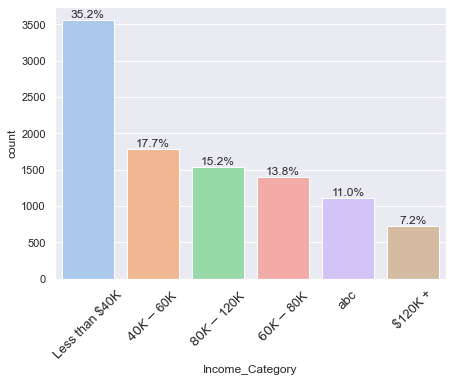

<IPython.core.display.Javascript object>

In [31]:
# Visualize data through plot
labeled_barplot(churn_data, "Income_Category", perc=True)

#### Observation of  column "Income_Category": 
1. This is a categorical variable. However, since this is income, its in a sequential order and can be converted into numerical values
2. There are only six values
3. Most of the customers were having income "Less than $40K" (35.2%), followed by "40K - 60K" (17.7%) and "80K - 120K" (15.2%)
4. There are no missing values. But, value "abc" seems to be invalid and it can be converted as a null value and treated with imputation of median since this is a numeric sequential value.

##### Univariate Analysis - Column "Card_Category"

In [32]:
# Basic summary
churn_data[["Card_Category"]].describe()

,Card_Category
count,10127
unique,4
top,Blue
freq,9436


<IPython.core.display.Javascript object>

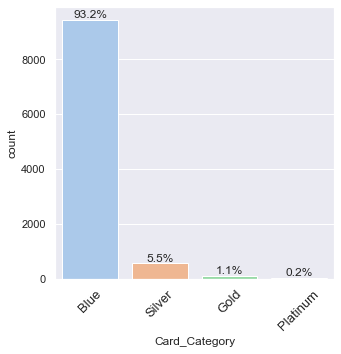

<IPython.core.display.Javascript object>

In [33]:
# Visualize data through plot
labeled_barplot(churn_data, "Card_Category", perc=True)

#### Observation of  column "Card_Category": 
1. This is a categorical variable
2. There are only four values
3. Most of the customers were having "Blue" card (93.2%), followed by "Silver" (5.5%) and "Gold" (1.1%)
4. There are no missing values

##### Univariate Analysis - Column "Months_on_book"

In [34]:
# Basic summary
churn_data[["Months_on_book"]].describe()

,Months_on_book
count,10127.000000
mean,35.928409
std,7.986416
min,13.000000
25%,31.000000
50%,36.000000
75%,40.000000
max,56.000000


<IPython.core.display.Javascript object>

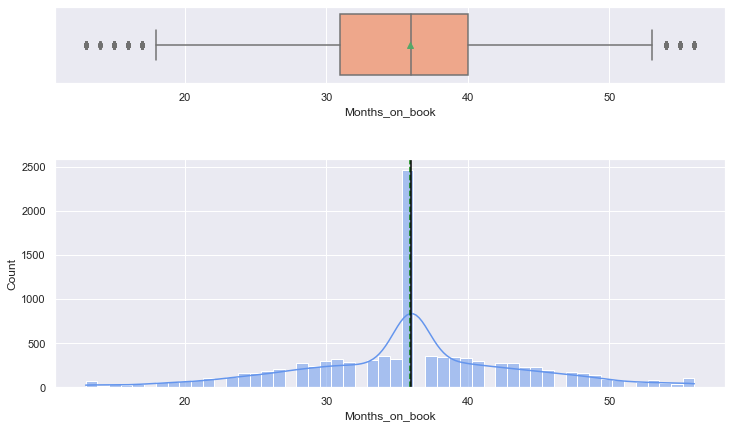

<IPython.core.display.Javascript object>

In [35]:
# Visualize data through plot
hist_boxplot(churn_data, "Months_on_book", kde=True)

#### Observation of  column "Months_on_book": 
1. It looks like a normal distribution.
2. It is not at all skewed
3. It has few outliers. But, they seems to be very close to upper and lower whisker. So it can be legitimate values.
4. Mean and Median are same
5. Mean is 36 (3 years) and median is also 36 (3 years)
6. There are no missing values

In [36]:
# Create bins for Months_on_book for ploting purpose
churn_data["Months_on_book_Bin"] = pd.cut(
    churn_data["Months_on_book"],
    [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60],
    labels=[
        "10 to 15",
        "16 to 20",
        "21 to 25",
        "26 to 30",
        "31 to 35",
        "36 to 40",
        "41 to 45",
        "46 to 50",
        "51 to 55",
        "56 to 60",
    ],
)

<IPython.core.display.Javascript object>

In [37]:
# Basic summary
churn_data[["Months_on_book_Bin"]].describe()

,Months_on_book_Bin
count,10127
unique,10
top,36 to 40
freq,3842


<IPython.core.display.Javascript object>

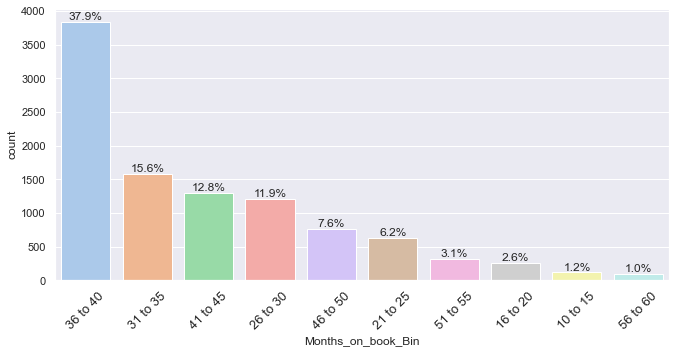

<IPython.core.display.Javascript object>

In [38]:
# Visualize data through plot
labeled_barplot(churn_data, "Months_on_book_Bin", perc=True)

#### Observation of  column "Months_on_book_Bin": 
1. Most of the customers fall under number of months range 36 to 40. Looks like most of customers were card holders for 3 years
2. Second most of the customers fall under number of months range 31-35
3. Third most of the customers fall under number of months range 41-45

##### Univariate Analysis - Column "Total_Relationship_Count"

In [39]:
# Basic summary
churn_data[["Total_Relationship_Count"]].describe()

,Total_Relationship_Count
count,10127.000000
mean,3.812580
std,1.554408
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,6.000000


<IPython.core.display.Javascript object>

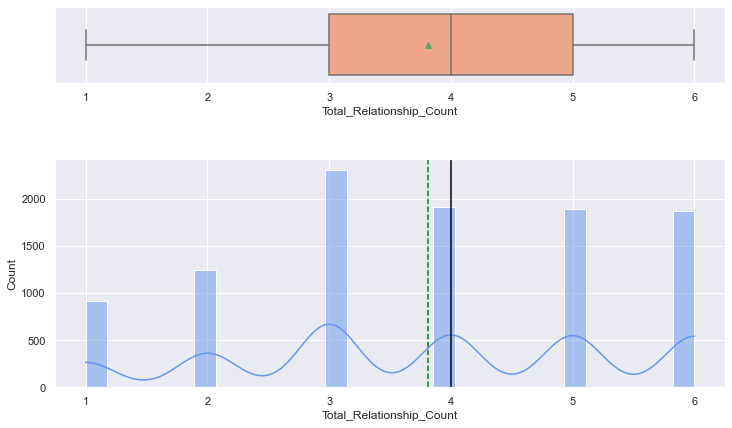

<IPython.core.display.Javascript object>

In [40]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Relationship_Count", kde=True)

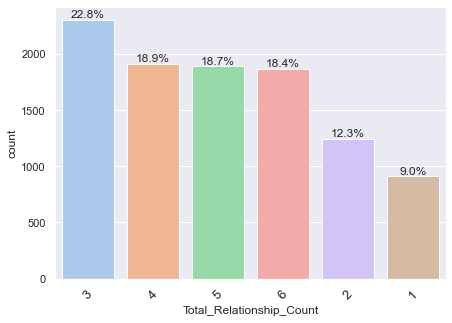

<IPython.core.display.Javascript object>

In [41]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Relationship_Count", perc=True)

#### Observation of  column "Total_Relationship_Count": 
1. This is a categorical variable even though values are numerical
2. There are only six values and they are in sequencial order
3. Most of the customers had "3" products held (22.8%), followed by "4" (18.9%) and "5" (18.7%)
4. There are no missing values

##### Univariate Analysis - Column "Months_Inactive_12_mon"

In [42]:
# Basic summary
churn_data[["Months_Inactive_12_mon"]].describe()

,Months_Inactive_12_mon
count,10127.000000
mean,2.341167
std,1.010622
min,0.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,6.000000


<IPython.core.display.Javascript object>

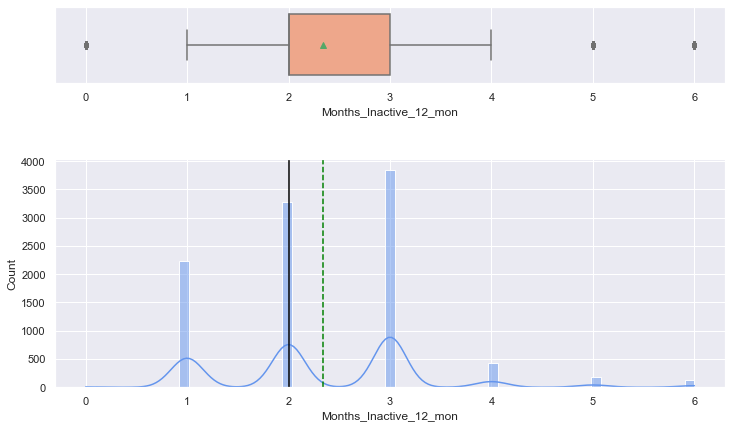

<IPython.core.display.Javascript object>

In [43]:
# Visualize data through plot
hist_boxplot(churn_data, "Months_Inactive_12_mon", kde=True)

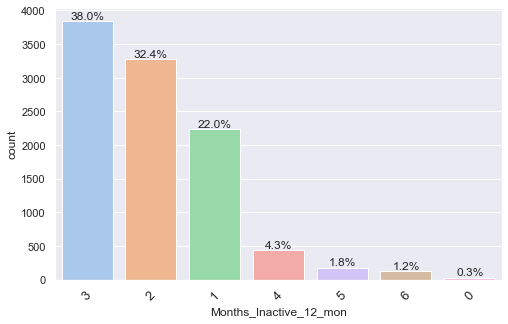

<IPython.core.display.Javascript object>

In [44]:
# Visualize data through plot
labeled_barplot(churn_data, "Months_Inactive_12_mon", perc=True)

#### Observation of  column "Months_Inactive_12_mon": 
1. This is a categorical variable even though values are numerical
2. There are only seven values and they are in sequencial order
3. Most of the customers were inactive for "3" months in last 12 months(38.8%), followed by "2" (32.4%) and "1" (22.0%)
4. There are no missing values

##### Univariate Analysis - Column "Contacts_Count_12_mon"

In [45]:
# Basic summary
churn_data[["Contacts_Count_12_mon"]].describe()

,Contacts_Count_12_mon
count,10127.000000
mean,2.455317
std,1.106225
min,0.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,6.000000


<IPython.core.display.Javascript object>

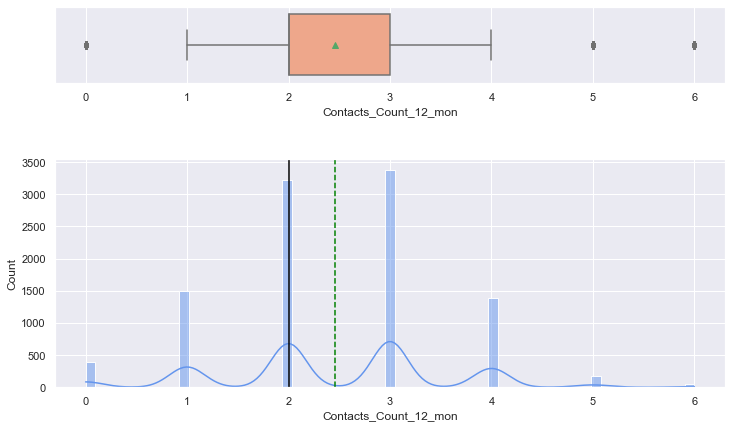

<IPython.core.display.Javascript object>

In [46]:
# Visualize data through plot
hist_boxplot(churn_data, "Contacts_Count_12_mon", kde=True)

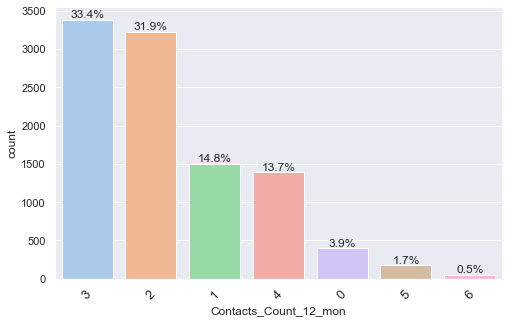

<IPython.core.display.Javascript object>

In [47]:
# Visualize data through plot
labeled_barplot(churn_data, "Contacts_Count_12_mon", perc=True)

#### Observation of  column "Contacts_Count_12_mon": 
1. This is a categorical variable even though values are numerical
2. There are only seven values and they are in sequencial order
3. Most of the customers had "3" contacts in last 12 months (33.4%), followed by "2" (31.9%) and "1" (14.8%)
4. There are no missing values

##### Univariate Analysis - Column "Credit_Limit"

In [48]:
# Basic summary
churn_data[["Credit_Limit"]].describe()

,Credit_Limit
count,10127.000000
mean,8631.953698
std,9088.776650
min,1438.300000
25%,2555.000000
50%,4549.000000
75%,11067.500000
max,34516.000000


<IPython.core.display.Javascript object>

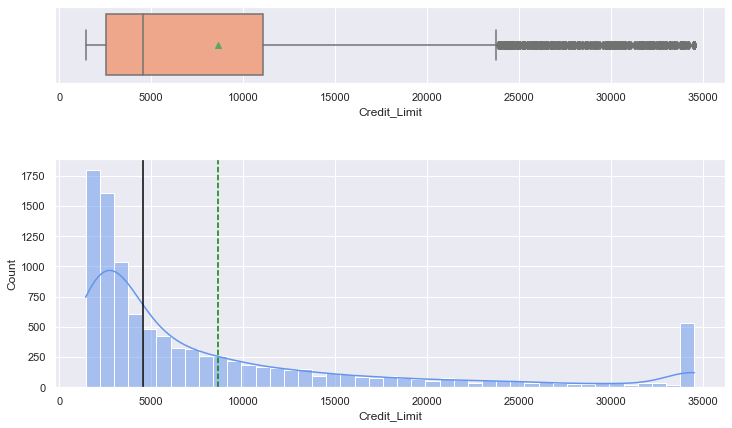

<IPython.core.display.Javascript object>

In [49]:
# Visualize data through plot
hist_boxplot(churn_data, "Credit_Limit", kde=True)

#### Observation of  column "Credit_Limit": 
1. It doesn't look like a normal distribution.
2. It is extremely right skewed
3. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split**
4. Mean and Median are not same
5. Mean is 8632 and median is 4549
6. There are no missing values

In [50]:
churn_data["Credit_Limit_Log"] = np.log(churn_data["Credit_Limit"])

<IPython.core.display.Javascript object>

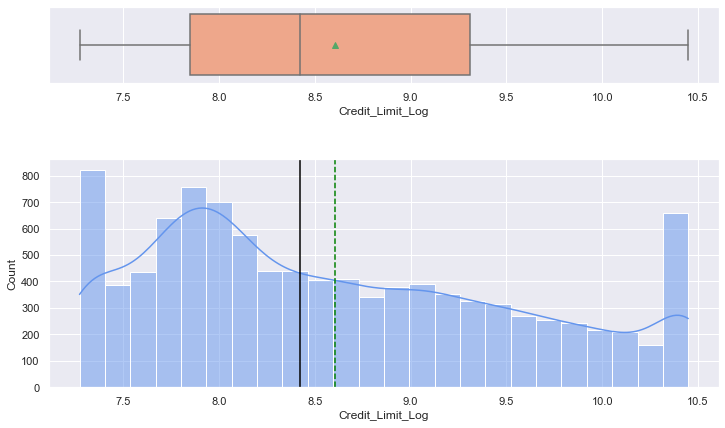

<IPython.core.display.Javascript object>

In [51]:
# Visualize data through plot
hist_boxplot(churn_data, "Credit_Limit_Log", kde=True)

#### Observation of  column "Credit_Limit_Log": 
1. It looks like a normal distribution.
2. It is not much skewed
3. It has no outliers
4. Mean and Median are almost same
5. There are no missing values

In [52]:
# Create bins for Credit_Limit for ploting purpose
churn_data["Credit_Limit_Bin"] = pd.cut(
    churn_data["Credit_Limit"],
    [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000],
    labels=[
        "0 to 5000",
        "5001 to 10000",
        "10001 to 15000",
        "15001 to 20000",
        "20001 to 25000",
        "25001 to 30000",
        "30001 to 35000",
        "35001 to 40000",
    ],
)

<IPython.core.display.Javascript object>

In [53]:
# Basic summary
churn_data[["Credit_Limit_Bin"]].describe()

,Credit_Limit_Bin
count,10127
unique,7
top,0 to 5000
freq,5359


<IPython.core.display.Javascript object>

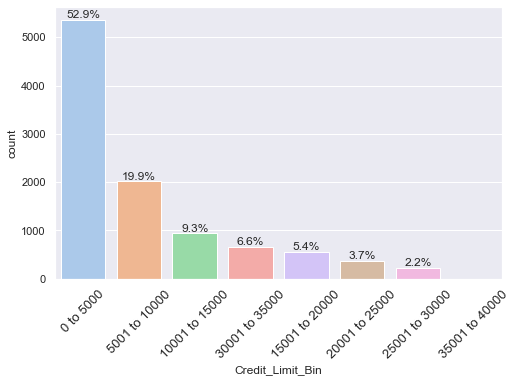

<IPython.core.display.Javascript object>

In [54]:
# Visualize data through plot
labeled_barplot(churn_data, "Credit_Limit_Bin", perc=True)

#### Observation of  column "Credit_Limit_Bin": 
1. Most of the customers fall under credit range 0 to 5000
2. Second most of the customers fall under credit range 5001-10000
3. Third most of the customers fall under credit range 10001-15000

##### Univariate Analysis - Column "Total_Revolving_Bal"

In [55]:
# Basic summary
churn_data[["Total_Revolving_Bal"]].describe()

,Total_Revolving_Bal
count,10127.000000
mean,1162.814061
std,814.987335
min,0.000000
25%,359.000000
50%,1276.000000
75%,1784.000000
max,2517.000000


<IPython.core.display.Javascript object>

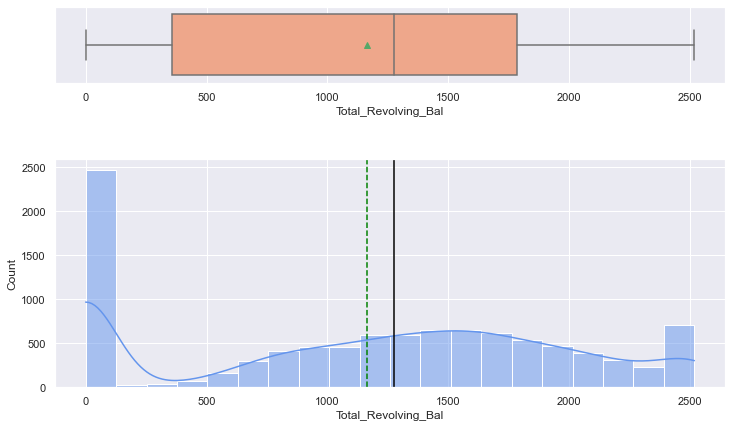

<IPython.core.display.Javascript object>

In [56]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Revolving_Bal", kde=True)

#### Observation of  column "Total_Revolving_Bal": 
1. It doesnt look like a normal distribution. There are a lot of zero values
2. It is not skewed
3. It has no outliers
4. Mean and Median are not same
5. Mean is 1163 and median is 1276
6. There are no missing values

In [57]:
# Create bins for Total_Revolving_Bal for ploting purpose
churn_data["Total_Revolving_Bal_Bin"] = pd.cut(
    churn_data["Total_Revolving_Bal"],
    [-np.inf, 0, 500, 1000, 1500, 2000, 2500, 3000],
    labels=[
        "Below 1 (0)",
        "1 to 500",
        "501 to 1000",
        "1001 to 1500",
        "1501 to 2000",
        "2001 to 2500",
        "2501 to 3000",
    ],
)

<IPython.core.display.Javascript object>

In [58]:
# Basic summary
churn_data[["Total_Revolving_Bal_Bin"]].describe()

,Total_Revolving_Bal_Bin
count,10127
unique,7
top,Below 1 (0)
freq,2470


<IPython.core.display.Javascript object>

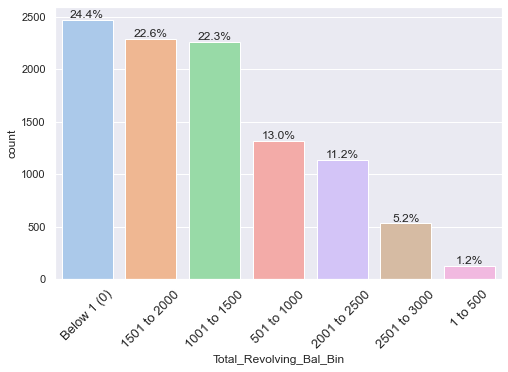

<IPython.core.display.Javascript object>

In [59]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Revolving_Bal_Bin", perc=True)

#### Observation of  column "Total_Revolving_Bal_Bin": 
1. Most of the customers fall under revolving balance range 0
2. Second most of the customers fall under revolving balance range "1501 to 2000"
3. Third most of the customers fall under revolving balance range "1001 to 1500"

##### Univariate Analysis - Column "Avg_Open_To_Buy"

In [60]:
# Basic summary
churn_data[["Avg_Open_To_Buy"]].describe()

,Avg_Open_To_Buy
count,10127.000000
mean,7469.139637
std,9090.685324
min,3.000000
25%,1324.500000
50%,3474.000000
75%,9859.000000
max,34516.000000


<IPython.core.display.Javascript object>

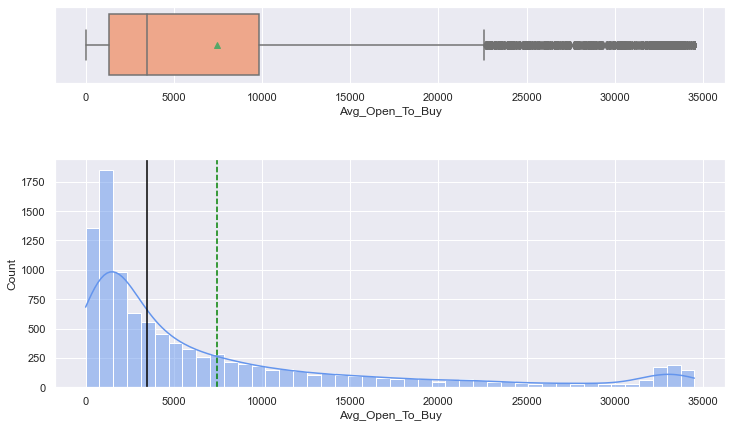

<IPython.core.display.Javascript object>

In [61]:
# Visualize data through plot
hist_boxplot(churn_data, "Avg_Open_To_Buy", kde=True)

#### Observation of  column "Avg_Open_To_Buy": 
1. It doesn't look like a normal distribution.
2. It is extremely right skewed
3. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split**
4. Mean and Median are not same
5. Mean is 7469 and median is 3474
6. There are no missing values

In [62]:
churn_data["Avg_Open_To_Buy_sqrt"] = np.sqrt(churn_data["Avg_Open_To_Buy"])

<IPython.core.display.Javascript object>

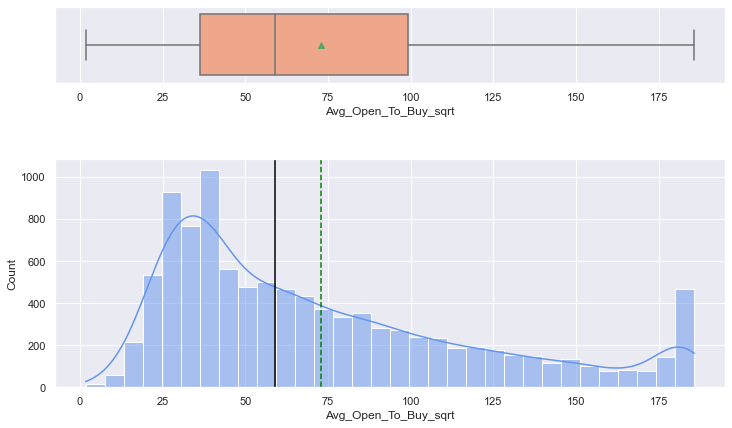

<IPython.core.display.Javascript object>

In [63]:
# Visualize data through plot
hist_boxplot(churn_data, "Avg_Open_To_Buy_sqrt", kde=True)

#### Observation of  column "Avg_Open_To_Buy_sqrt": 
1. It looks like a normal distribution.
2. It is not skewed
3. It has no outliers
4. Mean and Median are more closer now
6. There are no missing values

In [64]:
# Create bins for Avg_Open_To_Buy for ploting purpose
churn_data["Avg_Open_To_Buy_Bin"] = pd.cut(
    churn_data["Avg_Open_To_Buy"],
    [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000],
    labels=[
        "0 to 5000",
        "5001 to 10000",
        "10001 to 15000",
        "15001 to 20000",
        "20001 to 25000",
        "25001 to 30000",
        "30001 to 35000",
    ],
)

<IPython.core.display.Javascript object>

In [65]:
# Basic summary
churn_data[["Avg_Open_To_Buy_Bin"]].describe()

,Avg_Open_To_Buy_Bin
count,10127
unique,7
top,0 to 5000
freq,5989


<IPython.core.display.Javascript object>

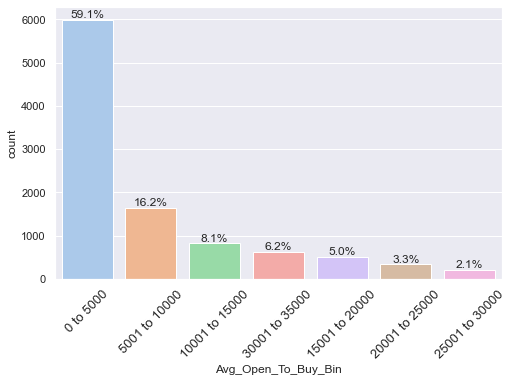

<IPython.core.display.Javascript object>

In [66]:
# Visualize data through plot
labeled_barplot(churn_data, "Avg_Open_To_Buy_Bin", perc=True)

#### Observation of  column "Avg_Open_To_Buy_Bin": 
1. Most of the customers fall under revolving balance range 0
2. Second most of the customers fall under revolving balance range "1501 to 2000"
3. Third most of the customers fall under revolving balance range "1001 to 1500"

##### Univariate Analysis - Column "Total_Trans_Amt"

In [67]:
# Basic summary
churn_data[["Total_Trans_Amt"]].describe()

,Total_Trans_Amt
count,10127.000000
mean,4404.086304
std,3397.129254
min,510.000000
25%,2155.500000
50%,3899.000000
75%,4741.000000
max,18484.000000


<IPython.core.display.Javascript object>

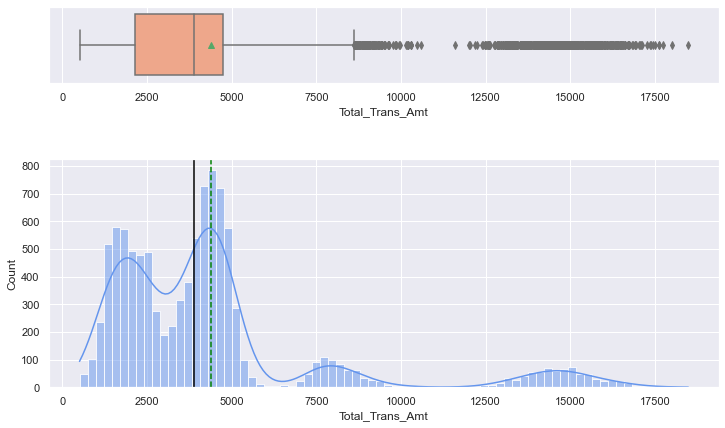

<IPython.core.display.Javascript object>

In [68]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Trans_Amt", kde=True)

#### Observation of  column "Total_Trans_Amt": 
1. This distribution has multiple peaks and valleys. Looks like there are different ranges for 
2. But, it's is extremely right skewed
3. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split**
4. Mean and Median are almost same
5. Mean is 4404 and median is 3899
6. There are no missing values

In [69]:
churn_data["Total_Trans_Amt_Log"] = np.log(churn_data["Total_Trans_Amt"])

<IPython.core.display.Javascript object>

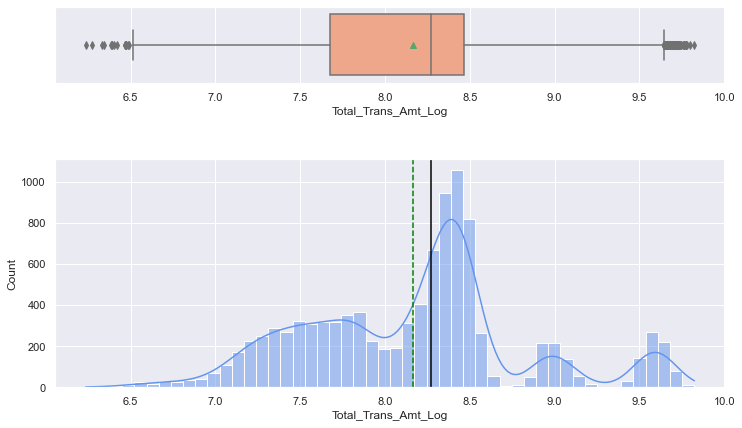

<IPython.core.display.Javascript object>

In [70]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Trans_Amt_Log", kde=True)

#### Observation of  column "Total_Trans_Amt_Log": 
1. This distribution still has many peaks and valleys. But, its better than before
2. It is equally skewed on both sides
3. It has outliers. But, they are very close to upper and lower whiskers.
4. Mean and Median are more closer now
5. There are no missing values

In [71]:
# Create bins for Total_Trans_Amt for ploting purpose
churn_data["Total_Trans_Amt_Bin"] = pd.cut(
    churn_data["Total_Trans_Amt"],
    [0, 2500, 5000, 7500, 10000, 12500, 15000, 17500, 20000],
    labels=[
        "0 to 2500",
        "2501 to 5000",
        "5001 to 7500",
        "7501 to 10000",
        "10001 to 12500",
        "12501 to 15000",
        "15001 to 17500",
        "17501 to 20000",
    ],
)

<IPython.core.display.Javascript object>

In [72]:
# Basic summary
churn_data[["Total_Trans_Amt_Bin"]].describe()

,Total_Trans_Amt_Bin
count,10127
unique,8
top,2501 to 5000
freq,5004


<IPython.core.display.Javascript object>

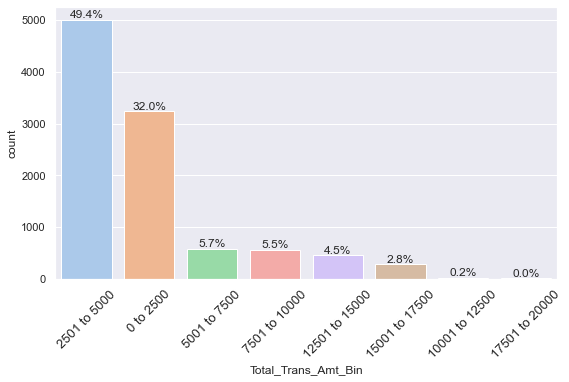

<IPython.core.display.Javascript object>

In [73]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Trans_Amt_Bin", perc=True)

#### Observation of  column "Total_Trans_Amt_Bin": 
1. Most of the customers fall under total transaction range "2501 to 5000"
2. Second most of the customers fall under total transaction range "0 to 2500"
3. Third most of the customers fall under total transaction range "5001 to 7500"

##### Univariate Analysis - Column "Total_Trans_Ct"

In [74]:
# Basic summary
churn_data[["Total_Trans_Ct"]].describe()

,Total_Trans_Ct
count,10127.000000
mean,64.858695
std,23.472570
min,10.000000
25%,45.000000
50%,67.000000
75%,81.000000
max,139.000000


<IPython.core.display.Javascript object>

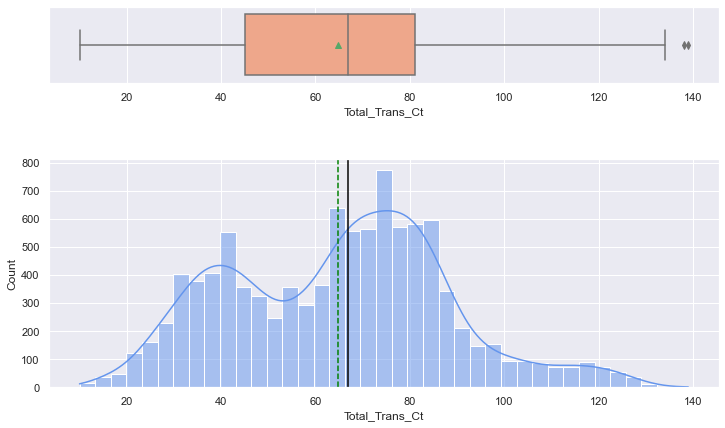

<IPython.core.display.Javascript object>

In [75]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Trans_Ct", kde=True)

#### Observation of  column "Total_Trans_Ct": 
1. This distribution has peaks and valleys
2. It is sligtly right skewed
3. It has few outliers, but, they are closer to upper whisker
4. Mean and Median are almost same
5. Mean is 65 and median is 67
6. There are no missing values

In [76]:
# Create bins for Total_Trans_Ct for ploting purpose
churn_data["Total_Trans_Ct_Bin"] = pd.cut(
    churn_data["Total_Trans_Ct"],
    [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140],
    labels=[
        "0 to 10",
        "10 to 20",
        "21 to 30",
        "31 to 40",
        "41 to 50",
        "51 to 60",
        "61 to 70",
        "71 to 80",
        "81 to 90",
        "91 to 100",
        "101 to 110",
        "111 to 120",
        "121 to 130",
        "131 to 140",
    ],
)

<IPython.core.display.Javascript object>

In [77]:
# Basic summary
churn_data[["Total_Trans_Ct_Bin"]].describe()

,Total_Trans_Ct_Bin
count,10127
unique,14
top,71 to 80
freq,1889


<IPython.core.display.Javascript object>

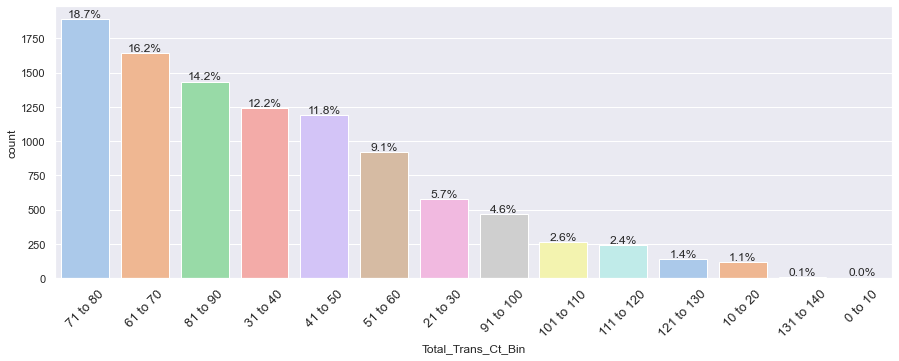

<IPython.core.display.Javascript object>

In [78]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Trans_Ct_Bin", perc=True)

#### Observation of  column "Total_Trans_Ct_Bin": 
1. Most of the customers fall under total transaction count range "71 to 80"
2. Second most of the customers fall total transaction count range "61 to 70"
3. Third most of the customers fall total transaction count range "81 to 90"

##### Univariate Analysis - Column "Total_Ct_Chng_Q4_Q1"

In [79]:
# Basic summary
churn_data[["Total_Ct_Chng_Q4_Q1"]].describe()

,Total_Ct_Chng_Q4_Q1
count,10127.000000
mean,0.712222
std,0.238086
min,0.000000
25%,0.582000
50%,0.702000
75%,0.818000
max,3.714000


<IPython.core.display.Javascript object>

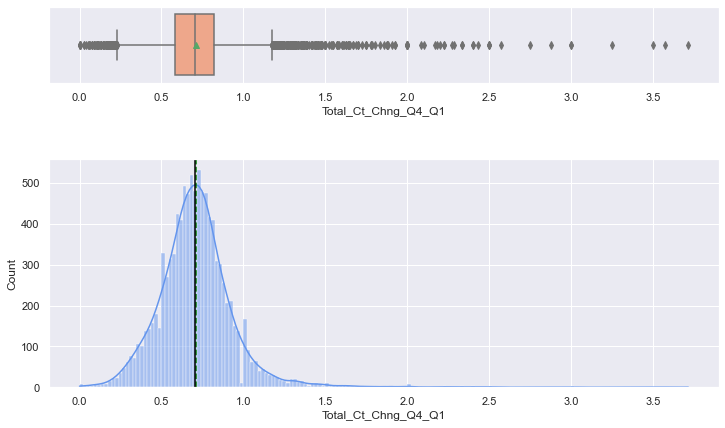

<IPython.core.display.Javascript object>

In [80]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Ct_Chng_Q4_Q1", kde=True)

#### Observation of  column "Total_Ct_Chng_Q4_Q1": 
1. It has a normal distribution
2. It is heavily right skewed
3. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a square root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split**
4. Mean and Median are almost same
5. Mean is 0.71 and median is 0.70
6. There are no missing values

In [81]:
churn_data["Total_Ct_Chng_Q4_Q1_Sqrt"] = np.sqrt(churn_data["Total_Ct_Chng_Q4_Q1"])

<IPython.core.display.Javascript object>

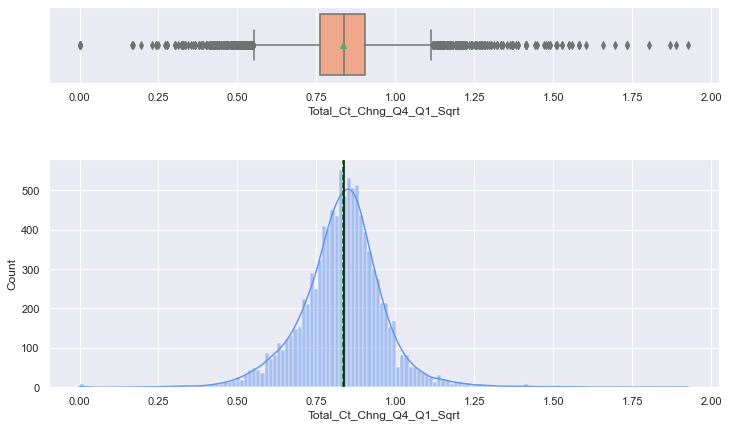

<IPython.core.display.Javascript object>

In [82]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Ct_Chng_Q4_Q1_Sqrt", kde=True)

#### Observation of  column "Total_Ct_Chng_Q4_Q1_Sqrt": 
1. This distribution looks better now
2. It is equally skewed on both sides
3. It has outliers. But, they are very close to upper and lower whiskers.
4. Mean and Median are more closer now
5. There are no missing values

In [83]:
# Create bins for Total_Ct_Chng_Q4_Q1 for ploting purpose
churn_data["Total_Ct_Chng_Q4_Q1_Bin"] = pd.cut(
    churn_data["Total_Ct_Chng_Q4_Q1"],
    [-np.inf, 0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0],
    labels=[
        "Zero",
        "0.1 to 0.5",
        "0.6 to 1.0",
        "1.1 to 1.5",
        "1.6 to 2.0",
        "2.1 to 2.5",
        "2.6 to 3.0",
        "3.1 to 3.5",
        "3.6 to 4.0",
    ],
)

<IPython.core.display.Javascript object>

In [84]:
# Basic summary
churn_data[["Total_Ct_Chng_Q4_Q1_Bin"]].describe()

,Total_Ct_Chng_Q4_Q1_Bin
count,10127
unique,9
top,0.6 to 1.0
freq,7928


<IPython.core.display.Javascript object>

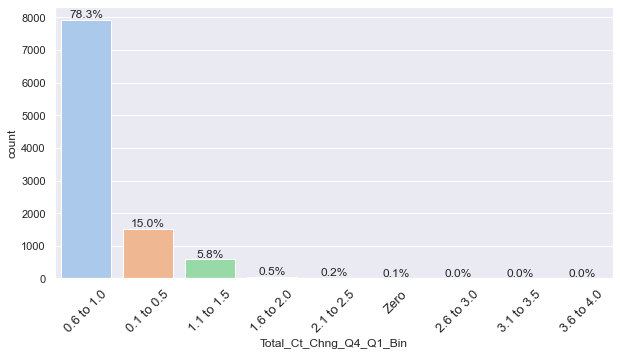

<IPython.core.display.Javascript object>

In [85]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Ct_Chng_Q4_Q1_Bin", perc=True)

#### Observation of  column "Total_Ct_Chng_Q4_Q1_Bin": 
1. Most of the customers fall under ratio of total transaction count range "0.6 to 1.0"
2. Second most of the customers fall ratio of total transaction count range "0.1 to 0.5"
3. Third most of the customers fall ratio of total transaction count range "1.1 to 1.5"

##### Univariate Analysis - Column "Total_Amt_Chng_Q4_Q1"

In [86]:
# Basic summary
churn_data[["Total_Amt_Chng_Q4_Q1"]].describe()

,Total_Amt_Chng_Q4_Q1
count,10127.000000
mean,0.759941
std,0.219207
min,0.000000
25%,0.631000
50%,0.736000
75%,0.859000
max,3.397000


<IPython.core.display.Javascript object>

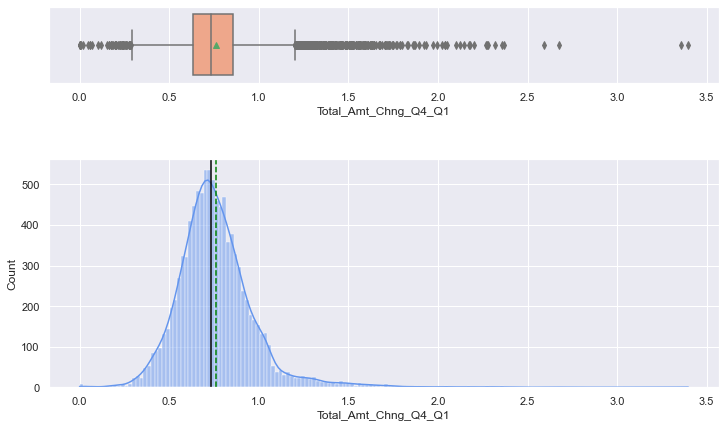

<IPython.core.display.Javascript object>

In [87]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Amt_Chng_Q4_Q1", kde=True)

#### Observation of  column "Total_Amt_Chng_Q4_Q1": 
1. It looks like a normal distribution.
2. But, it's is extremely right skewed
3. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split**
4. Mean and Median are almost same
5. Mean is 0.760 and median is 0.736
6. There are no missing values

In [88]:
churn_data["Total_Amt_Chng_Q4_Q1_Sqrt"] = np.sqrt(churn_data["Total_Amt_Chng_Q4_Q1"])

<IPython.core.display.Javascript object>

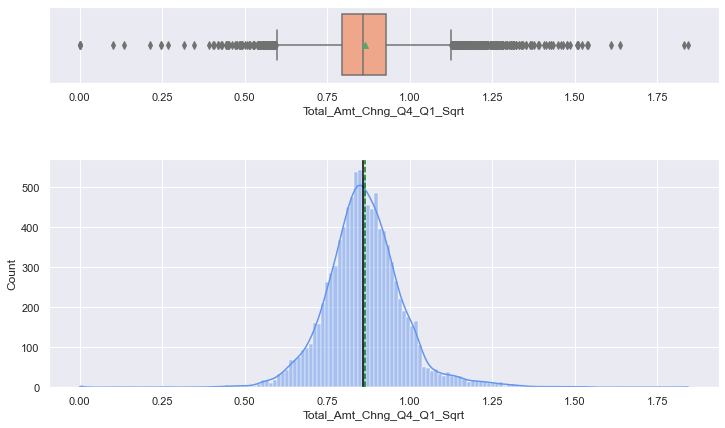

<IPython.core.display.Javascript object>

In [89]:
# Visualize data through plot
hist_boxplot(churn_data, "Total_Amt_Chng_Q4_Q1_Sqrt", kde=True)

#### Observation of  column "Total_Amt_Chng_Q4_Q1_Sqrt": 
1. It looks like a normal distribution.
2. It is equally skewed on both sides
3. It has outliers. But, they are very close to upper and lower whiskers.
4. Mean and Median are more closer now
5. There are no missing values

In [90]:
# Create bins for Total_Amt_Chng_Q4_Q1 for ploting purpose
churn_data["Total_Amt_Chng_Q4_Q1_Bin"] = pd.cut(
    churn_data["Total_Amt_Chng_Q4_Q1"],
    [-np.inf, 0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5],
    labels=[
        "Zero",
        "0.1 to 0.5",
        "0.6 to 1.0",
        "1.1 to 1.5",
        "1.6 to 2.0",
        "2.1 to 2.5",
        "2.6 to 3.0",
        "3.1 to 3.5",
    ],
)

<IPython.core.display.Javascript object>

In [91]:
# Basic summary
churn_data[["Total_Amt_Chng_Q4_Q1_Bin"]].describe()

,Total_Amt_Chng_Q4_Q1_Bin
count,10127
unique,8
top,0.6 to 1.0
freq,8392


<IPython.core.display.Javascript object>

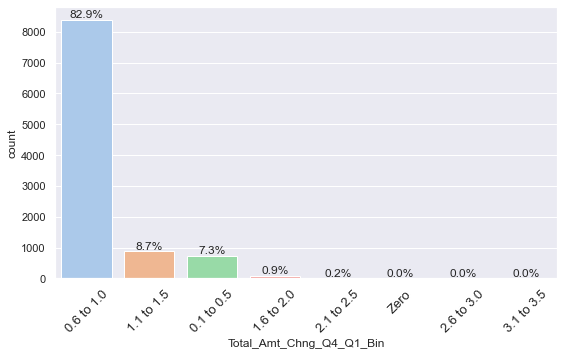

<IPython.core.display.Javascript object>

In [92]:
# Visualize data through plot
labeled_barplot(churn_data, "Total_Amt_Chng_Q4_Q1_Bin", perc=True)

#### Observation of  column "Total_Amt_Chng_Q4_Q1_Bin": 
1. Most of the customers fall under ratio range "0.6 to 1.0". This means customers had kept almost same total transaction amount in Q4 and Q1
2. Second most of the customers fall under ratio range "1.1 to 1.5"
3. Third most of the customers fall under ratio range "0.1 to 0.5"

##### Univariate Analysis - Column "Avg_Utilization_Ratio"

In [93]:
# Basic summary
churn_data[["Avg_Utilization_Ratio"]].describe()

,Avg_Utilization_Ratio
count,10127.000000
mean,0.274894
std,0.275691
min,0.000000
25%,0.023000
50%,0.176000
75%,0.503000
max,0.999000


<IPython.core.display.Javascript object>

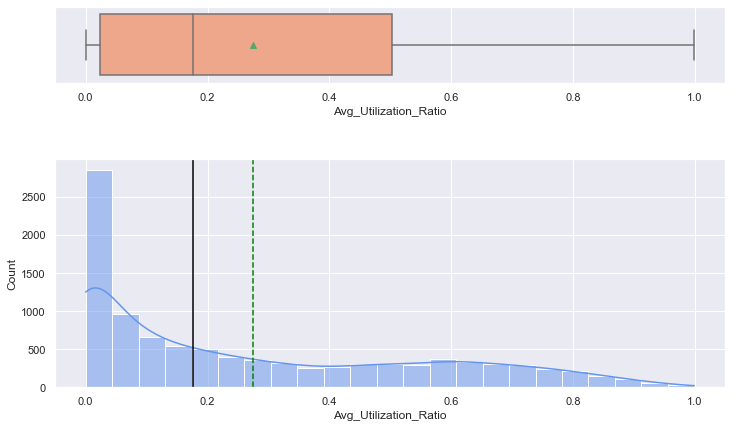

<IPython.core.display.Javascript object>

In [94]:
# Visualize data through plot
hist_boxplot(churn_data, "Avg_Utilization_Ratio", kde=True)

#### Observation of  column "Avg_Utilization_Ratio": 
1. It looks like a normal distribution.
2. It is not skewed
3. It has no outliers
4. Mean and Median are not same
5. Mean is 0.27 and median is 0.18
6. There are no missing values

In [95]:
# Create bins for Avg_Utilization_Ratio for ploting purpose
churn_data["Avg_Utilization_Ratio_Bin"] = pd.cut(
    churn_data["Avg_Utilization_Ratio"],
    [-np.inf, 0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    labels=[
        "Zero",
        "0.01 to 0.1",
        "0.11 to 0.2",
        "0.21 to 0.3",
        "0.31 to 0.4",
        "0.41 to 0.5",
        "0.51 to 0.6",
        "0.61 to 0.7",
        "0.71 to 0.8",
        "0.81 to 0.9",
        "0.91 to 1.0",
    ],
)

<IPython.core.display.Javascript object>

In [96]:
# Basic summary
churn_data[["Avg_Utilization_Ratio_Bin"]].describe()

,Avg_Utilization_Ratio_Bin
count,10127
unique,11
top,Zero
freq,2470


<IPython.core.display.Javascript object>

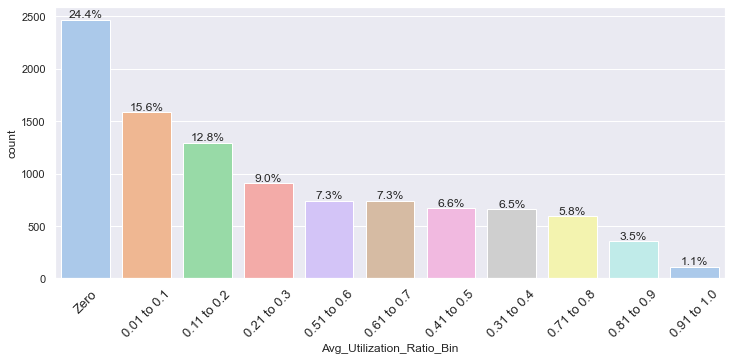

<IPython.core.display.Javascript object>

In [97]:
# Visualize data through plot
labeled_barplot(churn_data, "Avg_Utilization_Ratio_Bin", perc=True)

#### Observation of  column "Avg_Utilization_Ratio_Bin": 
1. Most of the customers fall under ratio of average utilization range is "0". Looks like most of customers doesnt spend much
2. Second most of the customers fall ratio of average utilization range "0.01 to 0.1"
3. Third most of the customers fall ratio of average utilization range "0.11 to 0.2"

#### B. Bivariate & Multivariate Analysis

In [98]:
# Get column and its datatypes for bivariate analysis
churn_data.dtypes

CLIENTNUM                       int64
Attrition_Flag                 object
Customer_Age                    int64
Gender                         object
Dependent_count                 int64
Education_Level                object
Marital_Status                 object
Income_Category                object
Card_Category                  object
Months_on_book                  int64
Total_Relationship_Count        int64
Months_Inactive_12_mon          int64
Contacts_Count_12_mon           int64
Credit_Limit                  float64
Total_Revolving_Bal             int64
Avg_Open_To_Buy               float64
Total_Amt_Chng_Q4_Q1          float64
Total_Trans_Amt                 int64
Total_Trans_Ct                  int64
Total_Ct_Chng_Q4_Q1           float64
Avg_Utilization_Ratio         float64
Customer_Age_Bin             category
Months_on_book_Bin           category
Credit_Limit_Log              float64
Credit_Limit_Bin             category
Total_Revolving_Bal_Bin      category
Avg_Open_To_

<IPython.core.display.Javascript object>

In [99]:
# Converting Attrition Flag to numeric for getting correlation with other features
churn_data["Attrition_Flag"] = churn_data["Attrition_Flag"].apply(
    lambda x: 1 if x == "Attrited Customer" else 0
)

<IPython.core.display.Javascript object>

In [100]:
# Get correlation between each numerical feature
churn_data.corr()

,CLIENTNUM,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Credit_Limit_Log,Avg_Open_To_Buy_sqrt,Total_Trans_Amt_Log,Total_Ct_Chng_Q4_Q1_Sqrt,Total_Amt_Chng_Q4_Q1_Sqrt
CLIENTNUM,1.000000,-0.046430,0.007613,0.006772,0.134588,0.006907,0.005729,0.005694,0.005708,0.000825,0.005633,0.017369,-0.019692,-0.002961,0.007696,0.000266,0.005798,0.006075,-0.015110,0.006792,0.019686
Attrition_Flag,-0.046430,1.000000,0.018203,0.018991,0.013687,-0.150005,0.152449,0.204491,-0.023873,-0.263053,-0.000285,-0.131063,-0.168598,-0.371403,-0.290054,-0.178410,-0.045421,0.006745,-0.226990,-0.334689,-0.152232
Customer_Age,0.007613,0.018203,1.000000,-0.122254,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,0.001151,-0.062042,-0.046446,-0.067097,-0.012143,0.007114,0.003966,0.000754,-0.060822,-0.019162,-0.066744
Dependent_count,0.006772,0.018991,-0.122254,1.000000,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,0.068291,-0.035439,0.025046,0.049912,0.011087,-0.037135,0.057755,0.065072,0.050668,0.012087,-0.033170
Months_on_book,0.134588,0.013687,0.788912,-0.103062,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,0.006732,-0.048959,-0.038591,-0.049819,-0.014072,-0.007541,0.010601,0.008931,-0.048184,-0.020907,-0.053525
Total_Relationship_Count,0.006907,-0.150005,-0.010931,-0.039076,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,-0.072601,0.050119,-0.347229,-0.241891,0.040831,0.067663,-0.063968,-0.072890,-0.299074,0.040878,0.046275
Months_Inactive_12_mon,0.005729,0.152449,0.054361,-0.010768,0.074164,-0.003675,1.000000,0.029493,-0.020394,-0.042210,-0.016605,-0.032247,-0.036982,-0.042787,-0.038989,-0.007503,-0.027234,-0.018614,-0.030852,-0.044720,-0.033210
Contacts_Count_12_mon,0.005694,0.204491,-0.018452,-0.040505,-0.010774,0.055203,0.029493,1.000000,0.020817,-0.053913,0.025646,-0.024445,-0.112774,-0.152213,-0.094997,-0.055471,0.024990,0.031162,-0.131865,-0.105049,-0.031179
Credit_Limit,0.005708,-0.023873,0.002476,0.068065,0.007507,-0.071386,-0.020394,0.020817,1.000000,0.042493,0.995981,0.012813,0.171730,0.075927,-0.002020,-0.482965,0.917781,0.962826,0.105640,-0.003073,0.010920
Total_Revolving_Bal,0.000825,-0.263053,0.014780,-0.002688,0.008623,0.013726,-0.042210,-0.053913,0.042493,1.000000,-0.047167,0.058174,0.064370,0.056060,0.089861,0.624022,0.101996,-0.090828,0.038674,0.097896,0.058681


<IPython.core.display.Javascript object>

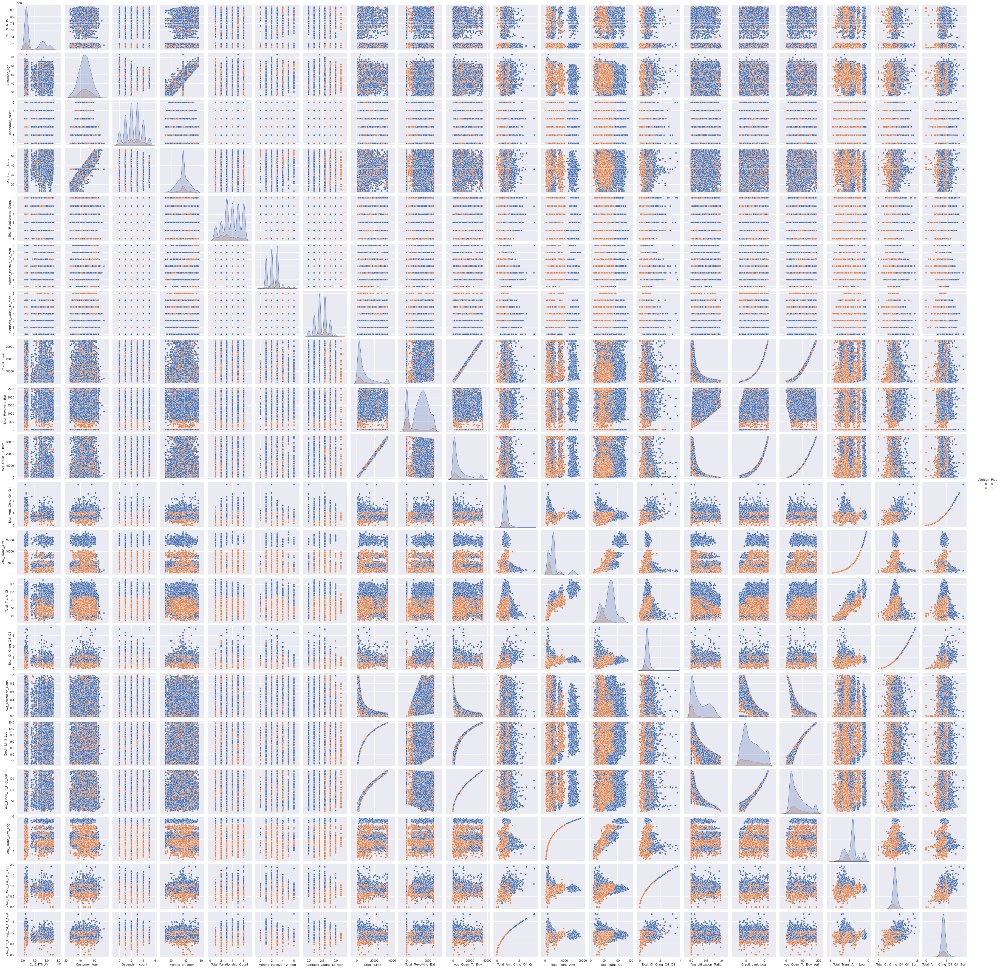

<IPython.core.display.Javascript object>

In [101]:
# Compare each numerical continous feature against each other
sns.pairplot(churn_data, hue="Attrition_Flag")

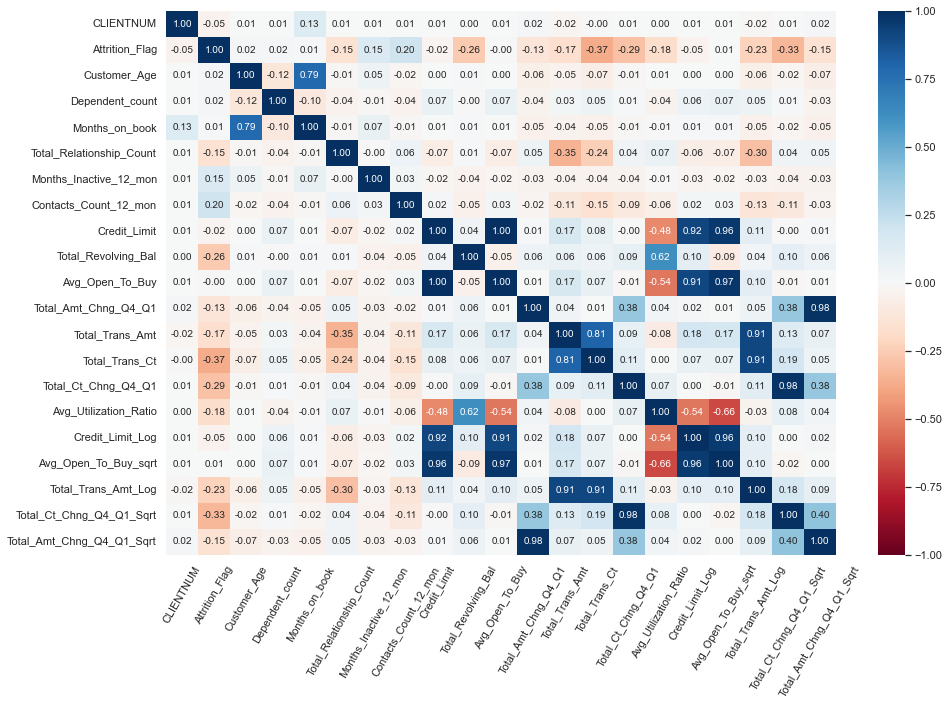

<IPython.core.display.Javascript object>

In [102]:
# Check heatmap for correlation
plt.figure(figsize=(15, 10))
sns.heatmap(
    churn_data.corr(),
    annot=True,
    vmin=-1,
    vmax=1,
    fmt=".2f",
    cmap="RdBu",
    linewidths=0.002,
    linecolor="black",
)
plt.xticks(rotation=60)
plt.show()

#### Observation  on correlation between multiple variables:

1. There are higher positive correlation between below features:

    a) Customer Age and Months on Book
    
    b) Average Open To Buy and Credit Limit (1.0)
    
    c) Total Transaction Amount and Total Transaction Count
    
    d) Total Revolving Balance and Average Utilization Ratio
    
    e) Total Amount Change between Q4-Q1 and Total Transaction Count Change between Q4-Q1
    
    

2. There are higher negative correlation between below features:

    a) Total Transaction Count and Attrition Flag(target variable)
    
    b) Total Transaction Count Change between Q4-Q1 and Attrition Flag(target variable)
    
    c) Total Revolving Balance and Attrition Flag(target variable)
    
    d) Total Transaction Amount and Attrition Flag(target variable)
    
    e) Average Utiliztion Ratio and Attrition Flag(target variable)
    
    f) Total Relationship Count and Attrition Flag(target variable)
    
    g) Total Amount Change between Q4-Q1 and Attrition Flag(target variable)
    
    f) Average Utilization Ratio and Average Open To Buy


    
3. Below features has very weak (almost 0.0) correlation with target variable Attrition Flag. So they wont be good predictor variables and can be dropped:
 
    a) Customer_Age
    
    b) Dependent_count
    
    c) Months_on_book
    
    


In [103]:
# Converting Attrition Flag back to categoric for better plotting with other features
churn_data["Attrition_Flag"] = churn_data["Attrition_Flag"].apply(
    lambda x: "Attrited Customer" if x == 1 else "Existing Customer"
)

<IPython.core.display.Javascript object>

In [104]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    display(pd.DataFrame(tab1))
    print("-" * 100)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(
        kind="bar",
        stacked=True,
        figsize=(count + 5, 4),
        # color=["cornflowerblue", "sandybrown"],
        color=["sandybrown", "cornflowerblue"],
    )
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.xticks(rotation=45)
    plt.show()

<IPython.core.display.Javascript object>

In [105]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):
    """
    Print the histogram and box plots compared with respect to product taken or not

    data: dataframe
    predictor: independent variable
    target: target variable
    """

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of predictor for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="limegreen",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of predictor for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="royalblue",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 0],
        palette=["cornflowerblue", "limegreen"],
    )

    # print("\n\n")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette=["royalblue", "forestgreen"],
    )

    plt.tight_layout(pad=1.08, h_pad=6, w_pad=2)
    plt.show()

<IPython.core.display.Javascript object>

In [106]:
# function to plot a boxplot and a histogram combined with hue and along the same scale.


def hist_boxplot_with_hue(data, column, hue_column, title_text, fig_size=(20, 8)):
    """
    Boxplot and histogram combined with hue

    data: dataframe
    feature: dataframe column
    fig_size: size of figure (default (12,9))
    hue_column: hue
    title_text: title
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,
        sharex=False,
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=fig_size,
    )
    plt.subplots_adjust(hspace=0.5)
    sns.boxplot(data=data, x=column, ax=ax_box2, showmeans=True, color="lemonchiffon")
    sns.histplot(
        data=data,
        x=column,
        ax=ax_hist2,
        hue=hue_column,
        multiple="stack",
        palette="pastel",
    ).set(title=title_text)

    plt.show()

<IPython.core.display.Javascript object>

In [107]:
# Get column and its datatypes for bivariate analysis
churn_data.dtypes

CLIENTNUM                       int64
Attrition_Flag                 object
Customer_Age                    int64
Gender                         object
Dependent_count                 int64
Education_Level                object
Marital_Status                 object
Income_Category                object
Card_Category                  object
Months_on_book                  int64
Total_Relationship_Count        int64
Months_Inactive_12_mon          int64
Contacts_Count_12_mon           int64
Credit_Limit                  float64
Total_Revolving_Bal             int64
Avg_Open_To_Buy               float64
Total_Amt_Chng_Q4_Q1          float64
Total_Trans_Amt                 int64
Total_Trans_Ct                  int64
Total_Ct_Chng_Q4_Q1           float64
Avg_Utilization_Ratio         float64
Customer_Age_Bin             category
Months_on_book_Bin           category
Credit_Limit_Log              float64
Credit_Limit_Bin             category
Total_Revolving_Bal_Bin      category
Avg_Open_To_

<IPython.core.display.Javascript object>

##### Customer_Age vs Attrition_Flag

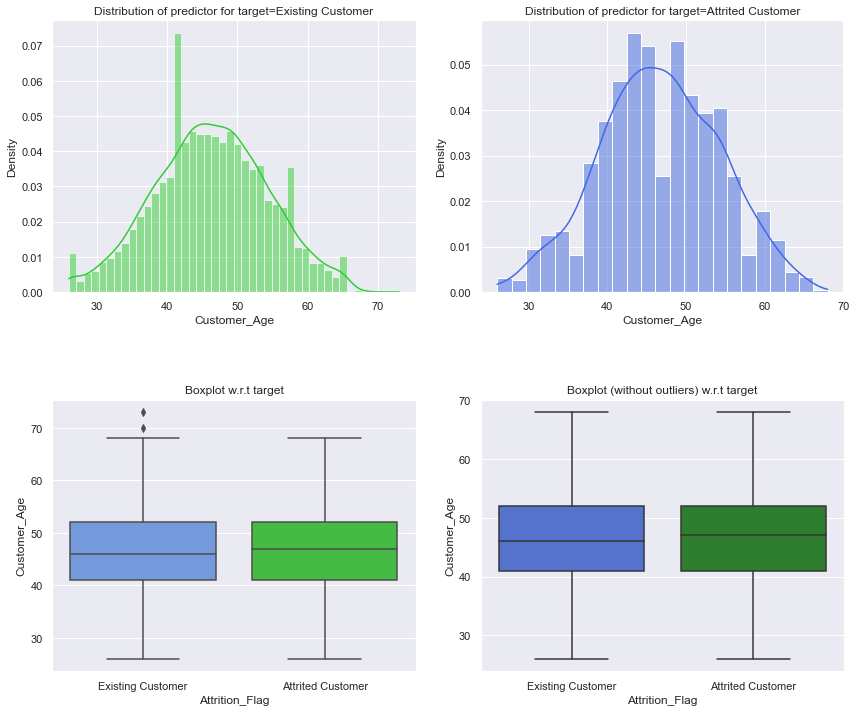

<IPython.core.display.Javascript object>

In [108]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Customer_Age", target="Attrition_Flag"
)

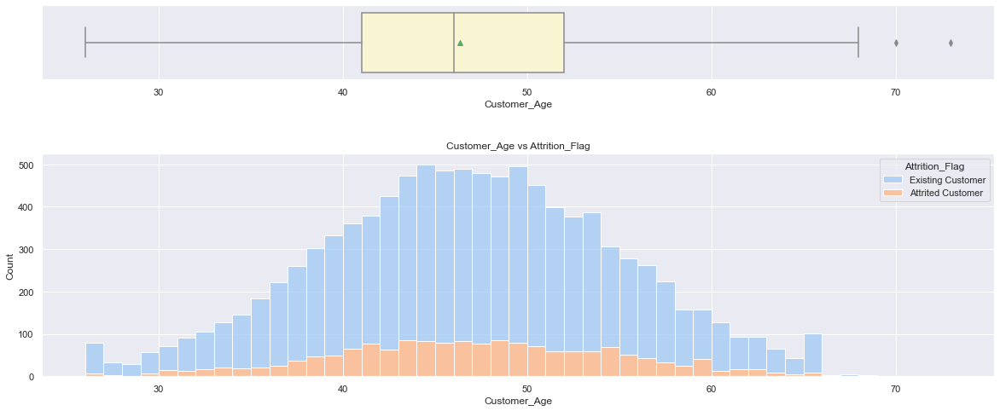

<IPython.core.display.Javascript object>

In [109]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data, "Customer_Age", "Attrition_Flag", "Customer_Age vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Customer_Age_Bin,,,
All,1627,8500,10127
46 to 50,393,1995,2388
41 to 45,386,1878,2264
51 to 55,295,1452,1747
36 to 40,220,1258,1478
56 to 60,153,773,926
31 to 35,90,564,654
61 to 65,56,339,395
26 to 30,32,233,265


----------------------------------------------------------------------------------------------------


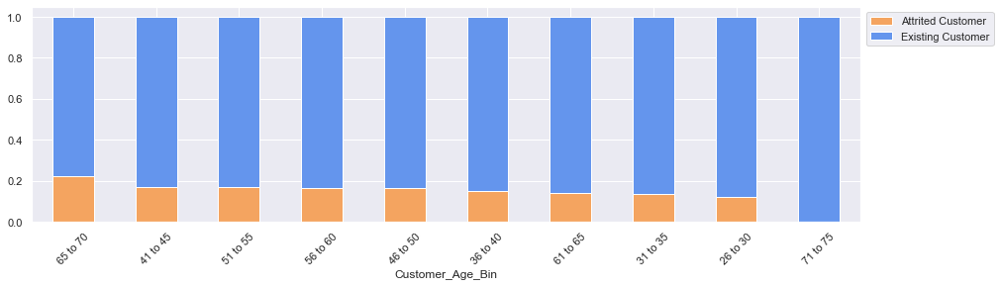

<IPython.core.display.Javascript object>

In [110]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Customer_Age_Bin", target="Attrition_Flag")

#### Observation  "Customer_Age vs Attrition Flag": 

1. Customer age has normal distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited are uniformly distributed for customer age.
3. Box plots shows customers who attrited and existing fall almost in same age range.
4. There is a slight correlation between Customer Age and Attrition Flag. 
5. Customers in age range between 65 and 70 tends to churn more. 

##### Gender vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Gender,,,
All,1627,8500,10127
F,930,4428,5358
M,697,4072,4769


----------------------------------------------------------------------------------------------------


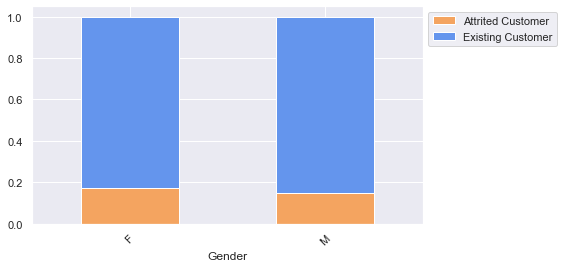

<IPython.core.display.Javascript object>

In [111]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Gender", target="Attrition_Flag")

#### Observation  "Gender vs Attrition_Flag": 

1. Female customers had attrited more than other customers.
2. There is no high correlation between Gender vs Attrition_Flag. 

##### Dependent_count vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Dependent_count,,,
All,1627,8500,10127
3,482,2250,2732
2,417,2238,2655
1,269,1569,1838
4,260,1314,1574
0,135,769,904
5,64,360,424


----------------------------------------------------------------------------------------------------


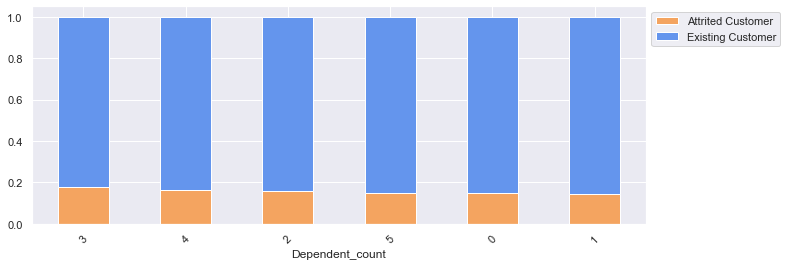

<IPython.core.display.Javascript object>

In [112]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Dependent_count", target="Attrition_Flag")

#### Observation  "Dependent_count vs Attrition_Flag": 

1. Customers with "3", "4" dependents had attrited more than other customers.
2. There is no high correlation between Dependent_count vs Attrition_Flag. 

##### Education_Level vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Education_Level,,,
All,1371,7237,8608
Graduate,487,2641,3128
High School,306,1707,2013
Uneducated,237,1250,1487
College,154,859,1013
Doctorate,95,356,451
Post-Graduate,92,424,516


----------------------------------------------------------------------------------------------------


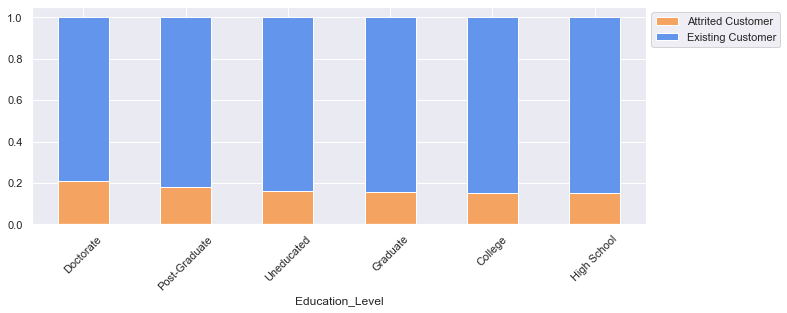

<IPython.core.display.Javascript object>

In [113]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Education_Level", target="Attrition_Flag")

#### Observation  "Education_Level vs Attrition_Flag": 

1. Customers who are "Doctorate", "Post-Graduate" etc had attrited more than other customers.
2. There is no high correlation between Education_Level vs Attrition_Flag. 

##### Marital_Status vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Marital_Status,,,
All,1498,7880,9378
Married,709,3978,4687
Single,668,3275,3943
Divorced,121,627,748


----------------------------------------------------------------------------------------------------


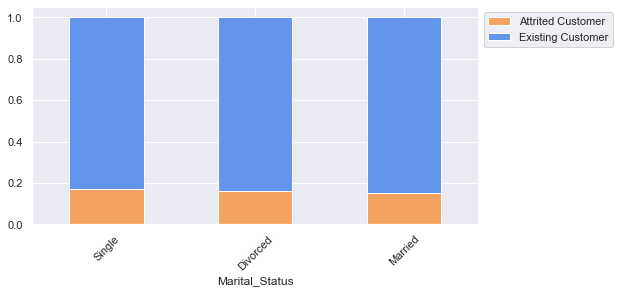

<IPython.core.display.Javascript object>

In [114]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Marital_Status", target="Attrition_Flag")

#### Observation  "Marital_Status vs Attrition_Flag": 

1. Customers who are "Single" had attrited more than other customers.
2. There is no high correlation between Marital_Status vs Attrition_Flag. 

##### Income_Category vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Income_Category,,,
All,1627,8500,10127
Less than $40K,612,2949,3561
$40K - $60K,271,1519,1790
$80K - $120K,242,1293,1535
$60K - $80K,189,1213,1402
abc,187,925,1112
$120K +,126,601,727


----------------------------------------------------------------------------------------------------


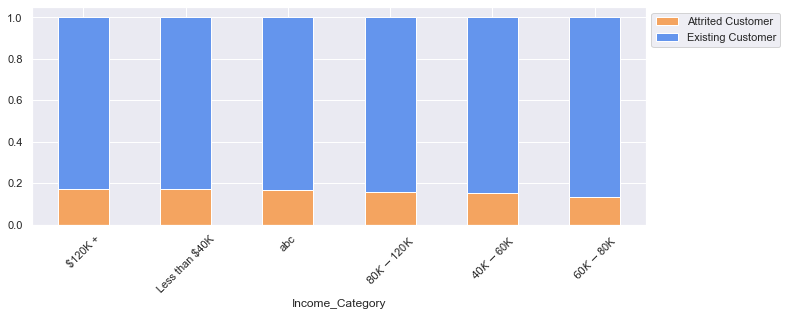

<IPython.core.display.Javascript object>

In [115]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Income_Category", target="Attrition_Flag")

#### Observation  "Income_Category vs Attrition_Flag": 

1. Customers under income group "$120K +" had attrited more than other customers.
2. There is no high correlation between Income_Category vs Attrition_Flag. 

##### Card_Category vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Card_Category,,,
All,1627,8500,10127
Blue,1519,7917,9436
Silver,82,473,555
Gold,21,95,116
Platinum,5,15,20


----------------------------------------------------------------------------------------------------


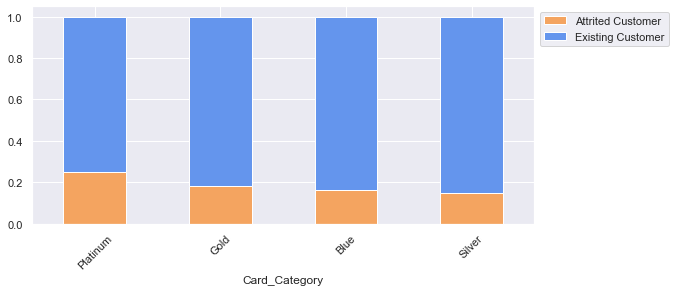

<IPython.core.display.Javascript object>

In [116]:
# Visualize data through plot
stacked_barplot(data=churn_data, predictor="Card_Category", target="Attrition_Flag")

#### Observation  "Card_Category vs Attrition_Flag": 

1. Customers using card "Platinum" had attrited more than other customers.
2. There is no high correlation between Card_Category vs Attrition_Flag. 

##### Months_on_book vs Attrition_Flag

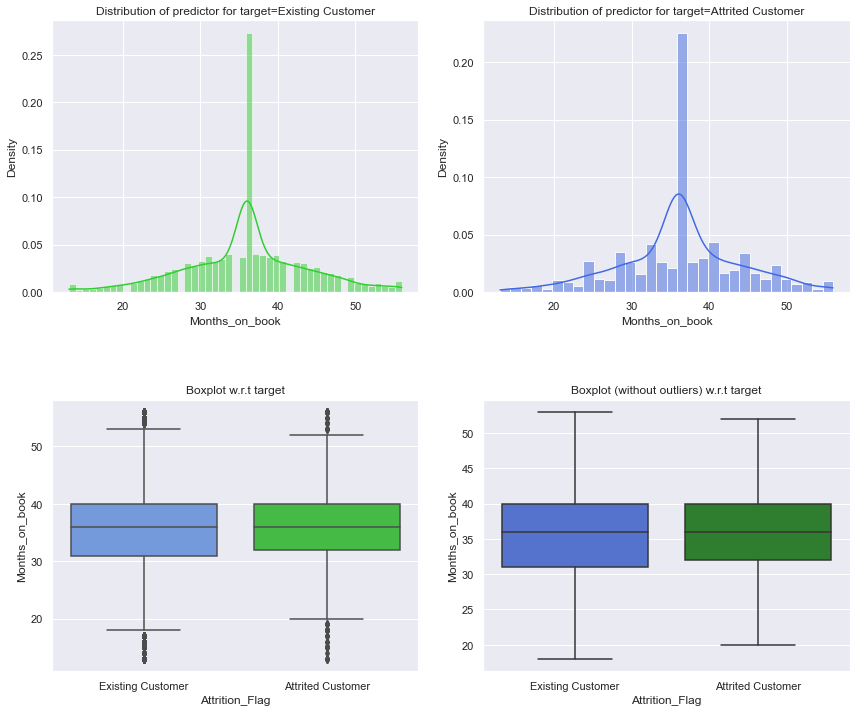

<IPython.core.display.Javascript object>

In [117]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Months_on_book", target="Attrition_Flag"
)

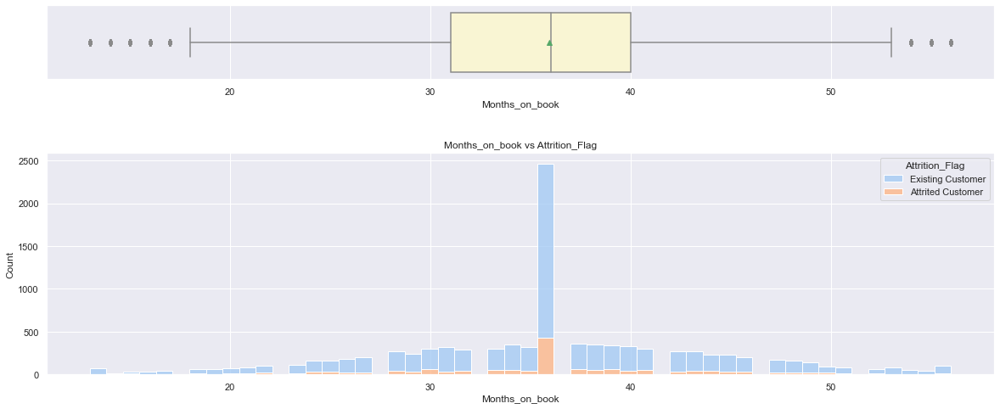

<IPython.core.display.Javascript object>

In [118]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data, "Months_on_book", "Attrition_Flag", "Months_on_book vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Months_on_book_Bin,,,
All,1627,8500,10127
36 to 40,658,3184,3842
31 to 35,228,1354,1582
41 to 45,204,1094,1298
26 to 30,182,1026,1208
46 to 50,136,631,767
21 to 25,101,528,629
51 to 55,45,270,315
16 to 20,39,224,263


----------------------------------------------------------------------------------------------------


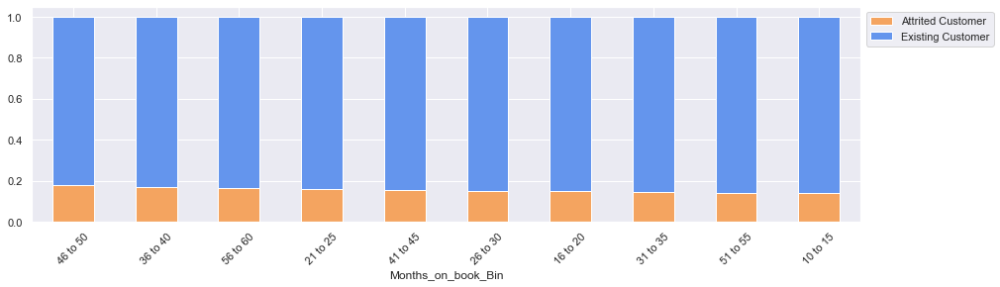

<IPython.core.display.Javascript object>

In [119]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Months_on_book_Bin", target="Attrition_Flag"
)

#### Observation  "Months on Book vs Attrition Flag": 

1. Months on Book has normal distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited are uniformly distributed for Months on Book.
3. Box plots shows customers who attrited and existing fall almost in same Months on Book range.
4. There is a slight correlation between Months on Book and Attrition Flag. 
5. Customers in Months on Book range between 46 and 50 tends to churn more. 

##### Total_Relationship_Count vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Relationship_Count,,,
All,1627,8500,10127
3,400,1905,2305
2,346,897,1243
1,233,677,910
5,227,1664,1891
4,225,1687,1912
6,196,1670,1866


----------------------------------------------------------------------------------------------------


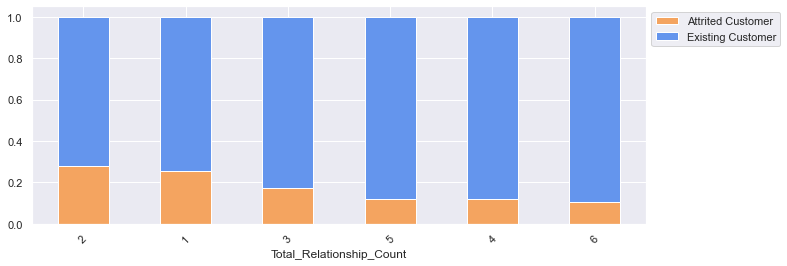

<IPython.core.display.Javascript object>

In [120]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Relationship_Count", target="Attrition_Flag"
)

#### Observation  "Total_Relationship_Count vs Attrition_Flag": 

1. Customers having products "2" had attrited more than other customers.
2. There is no high correlation between Total_Relationship_Count vs Attrition_Flag. 

##### Months_Inactive_12_mon vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Months_Inactive_12_mon,,,
All,1627,8500,10127
3,826,3020,3846
2,505,2777,3282
4,130,305,435
1,100,2133,2233
5,32,146,178
6,19,105,124
0,15,14,29


----------------------------------------------------------------------------------------------------


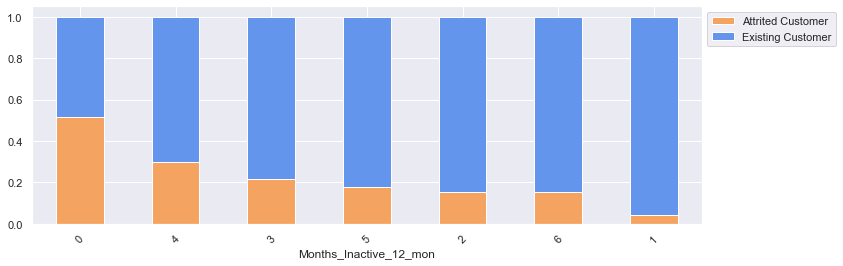

<IPython.core.display.Javascript object>

In [121]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Months_Inactive_12_mon", target="Attrition_Flag"
)

#### Observation  "Months_Inactive_12_mon vs Attrition_Flag": 

1. Customers who were inactive for "0" months had attrited more than other customers.
2. There is no high correlation between Months_Inactive_12_mon vs Attrition_Flag. 

##### Contacts_Count_12_mon vs Attrition_Flag

Attrition_Flag,Attrited Customer,Existing Customer,All
Contacts_Count_12_mon,,,
All,1627,8500,10127
3,681,2699,3380
2,403,2824,3227
4,315,1077,1392
1,108,1391,1499
5,59,117,176
6,54,0,54
0,7,392,399


----------------------------------------------------------------------------------------------------


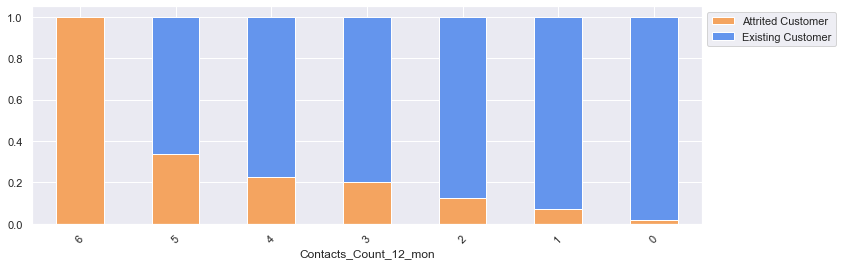

<IPython.core.display.Javascript object>

In [122]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Contacts_Count_12_mon", target="Attrition_Flag"
)

#### Observation  "Contacts_Count_12_mon vs Attrition_Flag": 

1. Customers who had "6" contacts with bank had attrited more than other customers.
2. There is no high correlation between Contacts_Count_12_mon vs Attrition_Flag. 

##### Total_Revolving_Bal vs Attrition_Flag

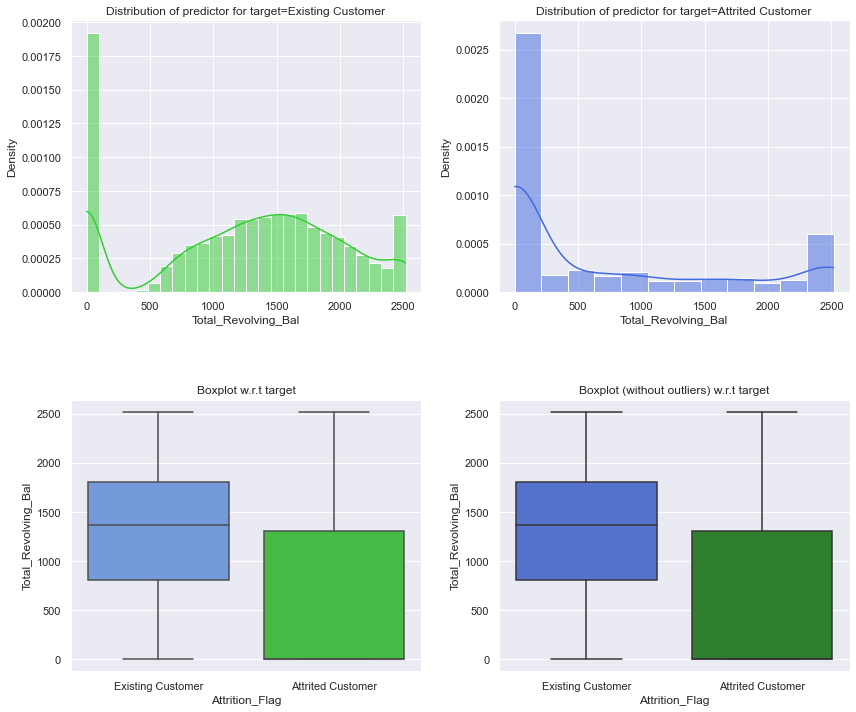

<IPython.core.display.Javascript object>

In [123]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Total_Revolving_Bal", target="Attrition_Flag"
)

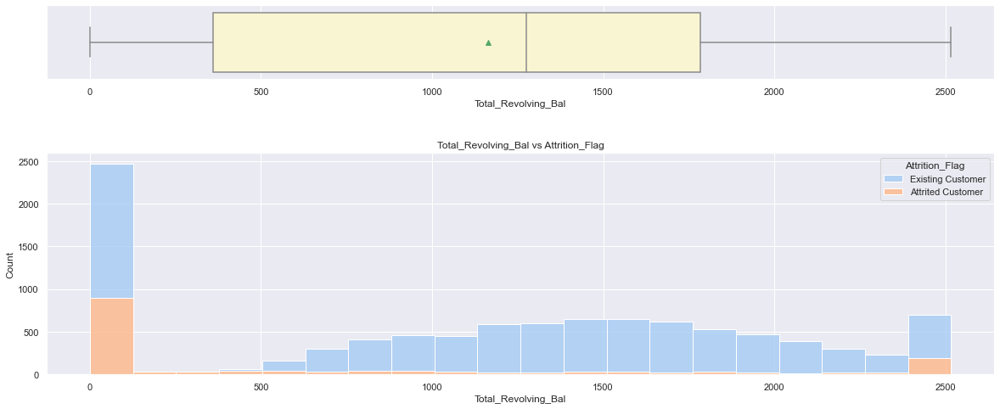

<IPython.core.display.Javascript object>

In [124]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Total_Revolving_Bal",
    "Attrition_Flag",
    "Total_Revolving_Bal vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Revolving_Bal_Bin,,,
All,1627,8500,10127
Below 1 (0),893,1577,2470
501 to 1000,163,1154,1317
2501 to 3000,162,367,529
1501 to 2000,109,2182,2291
1 to 500,106,20,126
1001 to 1500,102,2156,2258
2001 to 2500,92,1044,1136


----------------------------------------------------------------------------------------------------


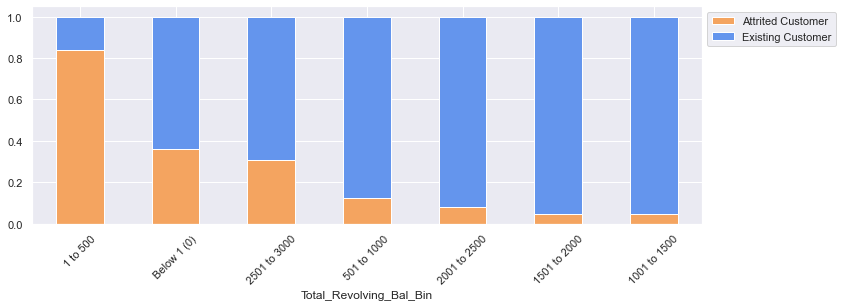

<IPython.core.display.Javascript object>

In [125]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Revolving_Bal_Bin", target="Attrition_Flag"
)

#### Observation  "Total Revolving Balance vs Attrition Flag": 

1. Total Revolving Balance has different distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Total Revolving Balance.
3. Box plots shows customers who attrited had less Total Revolving Balance and existing customers normally has higher Total Revolving Balance which means they are using credit card frequently.
4. There is a correlation between Total Revolving Balance and Attrition Flag. 
5. Customers in Total Revolving Balance range between 1 and 500 tends to churn more. Probably customers are not using credit card and had decided to churn to avoid annual fees.

##### Avg_Open_To_Buy vs Attrition_Flag

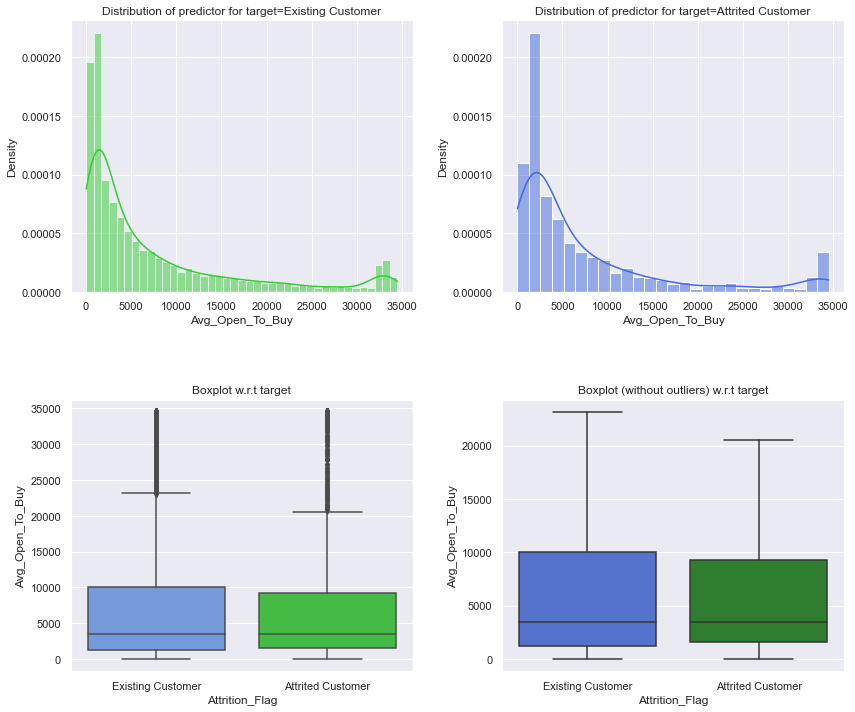

<IPython.core.display.Javascript object>

In [126]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Avg_Open_To_Buy", target="Attrition_Flag"
)

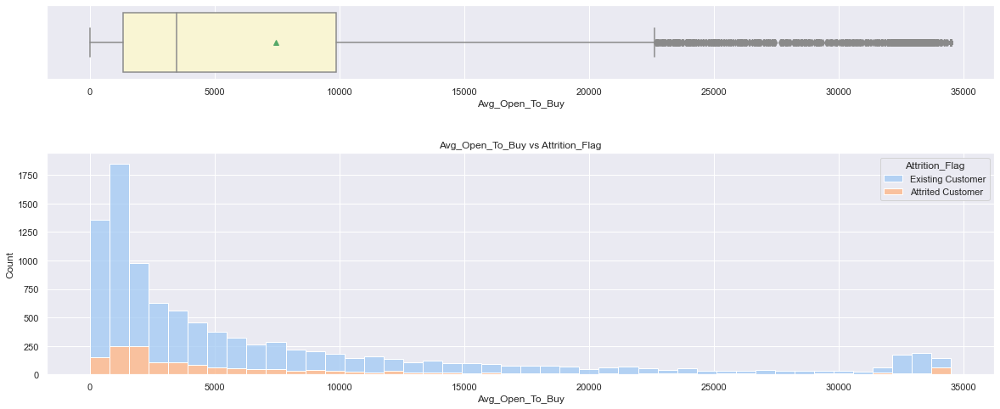

<IPython.core.display.Javascript object>

In [127]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Avg_Open_To_Buy",
    "Attrition_Flag",
    "Avg_Open_To_Buy vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Avg_Open_To_Buy_Bin,,,
All,1627,8500,10127
0 to 5000,976,5013,5989
5001 to 10000,273,1369,1642
10001 to 15000,134,686,820
30001 to 35000,107,516,623
15001 to 20000,64,445,509
20001 to 25000,41,291,332
25001 to 30000,32,180,212


----------------------------------------------------------------------------------------------------


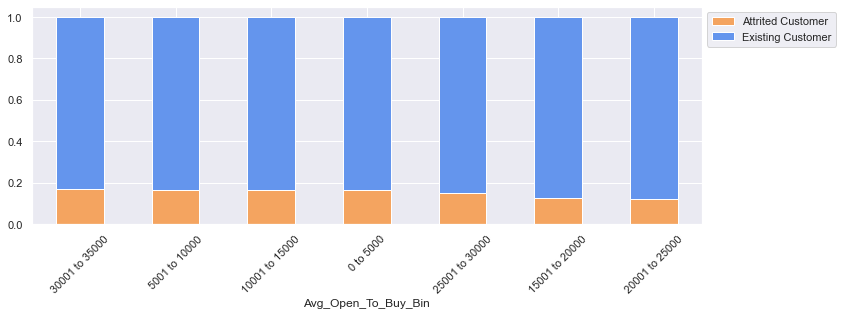

<IPython.core.display.Javascript object>

In [128]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Avg_Open_To_Buy_Bin", target="Attrition_Flag"
)

#### Observation  "Average Open to Buy vs Attrition Flag": 

1. Average Open to Buy has similar distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Average Open to Buy.
3. Box plots shows customers who attrited and existing customers has similar Average Open to Buy.
4. There is not much correlation between Average Open to Buy and Attrition Flag. 
5. Customers in Average Open to Buy range between 30001 and 35000 tends to churn more. 

##### Total_Amt_Chng_Q4_Q1 vs Attrition_Flag

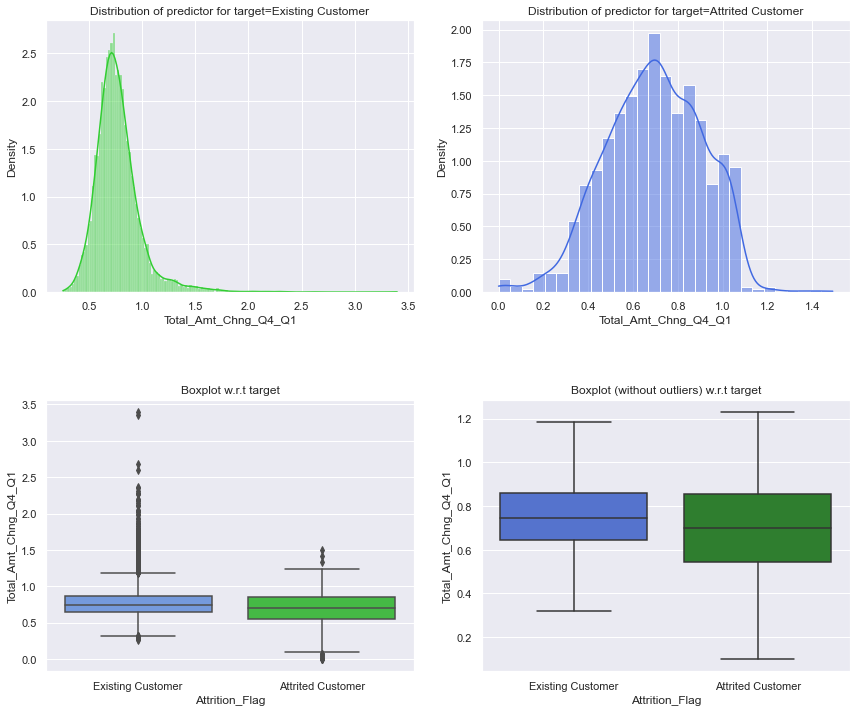

<IPython.core.display.Javascript object>

In [129]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Total_Amt_Chng_Q4_Q1", target="Attrition_Flag"
)

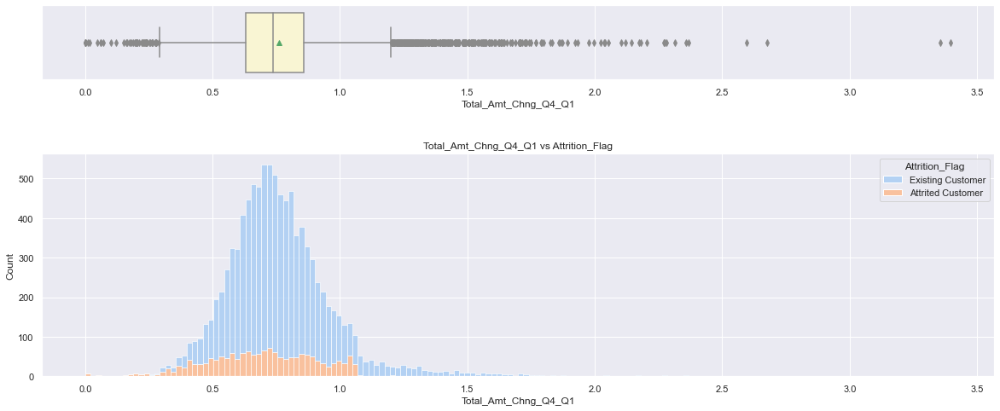

<IPython.core.display.Javascript object>

In [130]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Total_Amt_Chng_Q4_Q1",
    "Attrition_Flag",
    "Total_Amt_Chng_Q4_Q1 vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Amt_Chng_Q4_Q1_Bin,,,
All,1627,8500,10127
0.6 to 1.0,1177,7215,8392
0.1 to 0.5,303,434,737
1.1 to 1.5,142,742,884
Zero,5,0,5
1.6 to 2.0,0,89,89
2.1 to 2.5,0,16,16
2.6 to 3.0,0,2,2
3.1 to 3.5,0,2,2


----------------------------------------------------------------------------------------------------


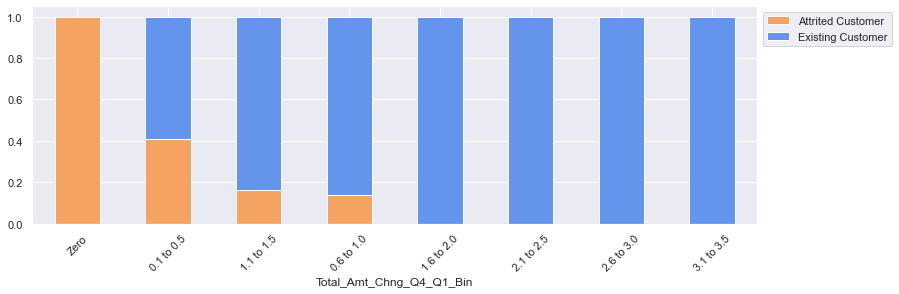

<IPython.core.display.Javascript object>

In [131]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Amt_Chng_Q4_Q1_Bin", target="Attrition_Flag"
)

#### Observation  "Total amount change between Q4 and Q1 vs Attrition Flag": 

1. Total amount change between Q4 and Q1 has different distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Total amount change between Q4 and Q1.
3. Box plots shows customers who attrited and existing customers has similar Total amount change between Q4 and Q1.
4. There is a correlation between Total amount change between Q4 and Q1 and Attrition Flag. 
5. Customers in Total amount change between Q4 and Q1 as zero tends to churn more. 

##### Total_Trans_Amt vs Attrition_Flag

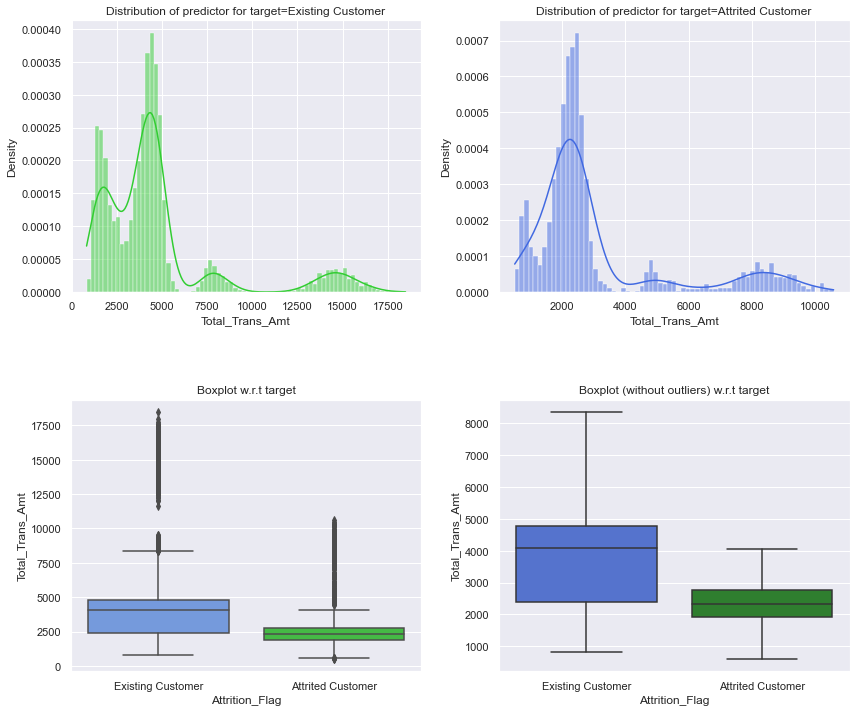

<IPython.core.display.Javascript object>

In [132]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Total_Trans_Amt", target="Attrition_Flag"
)

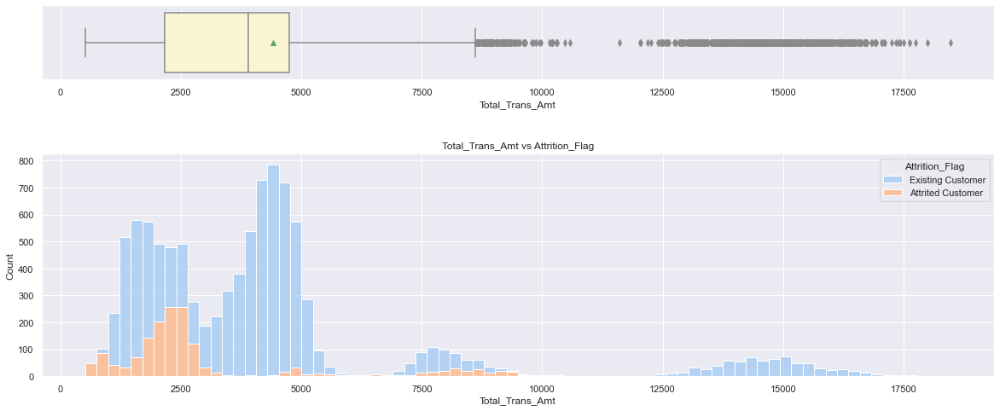

<IPython.core.display.Javascript object>

In [133]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Total_Trans_Amt",
    "Attrition_Flag",
    "Total_Trans_Amt vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Trans_Amt_Bin,,,
All,1627,8500,10127
0 to 2500,998,2238,3236
2501 to 5000,373,4631,5004
7501 to 10000,183,374,557
5001 to 7500,63,510,573
10001 to 12500,10,10,20
12501 to 15000,0,452,452
15001 to 17500,0,280,280
17501 to 20000,0,5,5


----------------------------------------------------------------------------------------------------


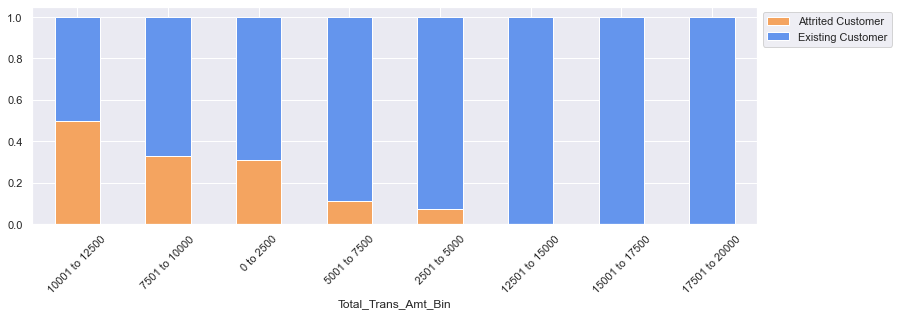

<IPython.core.display.Javascript object>

In [134]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Trans_Amt_Bin", target="Attrition_Flag"
)

#### Observation  "Total Transaction Amount vs Attrition Flag": 

1. Total Transaction Amount has similar distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Total Transaction Amount.
3. Box plots shows customers who attrited had less Total Transaction Amount and existing customers had higher Total Transaction Amount.
4. There is a correlation between Total Transaction Amount and Attrition Flag. 
5. Customers in Total Transaction Amount range as "10001 to 12500" tends to churn more. 

##### Total_Trans_Ct vs Attrition_Flag

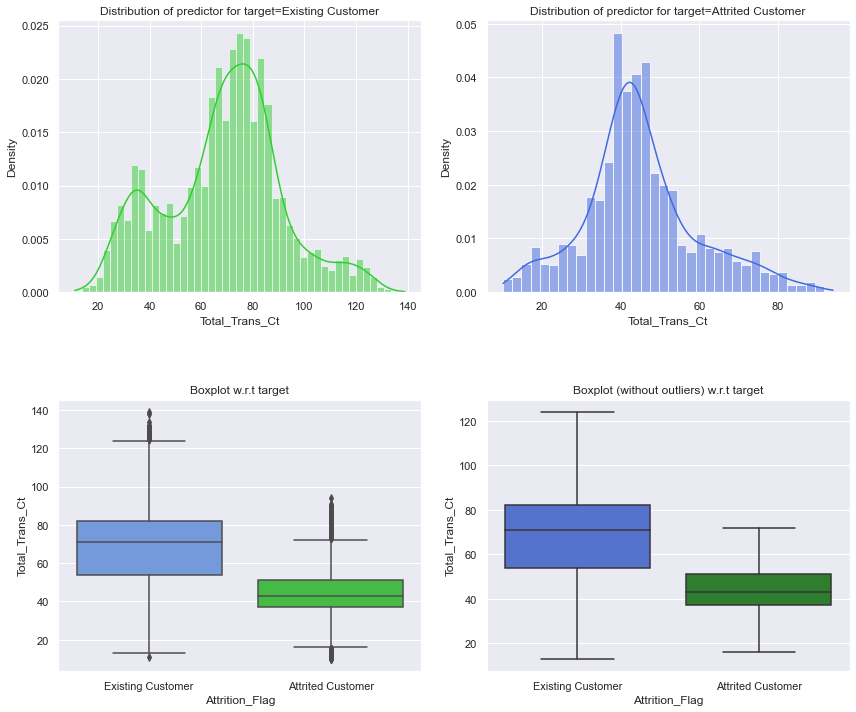

<IPython.core.display.Javascript object>

In [135]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Total_Trans_Ct", target="Attrition_Flag"
)

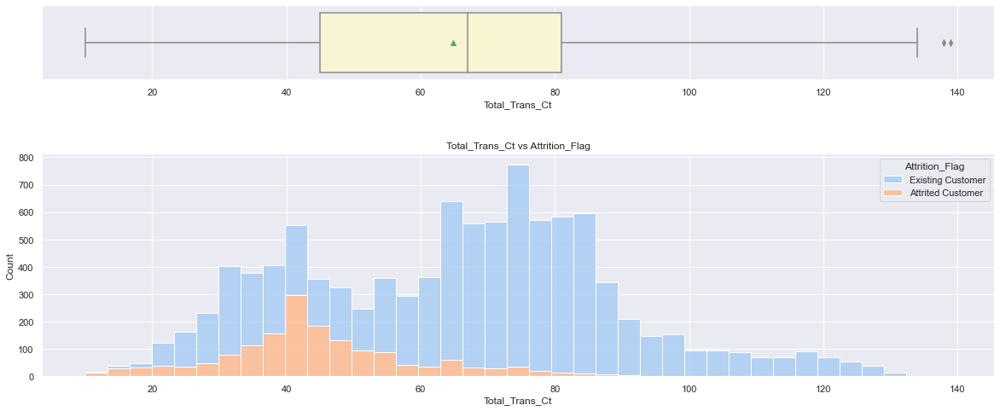

<IPython.core.display.Javascript object>

In [136]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data, "Total_Trans_Ct", "Attrition_Flag", "Total_Trans_Ct vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Trans_Ct_Bin,,,
All,1627,8500,10127
41 to 50,576,614,1190
31 to 40,407,833,1240
51 to 60,204,715,919
61 to 70,125,1516,1641
21 to 30,123,456,579
71 to 80,80,1809,1889
10 to 20,77,38,115
81 to 90,29,1405,1434


----------------------------------------------------------------------------------------------------


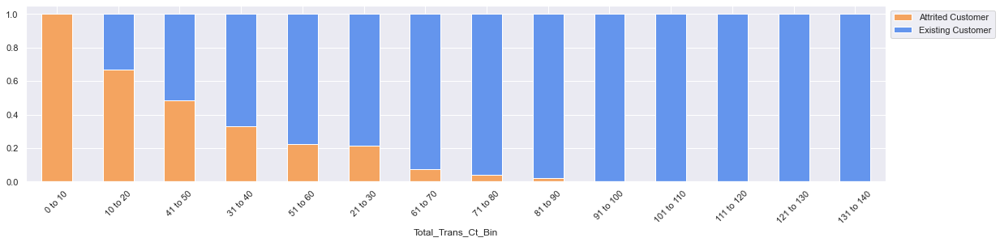

<IPython.core.display.Javascript object>

In [137]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Trans_Ct_Bin", target="Attrition_Flag"
)

#### Observation  "Total Transaction Count vs Attrition Flag": 

1. Total Transaction Count has similar distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Total Transaction Count.
3. Box plots shows customers who attrited had less Total Transaction Count and existing customers had higher Total Transaction Count.
4. There is a correlation between Total Transaction Count and Attrition Flag. 
5. Customers in Total Transaction Count range as "0 to 10" tends to churn more. 

##### Total_Ct_Chng_Q4_Q1 vs Attrition_Flag

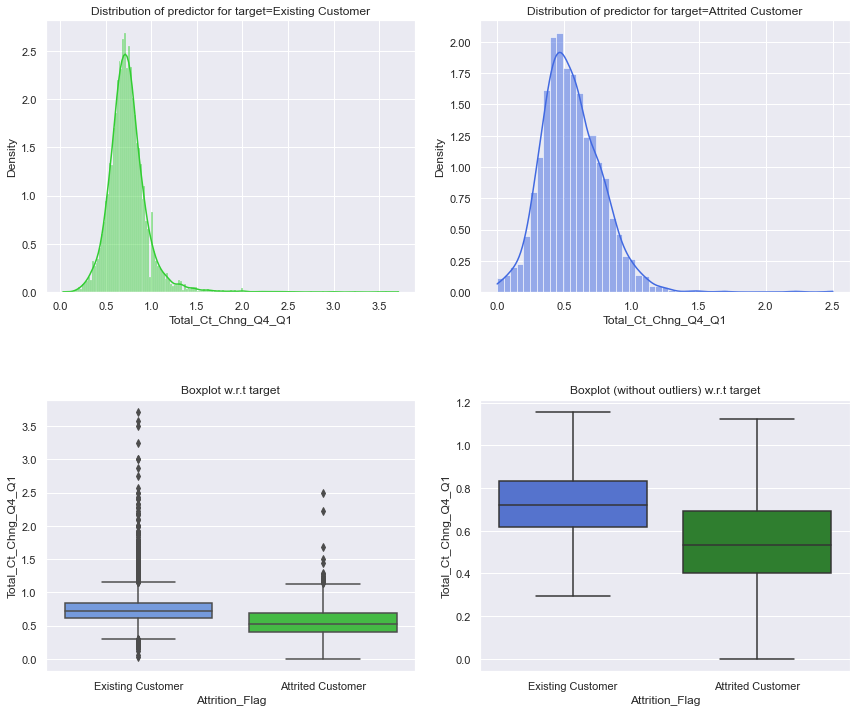

<IPython.core.display.Javascript object>

In [138]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Total_Ct_Chng_Q4_Q1", target="Attrition_Flag"
)

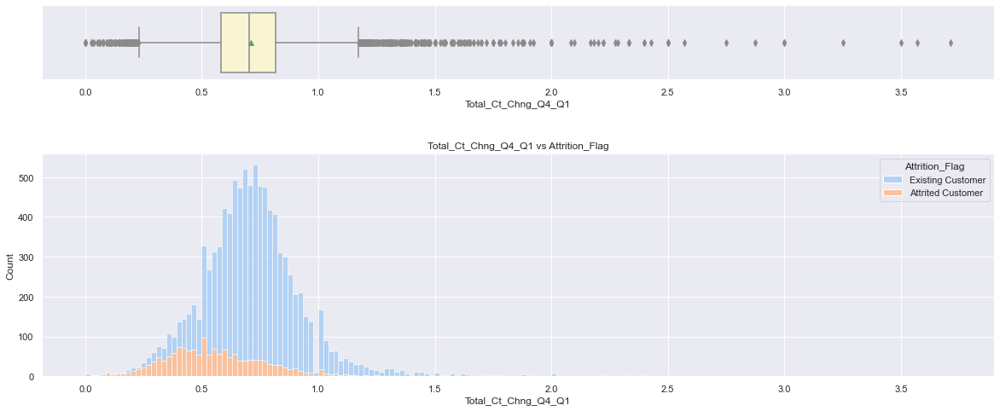

<IPython.core.display.Javascript object>

In [139]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Total_Ct_Chng_Q4_Q1",
    "Attrition_Flag",
    "Total_Ct_Chng_Q4_Q1 vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Total_Ct_Chng_Q4_Q1_Bin,,,
All,1627,8500,10127
0.6 to 1.0,830,7098,7928
0.1 to 0.5,748,776,1524
1.1 to 1.5,39,548,587
Zero,7,0,7
2.1 to 2.5,2,15,17
1.6 to 2.0,1,54,55
2.6 to 3.0,0,5,5
3.1 to 3.5,0,2,2


----------------------------------------------------------------------------------------------------


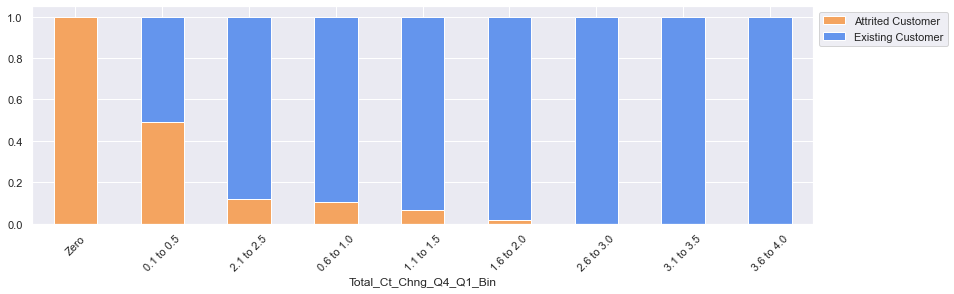

<IPython.core.display.Javascript object>

In [140]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Total_Ct_Chng_Q4_Q1_Bin", target="Attrition_Flag"
)

#### Observation  "Total Count Change Q4-Q1 vs Attrition Flag": 

1. Total Count Change Q4-Q1 has similar distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Total Count Change Q4-Q1.
3. Box plots shows customers who attrited had less Total Count Change Q4-Q1 and existing customers had higher Total Count Change Q4-Q1.
4. There is a correlation between Total Count Change Q4-Q1 and Attrition Flag. 
5. Customers in Total Count Change Q4-Q1 range as "0" tends to churn more. 

##### Avg_Utilization_Ratio vs Attrition_Flag

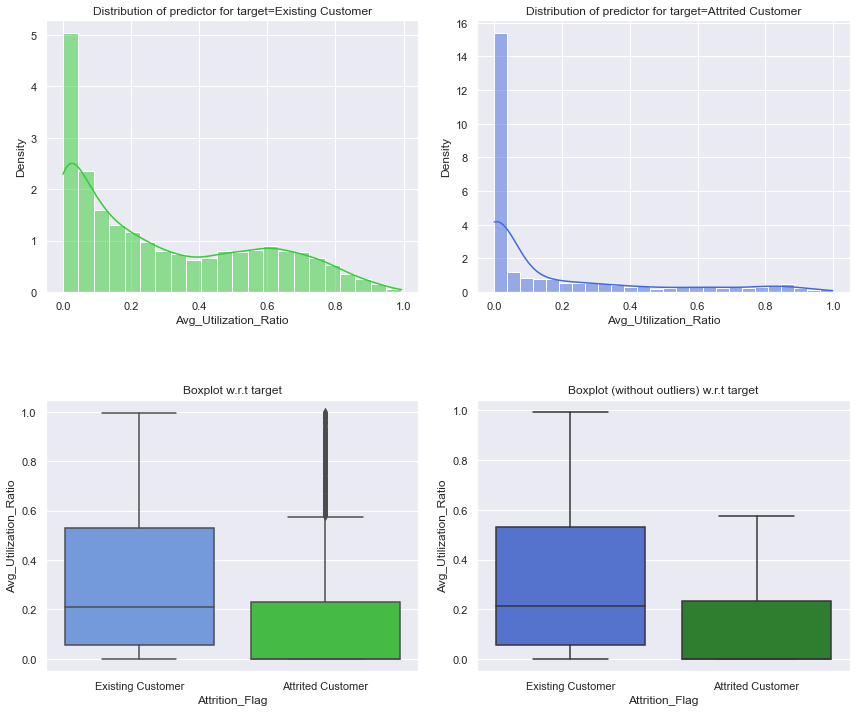

<IPython.core.display.Javascript object>

In [141]:
# Visualize data through plot
distribution_plot_wrt_target(
    data=churn_data, predictor="Avg_Utilization_Ratio", target="Attrition_Flag"
)

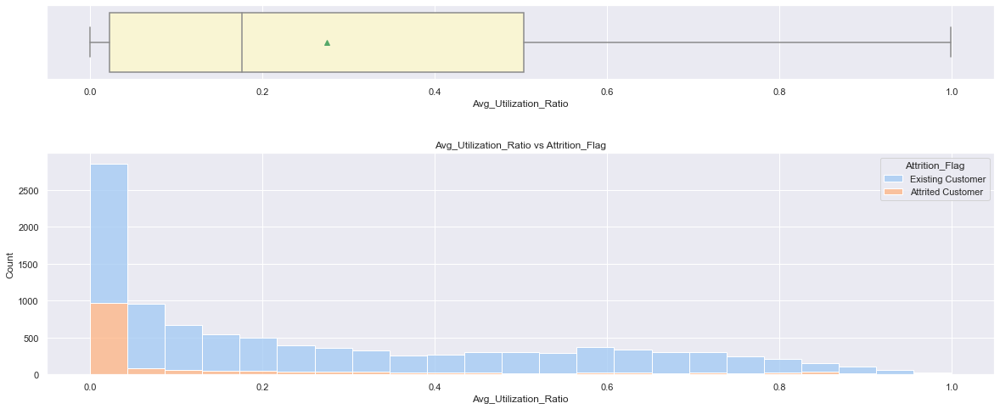

<IPython.core.display.Javascript object>

In [142]:
# Visualize data through histogram and box plots for outliers and its impact
hist_boxplot_with_hue(
    churn_data,
    "Avg_Utilization_Ratio",
    "Attrition_Flag",
    "Avg_Utilization_Ratio vs Attrition_Flag",
)

Attrition_Flag,Attrited Customer,Existing Customer,All
Avg_Utilization_Ratio_Bin,,,
All,1627,8500,10127
Zero,893,1577,2470
0.01 to 0.1,176,1407,1583
0.11 to 0.2,121,1172,1293
0.21 to 0.3,88,819,907
0.81 to 0.9,71,285,356
0.31 to 0.4,70,588,658
0.41 to 0.5,51,620,671
0.51 to 0.6,47,696,743


----------------------------------------------------------------------------------------------------


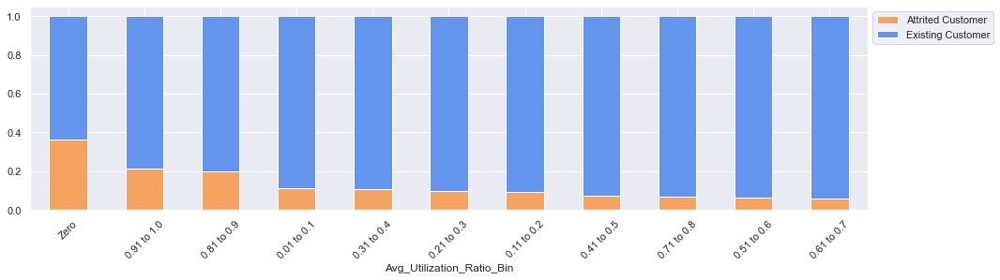

<IPython.core.display.Javascript object>

In [143]:
# Visualize data through plot
stacked_barplot(
    data=churn_data, predictor="Avg_Utilization_Ratio_Bin", target="Attrition_Flag"
)

#### Observation  "Average Utilization Ratio vs Attrition Flag": 

1. Average Utilization Ratio has similar distribution for both Attrition Flag = 'False' and Attrition Flag = 'True' conditions.
2. Histogram shows number of customers who attrited had less Average Utilization Ratio.
3. Box plots shows customers who attrited had less Average Utilization Ratio and existing customers had higher Average Utilization Ratio.
4. There is a correlation between Average Utilization Ratio and Attrition Flag. 
5. Customers in Average Utilization Ratio range as "Zero" tends to churn more. 

### 5. Insights Based On EDA

### Data Description:

1. Row index is from 0 to 10126. Total rows is 10127
2. Column index is from 0 to 19. Total columns is 20
3. There are null values in columns "Education_Level" and "Marital_Status". **Missing value treatment is required for these columns**
4. Column "CLIENTNUM" is unique and can be dropped.
5. **Attrition_Flag is categorical. It is also the target variable.** Value "Attrited Customer" will be True or "1" and value "Existing Customer" will be False or "0".It does not have null values
6. Column "Customer_Age" is in years and is a continous variable
7. Columns "Gender", "Education_Level", "Marital_Status", "Income_Category" and "Card_Category" are strings and categorical variable. They can be typecast as Categorical. OneHotEncoding can be applied on these columns.
8. Columns "Dependent_count", "Months_on_book",	"Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1","Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1"  and "Avg_Utilization_Ratio" are sequential numbers

### Data Cleaning:

* There are missing values in columns "Education_Level" and "Marital_Status". They are categorical and must be imputed with "mode" values
* There is missing value in column "Income_Category" as well. Its categorical varibale and missing value is "abc". It must be imputed as well.



### Insights on each columns are listed below:


**1. CLIENTNUM (Client number. Unique identifier for the customer holding the account) :** This feature is unique. So this must be dropped.

**2. Attrition_Flag (Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer") :** This is the target variable. It is a categorical column. It has only two values "Existing Customer" and "Attrited Customer". Value "Attrited Customer" will be True or "1" and value "Existing Customer" will be False or "0". **Objective of this project is to predict "Attrited Customer".
Most of customers did not churn (83.9%). Whereas, 16.1 % of customers had churned.
Target data is imbalanced.** 

**3. Customer_Age (Age in Years) :** It looks like a normal distribution. It is not at all skewed
It has few outliers. But, they seems to be very close to upper whisker. So it can be legitimate values. Mean and Median are same. Mean is 46 and median is also 46. There are no missing values. Most of the customers fall under age range 46 to 50. Second most of the customers fall under age range 41-45. Third most of the customers fall under age range 51-55.

**4. Gender (Gender of the account holder) :** This is a categorical variable. There are only two values "F" which means "Female" and "M" which means "Male". Most of the customers were "Female" (52.9%) compared to "Male" (47.1%). There are no missing values.

**5. Dependent_count (Number of dependents) :** This is a categorical variable even though values are numerical. There are only six values and they are in sequencial order. Most of the customers had "3" dependents (52.9%), followed by "2" (26.2%) and "1" (18.1%). There are no missing values.

**6. Education_Level (Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate) :** This is a categorical variable. There are only six values. Most of the customers were "Graduate" (30.9%), followed by "High School" (19.9%) and "Uneducated" (14.7%). There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Graduate".

**7. Marital_Status (Marital Status of the account holder) :** This is a categorical variable. There are only three values. Most of the customers were "Married" (46.3%), followed by "Single" (38.9%) and "Divorced" (7.4%). There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Married".

**8. Income_Category (Annual Income Category of the account holder) :** This is a categorical variable. However, since this is income, its in a sequential order and can be converted into numerical values. There are only six values. Most of the customers were having income "Less than $40K" (35.2%), followed by "40K - 60K" (17.7%) and "80K - 120K" (15.2%). There are no missing values. **But, value "abc" seems to be invalid and it can be converted as a null value and treated with imputation of median since this is a numeric sequential value.**

**9. Card_Category (Type of Card) :** This is a categorical variable. There are only four values. Most of the customers were having "Blue" card (93.2%), followed by "Silver" (5.5%) and "Gold" (1.1%). There are no missing values.

**10. Months_on_book (Period of relationship with the bank) :** It looks like a normal distribution. It is not at all skewed. It has few outliers. But, they seems to be very close to upper and lower whisker. So it can be legitimate values. Mean and Median are same. Mean is 36 (3 years) and median is also 36 (3 years). There are no missing values. Most of the customers fall under number of months range 36 to 40. Looks like most of customers were card holders for 3 years. Second most of the customers fall under number of months range 31-35. Third most of the customers fall under number of months range 41-45.

**11. Total_Relationship_Count (Total no. of products held by the customer) :** This is a categorical variable even though values are numerical. There are only six values and they are in sequencial order. Most of the customers had "3" products held (22.8%), followed by "4" (18.9%) and "5" (18.7%). There are no missing values.

**12. Months_Inactive_12_mon (No. of months inactive in the last 12 months) :** This is a categorical variable even though values are numerical. There are only seven values and they are in sequencial order. Most of the customers were inactive for "3" months in last 12 months(38.8%), followed by "2" (32.4%) and "1" (22.0%). There are no missing values.

**13. Contacts_Count_12_mon (No. of Contacts between the customer and bank in the last 12 months) :** This is a categorical variable even though values are numerical. There are only seven values and they are in sequencial order
Most of the customers had "3" contacts in last 12 months (33.4%), followed by "2" (31.9%) and "1" (14.8%). There are no missing values.

**14. Credit_Limit (Credit Limit on the Credit Card) :** It doesn't look like a normal distribution. It is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are not same. Mean is 8632 and median is 4549. There are no missing values. Most of the customers fall under credit range 0 to 5000. Second most of the customers fall under credit range 5001-10000. Third most of the customers fall under credit range 10001-15000.

**15. Total_Revolving_Bal (The balance that carries over from one month to the next is the revolving balance) :** It doesnt look like a normal distribution. There are a lot of zero values. It is not skewed. It has no outliers. Mean and Median are not same. Mean is 1163 and median is 1276. There are no missing values. Most of the customers fall under revolving balance range 0. Second most of the customers fall under revolving balance range "1501 to 2000". Third most of the customers fall under revolving balance range "1001 to 1500".

**16. Avg_Open_To_Buy (Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)) :** It doesn't look like a normal distribution. It is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are not same. Mean is 7469 and median is 3474. There are no missing values. Most of the customers fall under revolving balance range 0. Second most of the customers fall under revolving balance range "1501 to 2000". Third most of the customers fall under revolving balance range "1001 to 1500".

**17. Total_Trans_Amt (Total Transaction Amount (Last 12 months)):** This distribution has multiple peaks and valleys. Looks like there are different ranges. But, it's is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 4404 and median is 3899. There are no missing values. Most of the customers fall under total transaction range "2501 to 5000". Second most of the customers fall under total transaction range "0 to 2500". Third most of the customers fall under total transaction range "5001 to 7500".

**18. Total_Trans_Ct (Total Transaction Count (Last 12 months)):** This distribution has peaks and valleys. It is sligtly right skewed. It has few outliers, but, they are closer to upper whisker. Mean and Median are almost same. Mean is 65 and median is 67. There are no missing values. Most of the customers fall under total transaction count range "71 to 80". Second most of the customers fall total transaction count range "61 to 70". Third most of the customers fall total transaction count range "81 to 90".

**19. Total_Ct_Chng_Q4_Q1 (Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter):** It has a normal distribution. It is heavily right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a square root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 0.71 and median is 0.70. There are no missing values. Most of the customers fall under ratio of total transaction count range "0.6 to 1.0". Second most of the customers fall ratio of total transaction count range "0.1 to 0.5". Third most of the customers fall ratio of total transaction count range "1.1 to 1.5".

**20. Total_Amt_Chng_Q4_Q1 (Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter):** It looks like a normal distribution. But, it's is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 0.760 and median is 0.736. There are no missing values. Most of the customers fall under ratio range "0.6 to 1.0". This means customers had kept almost same total transaction amount in Q4 and Q1. Second most of the customers fall under ratio range "1.1 to 1.5". Third most of the customers fall under ratio range "0.1 to 0.5".

**21. Avg_Utilization_Ratio (Represents how much of the available credit the customer spent):** It looks like a normal distribution. It is not skewed. It has no outliers. Mean and Median are not same. Mean is 0.27 and median is 0.18. There are no missing values. Most of the customers fall under ratio of average utilization range is "0". Looks like most of customers doesnt spend much. Second most of the customers fall ratio of average utilization range "0.01 to 0.1". Third most of the customers fall ratio of average utilization range "0.11 to 0.2"




### Other Insights :

**1. Customer_Age vs Attrition_Flag :** Customers who attrited are uniformly distributed for customer age.
Also, customers who attrited and existing fall almost in same age range. There is a very slight correlation between Customer Age and Attrition Flag. Customers in age range between 65 and 70 tends to churn more.

**2. Gender vs Attrition_Flag :** Female customers had attrited more than other customers. There is no high correlation between Gender vs Attrition_Flag.

**3. Dependent_count vs Attrition_Flag :** Customers with "3", "4" dependents had attrited more than other customers. There is no high correlation between Dependent_count vs Attrition_Flag.

**4. Education_Level vs Attrition_Flag :** Customers who are "Doctorate", "Post-Graduate" etc had attrited more than other customers. There is no high correlation between Education_Level vs Attrition_Flag.

**5. Marital_Status vs Attrition_Flag :** Customers who are "Single" had attrited more than other customers. There is no high correlation between Marital_Status vs Attrition_Flag.

**6. Income_Category vs Attrition_Flag :** Customers under income group "$120K +" had attrited more than other customers. There is no high correlation between Income_Category vs Attrition_Flag.

**7. Card_Category vs Attrition_Flag :** Customers using card "Platinum" had attrited more than other customers. There is no high correlation between Card_Category vs Attrition_Flag.

**8. Months on Book vs Attrition Flag :** Number of customers who attrited are uniformly distributed for Months on Book. Box plots shows customers who attrited and existing fall almost in same Months on Book range. There is a slight correlation between Months on Book and Attrition Flag. Customers in Months on Book range between 46 and 50 tends to churn more.

**9. Total_Relationship_Count vs Attrition_Flag :** Customers having products "2" had attrited more than other customers. There is no high correlation between Total_Relationship_Count vs Attrition_Flag.

**10. Months_Inactive_12_mon vs Attrition_Flag :** Customers who were inactive for "0" months had attrited more than other customers. There is no high correlation between Months_Inactive_12_mon vs Attrition_Flag.

**11. Contacts_Count_12_mon vs Attrition_Flag :** Customers who had "6" contacts with bank had attrited more than other customers. There is no high correlation between Contacts_Count_12_mon vs Attrition_Flag.

**12. Total Revolving Balance vs Attrition Flag :** Number of customers who attrited had less Total Revolving Balance. Box plots shows customers who attrited had less Total Revolving Balance and existing customers normally has higher Total Revolving Balance which means they are using credit card frequently. There is a correlation between Total Revolving Balance and Attrition Flag. Customers in Total Revolving Balance range between 1 and 500 tends to churn more. Probably customers are not using credit card and had decided to churn to avoid annual fees.

**13. Average Open to Buy vs Attrition Flag :** Number of customers who attrited had less Average Open to Buy. Box plots shows customers who attrited and existing customers has similar Average Open to Buy. There is not much correlation between Average Open to Buy and Attrition Flag. Customers in Average Open to Buy range between 30001 and 35000 tends to churn more.

**14. Total amount change between Q4 and Q1 vs Attrition Flag :** Number of customers who attrited had less Total amount change between Q4 and Q1. Box plots shows customers who attrited and existing customers has similar Total amount change between Q4 and Q1. There is a correlation between Total amount change between Q4 and Q1 and Attrition Flag. Customers in Total amount change between Q4 and Q1 as zero tends to churn more.

**15. Total Transaction Amount vs Attrition Flag :** Number of customers who attrited had less Total Transaction Amount. Box plots shows customers who attrited had less Total Transaction Amount and existing customers had higher Total Transaction Amount. There is a correlation between Total Transaction Amount and Attrition Flag.
Customers in Total Transaction Amount range as "10001 to 12500" tends to churn more.

**16. Total Transaction Count vs Attrition Flag :** Number of customers who attrited had less Total Transaction Count. Box plots shows customers who attrited had less Total Transaction Count and existing customers had higher Total Transaction Count. There is a correlation between Total Transaction Count and Attrition Flag.
Customers in Total Transaction Count range as "0 to 10" tends to churn more.

**17. Total Count Change Q4-Q1 vs Attrition Flag :** Number of customers who attrited had less Total Count Change Q4-Q1. Box plots shows customers who attrited had less Total Count Change Q4-Q1 and existing customers had higher Total Count Change Q4-Q1. There is a correlation between Total Count Change Q4-Q1 and Attrition Flag.
Customers in Total Count Change Q4-Q1 range as "0" tends to churn more.

**18. Average Utilization Ratio vs Attrition Flag :** Number of customers who attrited had less Average Utilization Ratio. Box plots shows customers who attrited had less Average Utilization Ratio and existing customers had higher Average Utilization Ratio. There is a correlation between Average Utilization Ratio and Attrition Flag.
Customers in Average Utilization Ratio range as "Zero" tends to churn more.



### Actions for Data Preprocessing:

1. Column "CLIENTNUM" is unique and can be dropped.
2. Column "Attrition_Flag" can be converted to "1" and "0" as its target variable.
3. Check for duplicates and drop
4. Convert "Income_Category" inot numeric sequencial value because its categorical values are in sequencial order. Also, value "abc" in feature "Income_Category" must be considered as null value and must be treated.
5. There are null values and **Missing Value Treatment** is required for columns "Education_Level", "Marital_Status" and "Income_Category".
6. **Outlier Treatment is done by log and squared root transformation.** Analyse outlier values further.
7. Columns "Gender", "Education_Level", "Marital_Status" and "Card_Category" can be converted to category. One Hot Encoding must be applied to these categorical columns.
8. Drop all columns "Customer_Age_Bin", "Months_on_book_Bin", "Credit_Limit_Bin","Total_Revolving_Bal_Bin","Avg_Open_To_Buy_Bin","Total_Trans_Amt_Bin", "Total_Trans_Ct_Bin", "Total_Ct_Chng_Q4_Q1_Bin", "Total_Amt_Chng_Q4_Q1_Bin" and "Avg_Utilization_Ratio_Bin" created for bin for plotting purpose. They are not required for model building. 
9. Since log and square root transformation is done, drop original columns "Credit_Limit","Avg_Open_To_Buy","Total_Trans_Amt","Total_Ct_Chng_Q4_Q1" and "Total_Amt_Chng_Q4_Q1"   to avoid multicollinearity.
10. Columns "Customer_Age", "Dependent_count" and "Months_on_book" has very weak (almost 0.0) correlation with target variable Attrition Flag. So they wont be good predictor variables and can be dropped.

### 6. Data Preprocessing

#### A. Drop Columns

In [144]:
# Drop columns as per findings in EDA. Like unique client number, Bin columns and original log and sqrt transformed columns etc
churn_data.drop(
    columns=[
        "CLIENTNUM",
        "Customer_Age_Bin",
        "Months_on_book_Bin",
        "Credit_Limit_Bin",
        "Total_Revolving_Bal_Bin",
        "Avg_Open_To_Buy_Bin",
        "Total_Trans_Amt_Bin",
        "Total_Trans_Ct_Bin",
        "Total_Ct_Chng_Q4_Q1_Bin",
        "Total_Amt_Chng_Q4_Q1_Bin",
        "Avg_Utilization_Ratio_Bin",
        "Credit_Limit",
        "Avg_Open_To_Buy",
        "Total_Trans_Amt",
        "Total_Ct_Chng_Q4_Q1",
        "Total_Amt_Chng_Q4_Q1",
        "Customer_Age",
        "Dependent_count",
        "Months_on_book",
    ],
    axis=1,
    inplace=True,
)

<IPython.core.display.Javascript object>

#### B. Check Duplicates & Clean-up

In [145]:
# Check for duplicate rows
churn_data[churn_data.duplicated()]

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Ct,Avg_Utilization_Ratio,Credit_Limit_Log,Avg_Open_To_Buy_sqrt,Total_Trans_Amt_Log,Total_Ct_Chng_Q4_Q1_Sqrt,Total_Amt_Chng_Q4_Q1_Sqrt


<IPython.core.display.Javascript object>

#### Observation : 
1. There are no duplicate values.

#### C. Feature Engineering

In [146]:
# Check data for any feature engineering
churn_data.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Ct,Avg_Utilization_Ratio,Credit_Limit_Log,Avg_Open_To_Buy_sqrt,Total_Trans_Amt_Log,Total_Ct_Chng_Q4_Q1_Sqrt,Total_Amt_Chng_Q4_Q1_Sqrt
0,Existing Customer,M,High School,Married,$60K - $80K,Blue,5,1,3,777,42,0.061,9.448648,109.151271,7.042286,1.274755,1.155422
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue,6,1,2,864,33,0.105,9.018695,85.976741,7.163172,1.927174,1.241370
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue,4,1,0,0,20,0.000,8.136811,58.463664,7.542744,1.527416,1.610590
3,Existing Customer,F,High School,NaN,Less than $40K,Blue,3,4,1,2517,20,0.760,8.105609,28.213472,7.065613,1.527416,1.185327
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue,5,1,0,0,28,0.000,8.458716,68.673139,6.704414,1.581139,1.474788


<IPython.core.display.Javascript object>

In [147]:
# Make Income Category value "abc" as null for missing value treatment. Also,convert these categorical values into a sequence values
income_category = {
    "Less than $40K": 1,
    "$40K - $60K": 2,
    "$60K - $80K": 3,
    "$80K - $120K": 4,
    "$120K +": 5,
    "abc": np.nan,
}
churn_data["Income_Category"] = churn_data["Income_Category"].map(income_category)

<IPython.core.display.Javascript object>

In [148]:
# Check for unique values in every column to decide whether to convert column as "Category"
for colname in churn_data.columns:

    if churn_data[colname].nunique() <= 10:
        print("Column Name : ", colname)
        print("Column DataType : ", churn_data[colname].dtype)
        print("Number of unique values : ", churn_data[colname].nunique())
        print("Unique values are : ", churn_data[colname].unique())
        print("*" * 70)
        print("\n\n")

Column Name :  Attrition_Flag
Column DataType :  object
Number of unique values :  2
Unique values are :  ['Existing Customer' 'Attrited Customer']
**********************************************************************



Column Name :  Gender
Column DataType :  object
Number of unique values :  2
Unique values are :  ['M' 'F']
**********************************************************************



Column Name :  Education_Level
Column DataType :  object
Number of unique values :  6
Unique values are :  ['High School' 'Graduate' 'Uneducated' nan 'College' 'Post-Graduate'
 'Doctorate']
**********************************************************************



Column Name :  Marital_Status
Column DataType :  object
Number of unique values :  3
Unique values are :  ['Married' 'Single' nan 'Divorced']
**********************************************************************



Column Name :  Income_Category
Column DataType :  float64
Number of unique values :  5
Unique values are :  [ 3.  1.

<IPython.core.display.Javascript object>

#### Observation : 
1. Columns "Gender", "Education_Level", "Marital_Status" and "Card_Category" can be converted to category
2. One Hot Encoding can be applied to these categorical columns

In [149]:
# Convert columns as "category"
churn_data["Gender"] = churn_data["Gender"].astype("category")
churn_data["Education_Level"] = churn_data["Education_Level"].astype("category")
churn_data["Marital_Status"] = churn_data["Marital_Status"].astype("category")
churn_data["Card_Category"] = churn_data["Card_Category"].astype("category")



<IPython.core.display.Javascript object>

In [150]:
# Converting Attrition Flag to numeric for model building
churn_data["Attrition_Flag"] = churn_data["Attrition_Flag"].apply(
    lambda x: 1 if x == "Attrited Customer" else 0
)

<IPython.core.display.Javascript object>

#### D. Outlier Treatment

In [151]:
# Create function to detect outliers


def detect_outliers_iqr(data):
    """
    To deteck outliers

    data: dataframe
    """

    outliers = []
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    print("1st Quantile : ", q1, " 3rd Quantile : ", q3, "\n")
    IQR = q3 - q1
    lwr_bound = q1 - (1.5 * IQR)
    upr_bound = q3 + (1.5 * IQR)
    print("Lower Whisker : ", lwr_bound, " Upper Whisker : ", upr_bound, "\n")
    for i in data:
        if i < lwr_bound or i > upr_bound:
            outliers.append(i)
    return outliers

<IPython.core.display.Javascript object>

In [152]:
# Get numerical data columns
numerical_col = churn_data.select_dtypes(include=np.number).columns.tolist()
numerical_col

['Attrition_Flag',
 'Income_Category',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Total_Revolving_Bal',
 'Total_Trans_Ct',
 'Avg_Utilization_Ratio',
 'Credit_Limit_Log',
 'Avg_Open_To_Buy_sqrt',
 'Total_Trans_Amt_Log',
 'Total_Ct_Chng_Q4_Q1_Sqrt',
 'Total_Amt_Chng_Q4_Q1_Sqrt']

<IPython.core.display.Javascript object>

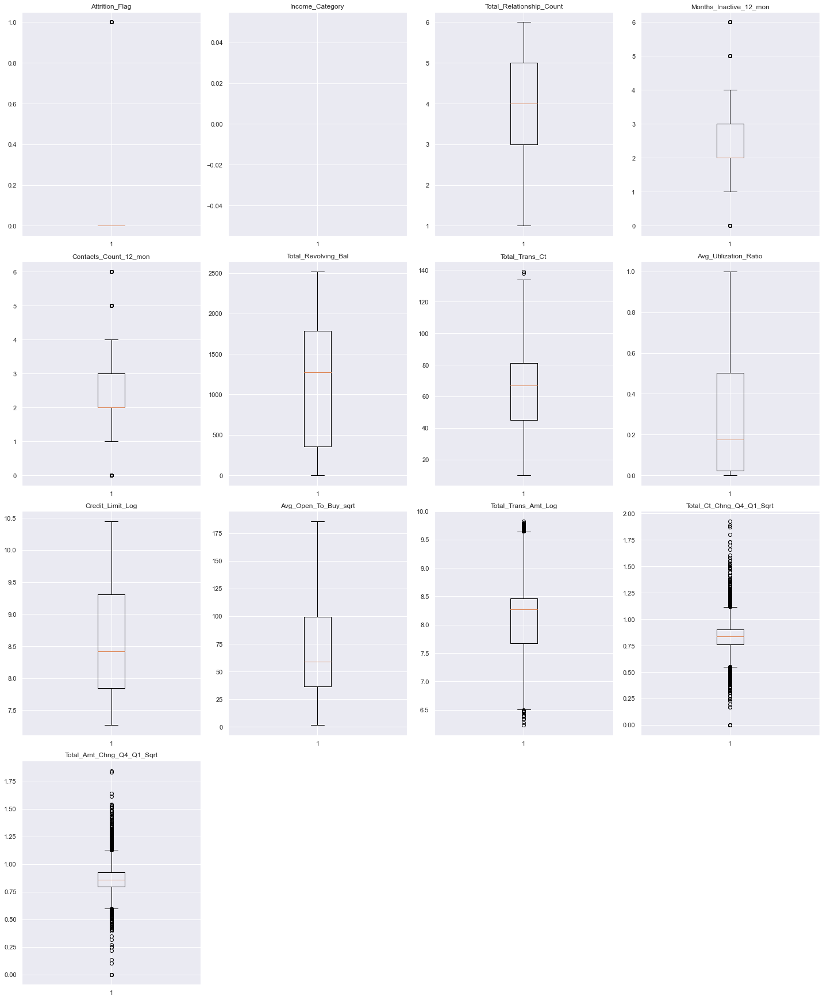

<IPython.core.display.Javascript object>

In [153]:
# Check outliers
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(churn_data[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

#### Observation: 

1. Outlier treatment is not required for these feature because those outlier values are very close to upper and lower whiskers and looks genuine and possible values. Those values are also tighlty close to each other and are not very far from each other.

#### E. Data Split - Training, Validation & Test

In [154]:
churn_data.dtypes

Attrition_Flag                  int64
Gender                       category
Education_Level              category
Marital_Status               category
Income_Category               float64
Card_Category                category
Total_Relationship_Count        int64
Months_Inactive_12_mon          int64
Contacts_Count_12_mon           int64
Total_Revolving_Bal             int64
Total_Trans_Ct                  int64
Avg_Utilization_Ratio         float64
Credit_Limit_Log              float64
Avg_Open_To_Buy_sqrt          float64
Total_Trans_Amt_Log           float64
Total_Ct_Chng_Q4_Q1_Sqrt      float64
Total_Amt_Chng_Q4_Q1_Sqrt     float64
dtype: object

<IPython.core.display.Javascript object>

In [155]:
# Create X and Y data for independent and dependent variables respectively
X = churn_data.drop(["Attrition_Flag",], axis=1,)

Y = churn_data["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [156]:
# Splitting data in temporary and test sets
X_temp, X_test, y_temp, y_test = train_test_split(
    X, Y, test_size=0.20, random_state=1, stratify=Y
)

<IPython.core.display.Javascript object>

In [157]:
# Splitting temporary data in train and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)

<IPython.core.display.Javascript object>

#### F. Data Split Check

In [158]:
# Check split of data

print(
    "{0:0.2f}% data is in Training set".format(
        (len(X_train) / len(churn_data.index)) * 100
    )
)
print(
    "{0:0.2f}% data is in Validation set".format(
        (len(X_val) / len(churn_data.index)) * 100
    )
)
print(
    "{0:0.2f}% data is in Test set".format((len(X_test) / len(churn_data.index)) * 100)
)

59.99% data is in Training set
20.01% data is in Validation set
20.01% data is in Test set


<IPython.core.display.Javascript object>

In [159]:
print("Shape of Training set : ", X_train.shape)
print("Shape of Validation set : ", X_val.shape)
print("Shape of Test set : ", X_test.shape)
print("Percentage of classes in Training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in Validation set:")
print(y_val.value_counts(normalize=True))
print("Percentage of classes in Test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (6075, 16)
Shape of Validation set :  (2026, 16)
Shape of Test set :  (2026, 16)
Percentage of classes in Training set:
0    0.839342
1    0.160658
Name: Attrition_Flag, dtype: float64
Percentage of classes in Validation set:
0    0.839092
1    0.160908
Name: Attrition_Flag, dtype: float64
Percentage of classes in Test set:
0    0.839585
1    0.160415
Name: Attrition_Flag, dtype: float64


<IPython.core.display.Javascript object>

In [160]:
# Check ProdTaken True/False ratio in split data

print(
    "Original Attrition True Values    : {0} ({1:0.2f}%)".format(
        len(churn_data.loc[churn_data["Attrition_Flag"] == 1]),
        (len(churn_data.loc[churn_data["Attrition_Flag"] == 1]) / len(churn_data.index))
        * 100,
    )
)
print(
    "Original Attrition False Values   : {0} ({1:0.2f}%)".format(
        len(churn_data.loc[churn_data["Attrition_Flag"] == 0]),
        (len(churn_data.loc[churn_data["Attrition_Flag"] == 0]) / len(churn_data.index))
        * 100,
    )
)
print("")
print(
    "Training Attrition True Values    : {0} ({1:0.2f}%)".format(
        len(y_train[y_train[:] == 1]),
        (len(y_train[y_train[:] == 1]) / len(y_train)) * 100,
    )
)
print(
    "Training Attrition False Values   : {0} ({1:0.2f}%)".format(
        len(y_train[y_train[:] == 0]),
        (len(y_train[y_train[:] == 0]) / len(y_train)) * 100,
    )
)
print("")
print(
    "Validation Attrition True Values  : {0} ({1:0.2f}%)".format(
        len(y_val[y_val[:] == 1]), (len(y_val[y_val[:] == 1]) / len(y_val)) * 100
    )
)
print(
    "Validation Attrition False Values : {0} ({1:0.2f}%)".format(
        len(y_val[y_val[:] == 0]), (len(y_val[y_val[:] == 0]) / len(y_val)) * 100
    )
)
print("")
print(
    "Test Attrition True Values        : {0} ({1:0.2f}%)".format(
        len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1]) / len(y_test)) * 100
    )
)
print(
    "Test Attrition False Values       : {0} ({1:0.2f}%)".format(
        len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0]) / len(y_test)) * 100
    )
)
print("")

Original Attrition True Values    : 1627 (16.07%)
Original Attrition False Values   : 8500 (83.93%)

Training Attrition True Values    : 976 (16.07%)
Training Attrition False Values   : 5099 (83.93%)

Validation Attrition True Values  : 326 (16.09%)
Validation Attrition False Values : 1700 (83.91%)

Test Attrition True Values        : 325 (16.04%)
Test Attrition False Values       : 1701 (83.96%)



<IPython.core.display.Javascript object>

#### G. Missing Value Treatment

In [161]:
# Check null values and its percentage

def check_null_values(data):
    return pd.DataFrame(
    {
        "Null values": data.isnull().sum(),
        "Percentage of Null values": round(
            (data.isnull().sum() / data.shape[0] * 100), 2
        ),
        "Data Type": data.dtypes,
    }
    )
    
    
check_null_values(X_train)


,Null values,Percentage of Null values,Data Type
Gender,0,0.00,category
Education_Level,928,15.28,category
Marital_Status,457,7.52,category
Income_Category,654,10.77,float64
Card_Category,0,0.00,category
Total_Relationship_Count,0,0.00,int64
Months_Inactive_12_mon,0,0.00,int64
Contacts_Count_12_mon,0,0.00,int64
Total_Revolving_Bal,0,0.00,int64
Total_Trans_Ct,0,0.00,int64


<IPython.core.display.Javascript object>

#### Observation : 
1. There are null values in categorical variable columns "Education_Level", "Marital_Status" and "Income_Category". This can be fixed by imputing mode values.

In [162]:
# defining a list with names of columns that will be used for imputation
reqd_col_for_impute_categorical = [
    "Education_Level",
    "Marital_Status",
]

reqd_col_for_impute_numerical = [
    "Income_Category",
]

<IPython.core.display.Javascript object>

In [163]:
# Instantiate simple imputer for categorical columns
categoric_imputer = SimpleImputer(strategy="most_frequent")

<IPython.core.display.Javascript object>

In [164]:
# Fit and transform the train data
X_train[reqd_col_for_impute_categorical] = categoric_imputer.fit_transform(
    X_train[reqd_col_for_impute_categorical]
)

# Transform the validation data
X_val[reqd_col_for_impute_categorical] = categoric_imputer.transform(
    X_val[reqd_col_for_impute_categorical]
)

# Transform the test data
X_test[reqd_col_for_impute_categorical] = categoric_imputer.transform(
    X_test[reqd_col_for_impute_categorical]
)

<IPython.core.display.Javascript object>

In [165]:
# Instantiate simple imputer for numerical columns
numeric_imputer = SimpleImputer(strategy="median")

<IPython.core.display.Javascript object>

In [166]:
# Fit and transform the train data
X_train[reqd_col_for_impute_numerical] = numeric_imputer.fit_transform(
    X_train[reqd_col_for_impute_numerical]
)

# Transform the validation data
X_val[reqd_col_for_impute_numerical] = numeric_imputer.transform(
    X_val[reqd_col_for_impute_numerical]
)

# Transform the test data
X_test[reqd_col_for_impute_numerical] = numeric_imputer.transform(
    X_test[reqd_col_for_impute_numerical]
)

<IPython.core.display.Javascript object>

In [167]:
# Convert columns as "category"
X_train["Gender"] = X_train["Gender"].astype("category")
X_train["Education_Level"] = X_train["Education_Level"].astype("category")
X_train["Marital_Status"] = X_train["Marital_Status"].astype("category")
X_train["Card_Category"] = X_train["Card_Category"].astype("category")

<IPython.core.display.Javascript object>

In [168]:
# Convert columns as "category"
X_val["Gender"] = X_val["Gender"].astype("category")
X_val["Education_Level"] = X_val["Education_Level"].astype("category")
X_val["Marital_Status"] = X_val["Marital_Status"].astype("category")
X_val["Card_Category"] = X_val["Card_Category"].astype("category")

<IPython.core.display.Javascript object>

In [169]:
# Convert columns as "category"
X_test["Gender"] = X_test["Gender"].astype("category")
X_test["Education_Level"] = X_test["Education_Level"].astype("category")
X_test["Marital_Status"] = X_test["Marital_Status"].astype("category")
X_test["Card_Category"] = X_test["Card_Category"].astype("category")

<IPython.core.display.Javascript object>

#### H. One Hot Encoding

In [170]:
# Create list of categorical columns for one hot encoding
reqd_col_for_encoding = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Card_Category",
]

<IPython.core.display.Javascript object>

In [171]:
# Apply one hot encoding in train, validation and test data
X_train = pd.get_dummies(X_train)
X_val = pd.get_dummies(X_val)
X_test = pd.get_dummies(X_test)

<IPython.core.display.Javascript object>

### 7. Model Building

#### Confusion Matrix

Confusion Matrix is performance measure of models

**True Positives (TP):** we correctly predicted that customers will churn, and they did.

**True Negatives (TN):** we correctly predicted that customers will not churn, and they did not.

**False Positives (FP):** we correctly predicted that customers will churn, but, they did not (a "Type I error").

**False Negatives (FN):** we correctly predicted that customers will not churn, but, they did (a "Type II error").

### Model evaluation criterion

### Model can make wrong predictions as:

1. Predicting a customer will churn but in reality the customer would not churn. - Loss of resources for marketing/sales or contacting customers.

2. Predicting a customer will not churn but in reality the customer would have churn. - Loss of customer/revenue.

### Which case is more important? 

* Second case is important as given below:

* If we predict a customer will not churn but in reality the customer would churn, then company will loose customer and revenue.


### How to reduce this loss i.e need to reduce False Negatives?

*  `recall` should be maximized, the greater the recall higher the chances of minimizing the false negatives.

In [172]:
# defining a function to plot the confusion_matrix of a classification model built using sklearn
def make_confusion_matrix(model, predictors, target, text=None):
    """
    To plot the confusion_matrix

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    pred = model.predict(predictors)

    cf_matrix = metrics.confusion_matrix(target, pred)

    group_names = ["True Neg", "False Pos", "False Neg", "True Pos"]

    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]

    group_percentages = [
        "{0:.2%}".format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)
    ]

    labels = [
        f"{v1}\n{v2}\n{v3}"
        for v1, v2, v3 in zip(group_names, group_counts, group_percentages)
    ]

    labels = np.asarray(labels).reshape(2, 2)

    plt.figure(figsize=(8, 5))
    ax = sns.heatmap(
        cf_matrix,
        annot=labels,
        fmt="",
        cmap="Blues",
        linewidths=2,
        linecolor="black",
        # cbar=True,
    )

    ax.set_title("Confusion Matrix For " + text + " Data \n\n")
    ax.set_xlabel("\nPredicted Values")
    ax.set_ylabel("Actual Values ")

    ## Ticket labels - List must be in alphabetical order
    ax.xaxis.set_ticklabels(["False", "True"])
    ax.yaxis.set_ticklabels(["False", "True"])

    # plt.grid(b=None, axis="both", which="both", visible=True)

    ## Display the visualization of the Confusion Matrix.
    plt.show()

<IPython.core.display.Javascript object>

In [173]:
def get_confusion_matrix(model, data_category=None, include_test=None):
    """
    To get confusion_matrix for both test and train

    model: classifier
    """
    if data_category is None:
        predictors = X_train
        target = y_train
    elif data_category == "over":
        predictors = X_train_over
        target = y_train_over
    elif data_category == "under":
        predictors = X_train_under
        target = y_train_under

    make_confusion_matrix(model, predictors, target, "Train")
    print("\n")
    make_confusion_matrix(model, X_val, y_val, "Validation")

    if include_test == True:
        print("\n")
        make_confusion_matrix(model, X_test, y_test, "Testing")

<IPython.core.display.Javascript object>

In [174]:
##  Function to calculate different metric scores of the model - Accuracy, Recall, Precision, F1 and ROC-AUC Score
def get_metrics_score(model, flag=True, data_category=None, include_test=None):
    """
    model : classifier to predict values of X

    """

    if data_category is None:
        predictors = X_train
        target = y_train
    elif data_category == "over":
        predictors = X_train_over
        target = y_train_over
    elif data_category == "under":
        predictors = X_train_under
        target = y_train_under

    # defining an empty list to store train and test results
    score_list = []

    # Predicting on train, validation and tests
    pred_train = model.predict(predictors)
    pred_val = model.predict(X_val)
    pred_test = model.predict(X_test)

    # Accuracy of the model
    train_acc = model.score(predictors, target)
    val_acc = model.score(X_val, y_val)
    test_acc = model.score(X_test, y_test)

    # Recall of the model
    train_recall = metrics.recall_score(target, pred_train)
    val_recall = metrics.recall_score(y_val, pred_val)
    test_recall = metrics.recall_score(y_test, pred_test)

    # Precision of the model
    train_precision = metrics.precision_score(target, pred_train)
    val_precision = metrics.precision_score(y_val, pred_val)
    test_precision = metrics.precision_score(y_test, pred_test)

    # F1 Score of the model
    train_f1 = metrics.f1_score(target, pred_train)
    val_f1 = metrics.f1_score(y_val, pred_val)
    test_f1 = metrics.f1_score(y_test, pred_test)

    # ROC-AUC Score of the model
    train_roc_auc = metrics.roc_auc_score(target, pred_train)
    val_roc_auc = metrics.roc_auc_score(y_val, pred_val)
    test_roc_auc = metrics.roc_auc_score(y_test, pred_test)

    if include_test == None:
        score_list.extend(
            (
                train_acc,
                val_acc,
                train_recall,
                val_recall,
                train_precision,
                val_precision,
                train_f1,
                val_f1,
                train_roc_auc,
                val_roc_auc,
            )
        )

        # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
        if flag == True:

            display(
                pd.DataFrame(
                    {
                        # "Score": ["Accuracy", "Recall", "Precision", "F1","ROC-AUC"],
                        "Training Score": [
                            train_acc,
                            train_recall,
                            train_precision,
                            train_f1,
                            train_roc_auc,
                        ],
                        "Validation Score": [
                            val_acc,
                            val_recall,
                            val_precision,
                            val_f1,
                            val_roc_auc,
                        ],
                    },
                    index=["Accuracy", "Recall", "Precision", "F1", "ROC-AUC"],
                )
            )
    else:
        score_list.extend(
            (
                train_acc,
                val_acc,
                test_acc,
                train_recall,
                val_recall,
                test_recall,
                train_precision,
                val_precision,
                test_precision,
                train_f1,
                val_f1,
                test_f1,
                train_roc_auc,
                val_roc_auc,
                test_roc_auc,
            )
        )

        # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
        if flag == True:

            display(
                pd.DataFrame(
                    {
                        # "Score": ["Accuracy", "Recall", "Precision", "F1","ROC-AUC"],
                        "Training Score": [
                            train_acc,
                            train_recall,
                            train_precision,
                            train_f1,
                            train_roc_auc,
                        ],
                        "Validation Score": [
                            val_acc,
                            val_recall,
                            val_precision,
                            val_f1,
                            val_roc_auc,
                        ],
                        "Testing Score": [
                            test_acc,
                            test_recall,
                            test_precision,
                            test_f1,
                            test_roc_auc,
                        ],
                    },
                    index=["Accuracy", "Recall", "Precision", "F1", "ROC-AUC"],
                )
            )

    return score_list  # returning the list with train and test scores

<IPython.core.display.Javascript object>

####  A. Logistic Regression

In [175]:
lg_estimator = LogisticRegression(random_state=1)
lg_estimator.fit(X_train, y_train)

LogisticRegression(random_state=1)

<IPython.core.display.Javascript object>

In [176]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
lg_estimator_score = get_metrics_score(lg_estimator)

,Training Score,Validation Score
Accuracy,0.900247,0.918065
Recall,0.549180,0.616564
Precision,0.763533,0.830579
F1,0.638856,0.707746
ROC-AUC,0.758312,0.796223


<IPython.core.display.Javascript object>

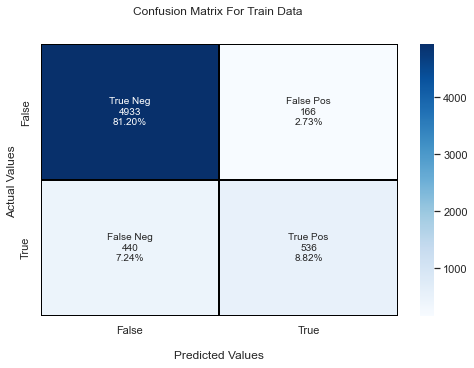

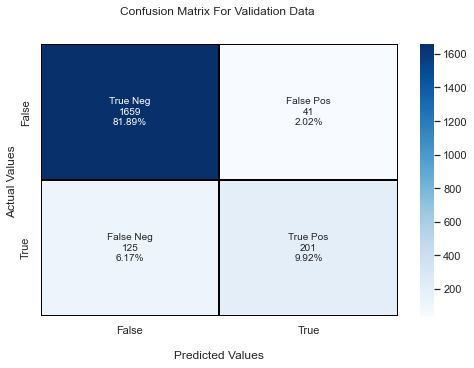

<IPython.core.display.Javascript object>

In [177]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(lg_estimator)

#### Observation : 

1. Model performance need to be further improved.

####  B. Decision Tree

In [178]:
dtree_estimator = DecisionTreeClassifier(random_state=1)
dtree_estimator.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [179]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
dtree_estimator_score = get_metrics_score(dtree_estimator)

,Training Score,Validation Score
Accuracy,1.0,0.932379
Recall,1.0,0.785276
Precision,1.0,0.792570
F1,1.0,0.788906
ROC-AUC,1.0,0.872932


<IPython.core.display.Javascript object>

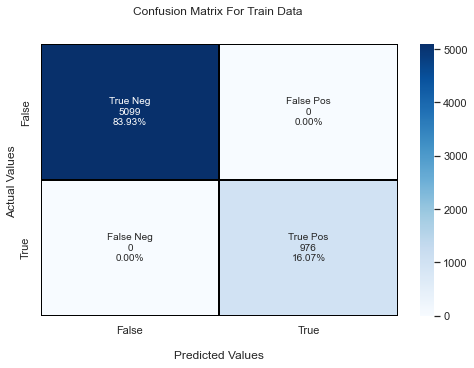

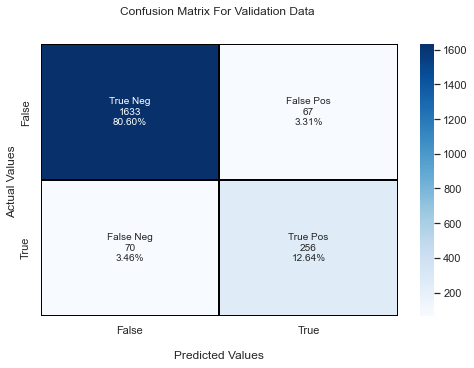

<IPython.core.display.Javascript object>

In [180]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(dtree_estimator)

#### Observation : 

1. Model performance need to be further improved.

####  C. Bagging Classifier

In [181]:
# base_estimator for bagging classifier is a decision tree by default
bagging_estimator = BaggingClassifier(random_state=1)
bagging_estimator.fit(X_train, y_train)

BaggingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [182]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
bagging_estimator_score = get_metrics_score(bagging_estimator)

,Training Score,Validation Score
Accuracy,0.996872,0.951135
Recall,0.982582,0.806748
Precision,0.997919,0.879599
F1,0.990191,0.841600
ROC-AUC,0.991095,0.892786


<IPython.core.display.Javascript object>

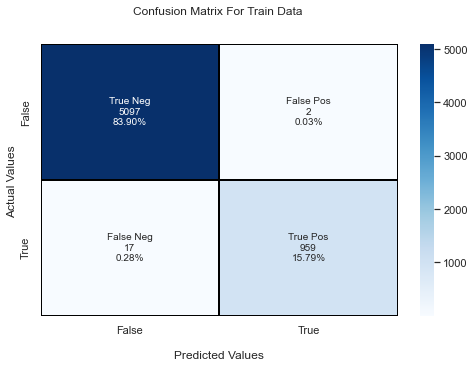

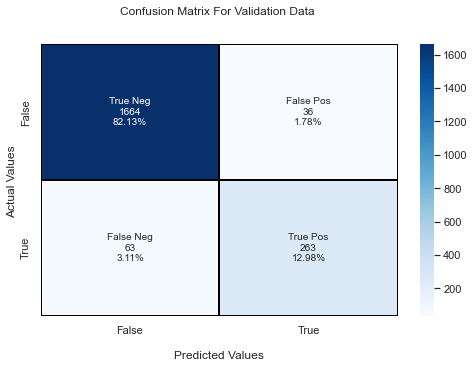

<IPython.core.display.Javascript object>

In [183]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(bagging_estimator)

#### Observation : 

1. Model performance need to be further improved.

####  D. Random Forest

In [184]:
# Train the random forest classifier
rf_estimator = RandomForestClassifier(random_state=1)
rf_estimator.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [185]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
rf_estimator_score = get_metrics_score(rf_estimator)

,Training Score,Validation Score
Accuracy,1.0,0.957058
Recall,1.0,0.797546
Precision,1.0,0.925267
F1,1.0,0.856672
ROC-AUC,1.0,0.892597


<IPython.core.display.Javascript object>

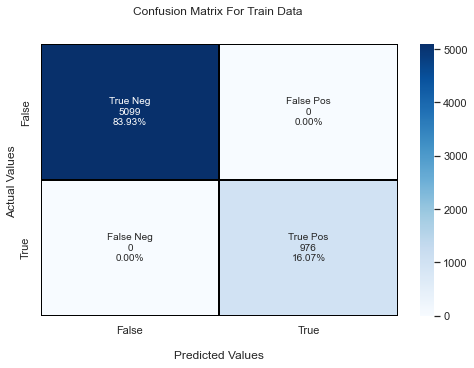

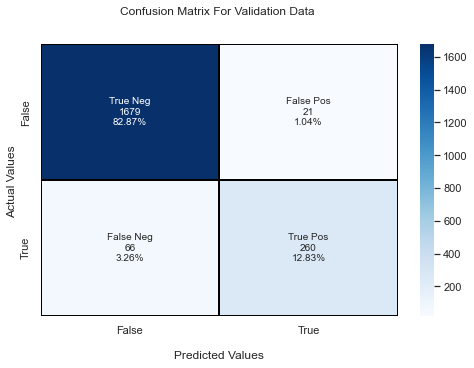

<IPython.core.display.Javascript object>

In [186]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(rf_estimator)

#### Observation : 

1. Model performance need to be further improved.

####  E. AdaBoost

In [187]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train, y_train)

AdaBoostClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [188]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
abc_score = get_metrics_score(abc)

,Training Score,Validation Score
Accuracy,0.956379,0.953110
Recall,0.827869,0.819018
Precision,0.892818,0.881188
F1,0.859117,0.848967
ROC-AUC,0.904423,0.898921


<IPython.core.display.Javascript object>

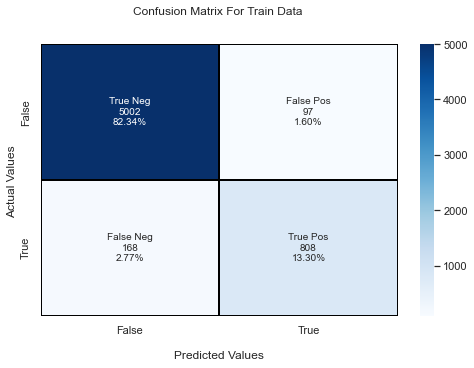

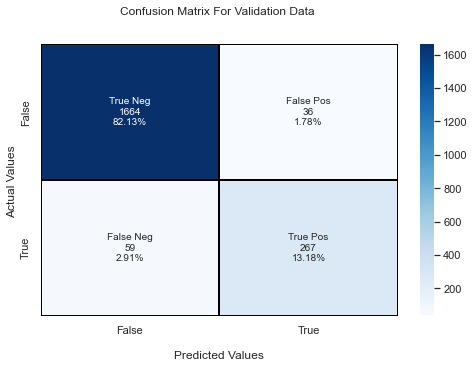

<IPython.core.display.Javascript object>

In [189]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(abc)

#### Observation : 

1. Model performance need to be further improved.

####  F. Gradient Boosting

In [190]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [191]:
# Using above defined function to get accuracy, recall, precision and F1 on train and validation set
gbc_score = get_metrics_score(gbc)

,Training Score,Validation Score
Accuracy,0.969053,0.967917
Recall,0.869877,0.871166
Precision,0.932967,0.925081
F1,0.900318,0.897314
ROC-AUC,0.928957,0.928818


<IPython.core.display.Javascript object>

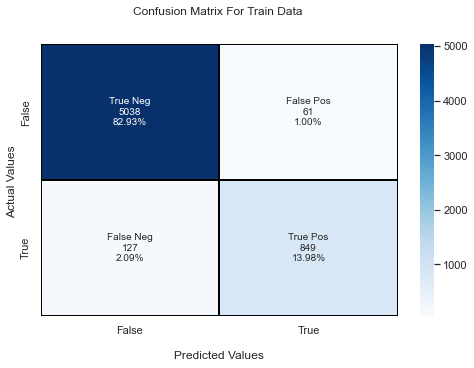

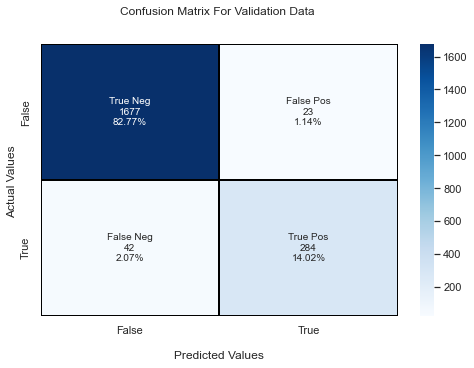

<IPython.core.display.Javascript object>

In [192]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(gbc)

#### Observation : 

1. Model performance need to be further improved.

### 8. Model Building - Performance Comparison

In [193]:
def model_performance_comparison(model_list, model_name_list, include_test=None):

    # defining empty lists to add train and validation results
    acc_train = []
    acc_val = []
    acc_test = []
    recall_train = []
    recall_val = []
    recall_test = []
    precision_train = []
    precision_val = []
    precision_test = []
    f1_train = []
    f1_val = []
    f1_test = []
    roc_auc_train = []
    roc_auc_val = []
    roc_auc_test = []

    # looping through all the models to get the accuracy, precall, precision, f1 and ROC-AUC scores
    for model in model_list:
        j = get_metrics_score(model, False, include_test=True)
        acc_train.append(np.round(j[0], 2))
        acc_val.append(np.round(j[1], 2))
        acc_test.append(np.round(j[2], 2))
        recall_train.append(np.round(j[3], 2))
        recall_val.append(np.round(j[4], 2))
        recall_test.append(np.round(j[5], 2))
        precision_train.append(np.round(j[6], 2))
        precision_val.append(np.round(j[7], 2))
        precision_test.append(np.round(j[8], 2))
        f1_train.append(np.round(j[9], 2))
        f1_val.append(np.round(j[10], 2))
        f1_test.append(np.round(j[11], 2))
        roc_auc_train.append(np.round(j[12], 2))
        roc_auc_val.append(np.round(j[13], 2))
        roc_auc_test.append(np.round(j[14], 2))

    if include_test == None:
        display(
            pd.DataFrame(
                {
                    "Model": model_name_list,
                    "Train_Accuracy": acc_train,
                    "Validation_Accuracy": acc_val,
                    "Train_Recall": recall_train,
                    "Validation_Recall": recall_val,
                    "Train_Precision": precision_train,
                    "Validation_Precision": precision_val,
                    "Train_F1": f1_train,
                    "Validation_F1": f1_val,
                    # "Train_ROC-AUC": roc_auc_train,
                    # "Validation_ROC-AUC": roc_auc_test,
                }
            )
        )
    else:
        display(
            pd.DataFrame(
                {
                    "Model": model_name_list,
                    "Train_Accuracy": acc_train,
                    "Validation_Accuracy": acc_val,
                    "Testing_Accuracy": acc_test,
                    "Train_Recall": recall_train,
                    "Validation_Recall": recall_val,
                    "Testing_Recall": recall_test,
                    "Train_Precision": precision_train,
                    "Validation_Precision": precision_val,
                    "Testing_Precision": precision_test,
                    "Train_F1": f1_train,
                    "Validation_F1": f1_val,
                    "Testing_F1": f1_test,
                    # "Train_ROC-AUC": roc_auc_train,
                    # "Validation_ROC-AUC": roc_auc_test,
                },
                index=model_name_list,
            ).T
        )

<IPython.core.display.Javascript object>

In [194]:
model_performance_comparison(
    [lg_estimator, dtree_estimator, bagging_estimator, rf_estimator, abc, gbc],
    [
        "Logistic Regression with default parameters",
        "Decision Tree with deafult parameters",
        "Bagging Classifier with deafult parameters",
        "Random Forest with default parameters",
        "AdaBoost Classifier with deafult parameters",
        "Gradient Boost Classifier with deafult parameters",
    ],
)

,Model,Train_Accuracy,Validation_Accuracy,Train_Recall,Validation_Recall,Train_Precision,Validation_Precision,Train_F1,Validation_F1
0,Logistic Regression with default parameters,0.90,0.92,0.55,0.62,0.76,0.83,0.64,0.71
1,Decision Tree with deafult parameters,1.00,0.93,1.00,0.79,1.00,0.79,1.00,0.79
2,Bagging Classifier with deafult parameters,1.00,0.95,0.98,0.81,1.00,0.88,0.99,0.84
3,Random Forest with default parameters,1.00,0.96,1.00,0.80,1.00,0.93,1.00,0.86
4,AdaBoost Classifier with deafult parameters,0.96,0.95,0.83,0.82,0.89,0.88,0.86,0.85
5,Gradient Boost Classifier with deafult parameters,0.97,0.97,0.87,0.87,0.93,0.93,0.90,0.90


<IPython.core.display.Javascript object>

#### Observation : 

1. Performance of six models on various metrics has been displayed.
2. Recall score is our right metric as per business case.
3. **Gradient Boost Classifier Model gives best recall score of 0.87 in both training and validation sets. Other scores like Accuracy, Precision and F1 is also very good for this model. This model is not overfitted and generalises well in training and validation. This model is a good suggestion for production.**

### 8. Model Building - Oversampled data

#### Oversampling train data using SMOTE

In [195]:
# Fit SMOTE on train data(Synthetic Minority Oversampling Technique)
sm = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)



<IPython.core.display.Javascript object>

In [196]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 976
Before OverSampling, count of label '0': 5099 

After OverSampling, count of label '1': 2039
After OverSampling, count of label '0': 5099 

After OverSampling, the shape of train_X: (7138, 27)
After OverSampling, the shape of train_y: (7138,) 



<IPython.core.display.Javascript object>

####  A. Logistic Regression

In [197]:
lg_estimator_over = LogisticRegression(random_state=1)
lg_estimator_over.fit(X_train_over, y_train_over)

LogisticRegression(random_state=1)

<IPython.core.display.Javascript object>

In [198]:
# Using above defined function to get accuracy, recall and precision on train and validation set
lg_estimator_over_score = get_metrics_score(lg_estimator_over, data_category="over")

,Training Score,Validation Score
Accuracy,0.874755,0.907700
Recall,0.704267,0.699387
Precision,0.831500,0.719243
F1,0.762613,0.709176
ROC-AUC,0.823598,0.823517


<IPython.core.display.Javascript object>

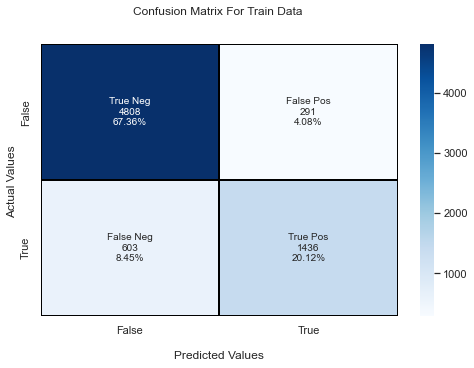

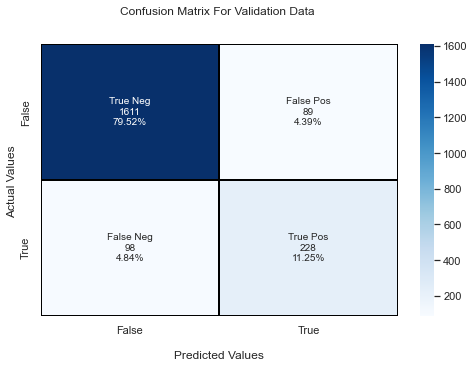

<IPython.core.display.Javascript object>

In [199]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(lg_estimator_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

####  B. Decision Tree

In [200]:
dtree_estimator_over = DecisionTreeClassifier(random_state=1)
dtree_estimator_over.fit(X_train_over, y_train_over)

DecisionTreeClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [201]:
# Using above defined function to get accuracy, recall and precision on train and validation set
dtree_estimator_over_score = get_metrics_score(
    dtree_estimator_over, data_category="over"
)

,Training Score,Validation Score
Accuracy,1.0,0.933860
Recall,1.0,0.831288
Precision,1.0,0.774286
F1,1.0,0.801775
ROC-AUC,1.0,0.892409


<IPython.core.display.Javascript object>

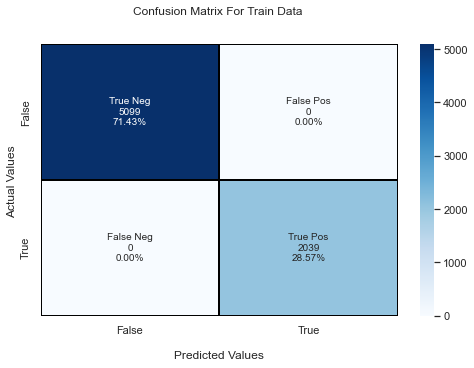

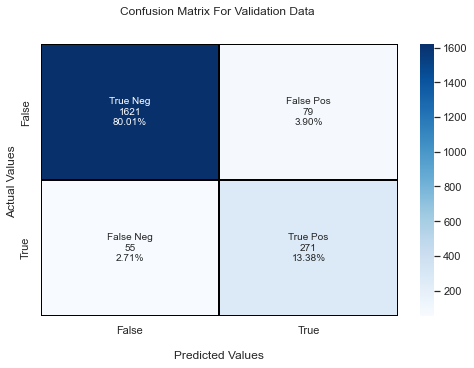

<IPython.core.display.Javascript object>

In [202]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(dtree_estimator_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

####  C. Bagging Classifier

In [203]:
# base_estimator for bagging classifier is a decision tree by default
bagging_estimator_over = BaggingClassifier(random_state=1)
bagging_estimator_over.fit(X_train_over, y_train_over)

BaggingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [204]:
# Using above defined function to get accuracy, recall and precision on train and validation set
bagging_estimator_over_score = get_metrics_score(
    bagging_estimator_over, data_category="over"
)

,Training Score,Validation Score
Accuracy,0.995937,0.954097
Recall,0.990191,0.852761
Precision,0.995562,0.860681
F1,0.992869,0.856703
ROC-AUC,0.994213,0.913145


<IPython.core.display.Javascript object>

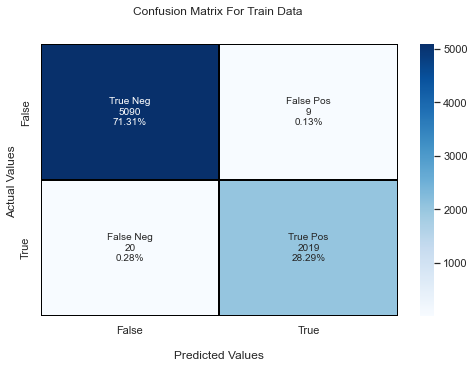

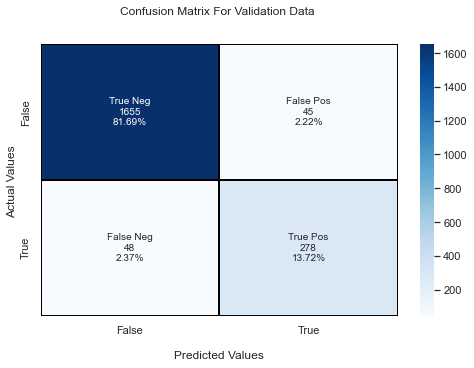

<IPython.core.display.Javascript object>

In [205]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(bagging_estimator_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

####  D. Random Forest

In [206]:
# Train the random forest classifier
rf_estimator_over = RandomForestClassifier(random_state=1)
rf_estimator_over.fit(X_train_over, y_train_over)

RandomForestClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [207]:
# Using above defined function to get accuracy, recall and precision on train and validation set
rf_estimator_over_score = get_metrics_score(rf_estimator_over, data_category="over")

,Training Score,Validation Score
Accuracy,1.0,0.958045
Recall,1.0,0.840491
Precision,1.0,0.892508
F1,1.0,0.865719
ROC-AUC,1.0,0.910540


<IPython.core.display.Javascript object>

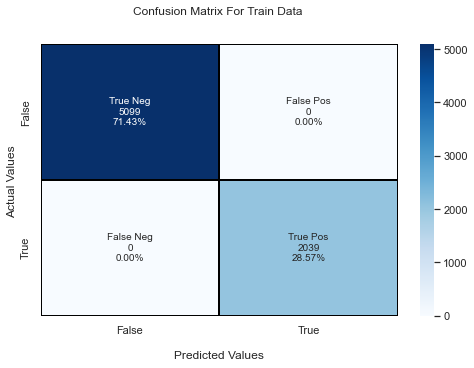

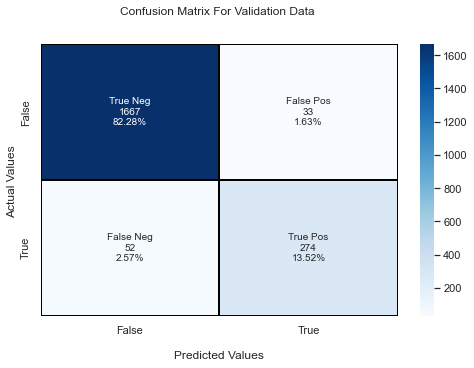

<IPython.core.display.Javascript object>

In [208]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(rf_estimator_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

####  E. AdaBoost

In [209]:
abc_over = AdaBoostClassifier(random_state=1)
abc_over.fit(X_train_over, y_train_over)

AdaBoostClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [210]:
# Using above defined function to get accuracy, recall and precision on train and validation set
abc_over_score = get_metrics_score(abc_over, data_category="over")

,Training Score,Validation Score
Accuracy,0.951107,0.955084
Recall,0.908288,0.868098
Precision,0.919563,0.854985
F1,0.913891,0.861492
ROC-AUC,0.938259,0.919931


<IPython.core.display.Javascript object>

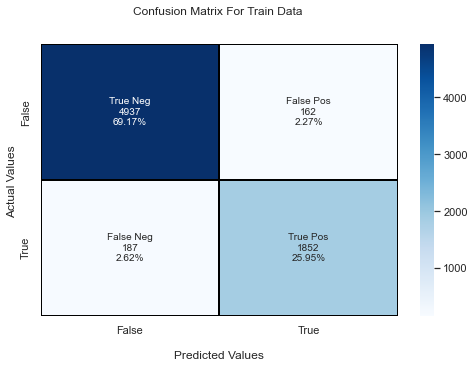

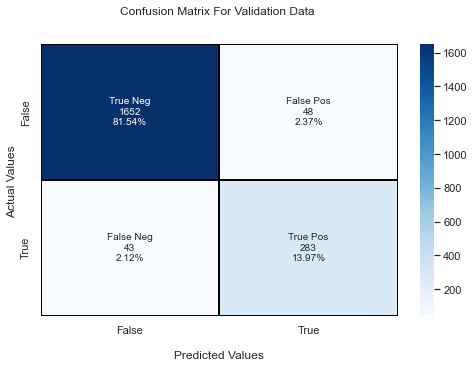

<IPython.core.display.Javascript object>

In [211]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(abc_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

####  F. Gradient Boosting

In [212]:
gbc_over = GradientBoostingClassifier(random_state=1)
gbc_over.fit(X_train_over, y_train_over)

GradientBoostingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [213]:
# Using above defined function to get accuracy, recall and precision on train and validation set
gbc_over_score = get_metrics_score(gbc_over, data_category="over")

,Training Score,Validation Score
Accuracy,0.969319,0.962488
Recall,0.934772,0.883436
Precision,0.956827,0.883436
F1,0.945671,0.883436
ROC-AUC,0.958953,0.930541


<IPython.core.display.Javascript object>

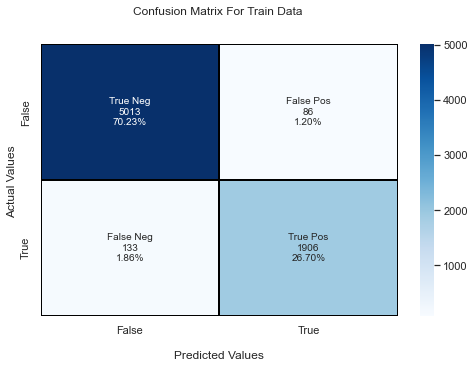

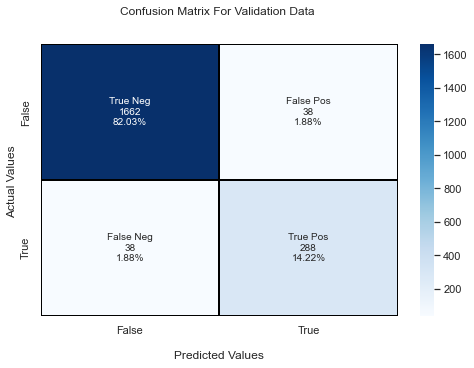

<IPython.core.display.Javascript object>

In [214]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(gbc_over, data_category="over")

#### Observation : 

1. Model performance need to be further improved.

### 8. Model Building - Oversampled Data - Performance Comparison

In [215]:
model_performance_comparison(
    [
        lg_estimator_over,
        dtree_estimator_over,
        bagging_estimator_over,
        rf_estimator_over,
        abc_over,
        gbc_over,
    ],
    [
        "Logistic Regression with default parameters and over sampled data",
        "Decision Tree with deafult parameters and over sampled data",
        "Bagging Classifier with deafult parameters and over sampled data",
        "Random Forest with default parameters and over sampled data",
        "AdaBoost Classifier with deafult parameters and over sampled data",
        "Gradient Boost Classifier with deafult parameters and over sampled data",
    ],
)

,Model,Train_Accuracy,Validation_Accuracy,Train_Recall,Validation_Recall,Train_Precision,Validation_Precision,Train_F1,Validation_F1
0,Logistic Regression with default parameters an...,0.89,0.91,0.60,0.70,0.67,0.72,0.63,0.71
1,Decision Tree with deafult parameters and over...,1.00,0.93,1.00,0.83,1.00,0.77,1.00,0.80
2,Bagging Classifier with deafult parameters and...,1.00,0.95,0.99,0.85,0.99,0.86,0.99,0.86
3,Random Forest with default parameters and over...,1.00,0.96,1.00,0.84,1.00,0.89,1.00,0.87
4,AdaBoost Classifier with deafult parameters an...,0.95,0.96,0.86,0.87,0.84,0.85,0.85,0.86
5,Gradient Boost Classifier with deafult paramet...,0.97,0.96,0.90,0.88,0.91,0.88,0.91,0.88


<IPython.core.display.Javascript object>

#### Observation : 

1. Performance of six models on various metrics has been displayed.
2. Recall score is our right metric as per business case.
3. **Gradient Boost Classifier Model gives best recall score of 0.88 in validation set. Other scores like Accuracy, Precision and F1 is also very good for this model. This model is not overfitted and generalises well in training and validation. This model is a good fit and a good suggestion for production.**

### 9. Model Building - Undersampled data

In [216]:
# fit random under sampler on the train data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

<IPython.core.display.Javascript object>

In [217]:
print("Before Under Sampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before Under Sampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, count of label '1': {}".format(sum(y_train_under == 1)))
print("After Under Sampling, count of label '0': {} \n".format(sum(y_train_under == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_under.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_under.shape))

Before Under Sampling, count of label '1': 976
Before Under Sampling, count of label '0': 5099 

After Under Sampling, count of label '1': 976
After Under Sampling, count of label '0': 976 

After Under Sampling, the shape of train_X: (1952, 27)
After Under Sampling, the shape of train_y: (1952,) 



<IPython.core.display.Javascript object>

####  A. Logistic Regression

In [218]:
lg_estimator_under = LogisticRegression(random_state=1)
lg_estimator_under.fit(X_train_under, y_train_under)

LogisticRegression(random_state=1)

<IPython.core.display.Javascript object>

In [219]:
# Using above defined function to get accuracy, recall and precision on train and validation set
lg_estimator_under_score = get_metrics_score(lg_estimator_under, data_category="under")

,Training Score,Validation Score
Accuracy,0.840164,0.851431
Recall,0.848361,0.855828
Precision,0.834677,0.523452
F1,0.841463,0.649593
ROC-AUC,0.840164,0.853208


<IPython.core.display.Javascript object>

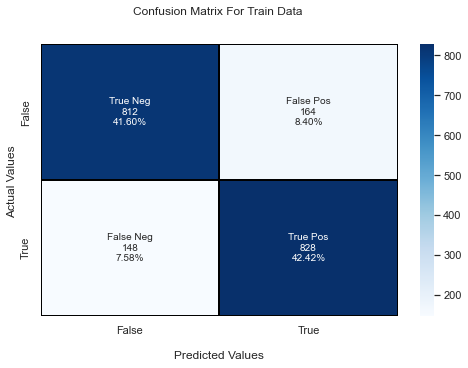

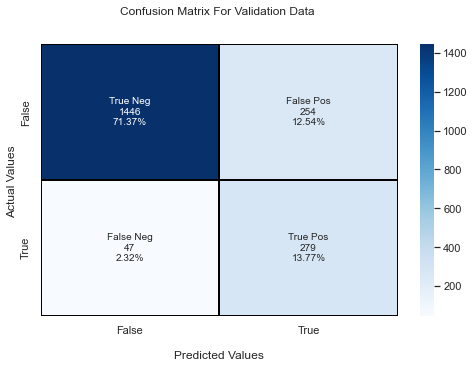

<IPython.core.display.Javascript object>

In [220]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(lg_estimator_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

####  B. Decision Tree

In [221]:
dtree_estimator_under = DecisionTreeClassifier(random_state=1)
dtree_estimator_under.fit(X_train_under, y_train_under)

DecisionTreeClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [222]:
# Using above defined function to get accuracy, recall and precision on train and validation set
dtree_estimator_under_score = get_metrics_score(
    dtree_estimator_under, data_category="under"
)

,Training Score,Validation Score
Accuracy,1.0,0.895854
Recall,1.0,0.911043
Precision,1.0,0.620042
F1,1.0,0.737888
ROC-AUC,1.0,0.901992


<IPython.core.display.Javascript object>

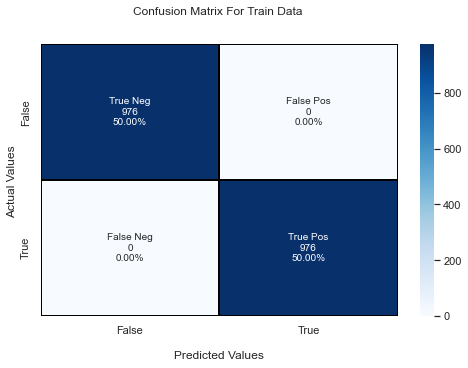

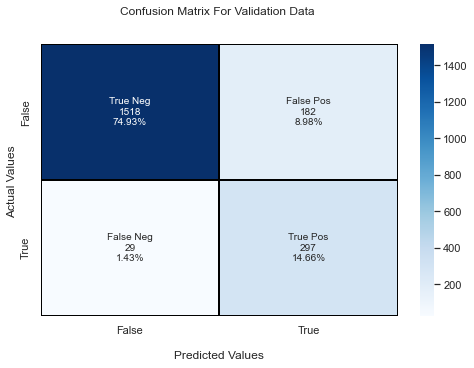

<IPython.core.display.Javascript object>

In [223]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(dtree_estimator_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

####  C. Bagging Classifier

In [224]:
# base_estimator for bagging classifier is a decision tree by default
bagging_estimator_under = BaggingClassifier(random_state=1)
bagging_estimator_under.fit(X_train_under, y_train_under)

BaggingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [225]:
# Using above defined function to get accuracy, recall and precision on train and validation set
bagging_estimator_under_score = get_metrics_score(
    bagging_estimator_under, data_category="under"
)

,Training Score,Validation Score
Accuracy,0.994877,0.925962
Recall,0.992828,0.929448
Precision,0.996914,0.704651
F1,0.994867,0.801587
ROC-AUC,0.994877,0.927371


<IPython.core.display.Javascript object>

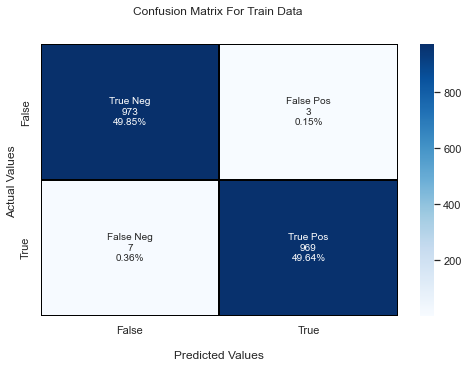

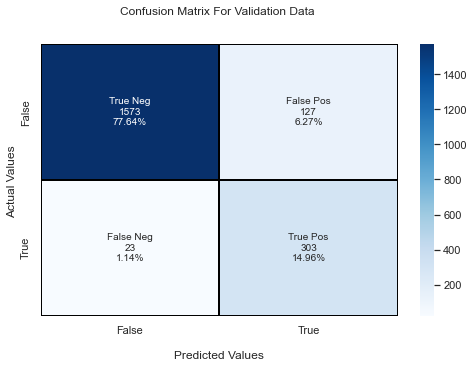

<IPython.core.display.Javascript object>

In [226]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(bagging_estimator_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

####  D. Random Forest

In [227]:
# Train the random forest classifier
rf_estimator_under = RandomForestClassifier(random_state=1)
rf_estimator_under.fit(X_train_under, y_train_under)

RandomForestClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [228]:
# Using above defined function to get accuracy, recall and precision on train and validation set
rf_estimator_under_score = get_metrics_score(rf_estimator_under, data_category="under")

,Training Score,Validation Score
Accuracy,1.0,0.930405
Recall,1.0,0.926380
Precision,1.0,0.720764
F1,1.0,0.810738
ROC-AUC,1.0,0.928778


<IPython.core.display.Javascript object>

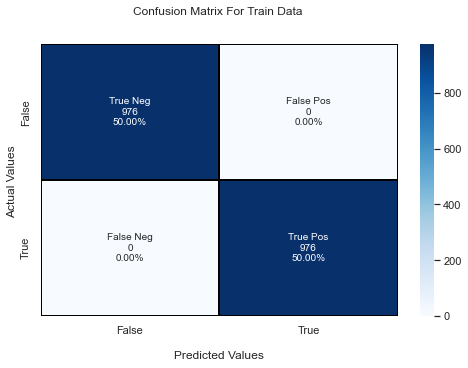

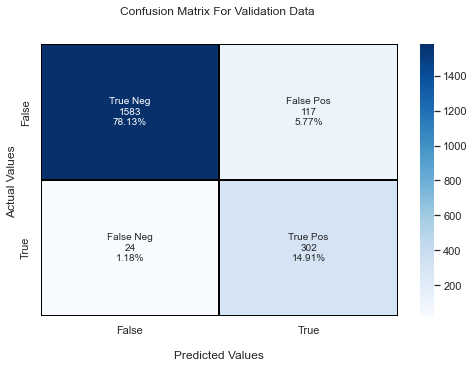

<IPython.core.display.Javascript object>

In [229]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(rf_estimator_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

####  E. AdaBoost

In [230]:
abc_under = AdaBoostClassifier(random_state=1)
abc_under.fit(X_train_under, y_train_under)

AdaBoostClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [231]:
# Using above defined function to get accuracy, recall and precision on train and validation set
abc_under_score = get_metrics_score(abc_under, data_category="under")

,Training Score,Validation Score
Accuracy,0.947746,0.937808
Recall,0.952869,0.966258
Precision,0.943205,0.732558
F1,0.948012,0.833333
ROC-AUC,0.947746,0.949305


<IPython.core.display.Javascript object>

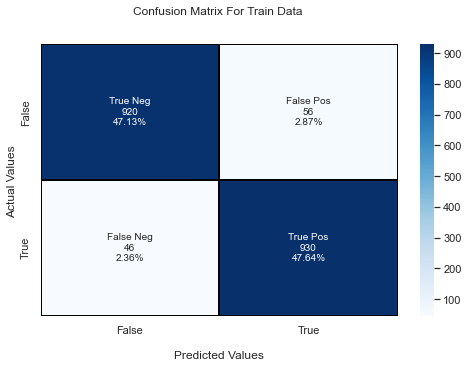

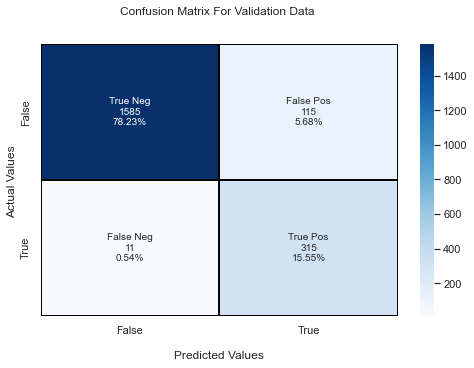

<IPython.core.display.Javascript object>

In [232]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(abc_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

####  F. Gradient Boosting

In [233]:
gbc_under = GradientBoostingClassifier(random_state=1)
gbc_under.fit(X_train_under, y_train_under)

GradientBoostingClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [234]:
# Using above defined function to get accuracy, recall and precision on train and validation set
gbc_under_score = get_metrics_score(gbc_under, data_category="under")

,Training Score,Validation Score
Accuracy,0.968750,0.938796
Recall,0.980533,0.957055
Precision,0.957958,0.739336
F1,0.969114,0.834225
ROC-AUC,0.968750,0.946175


<IPython.core.display.Javascript object>

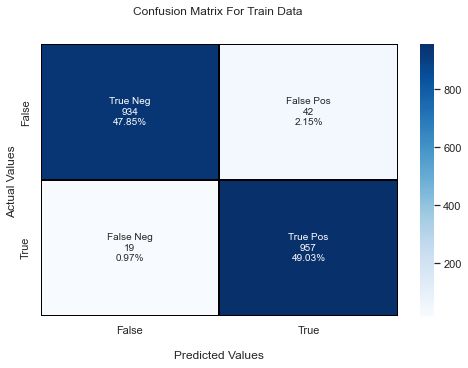

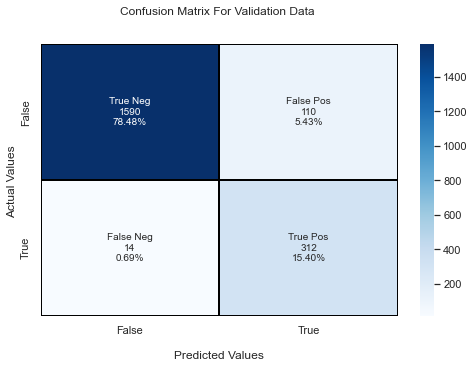

<IPython.core.display.Javascript object>

In [235]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(gbc_under, data_category="under")

#### Observation : 

1. Model performance need to be further improved.

### 8. Model Building - Undersampled Data - Performance Comparison

In [236]:
model_performance_comparison(
    [
        lg_estimator_under,
        dtree_estimator_under,
        bagging_estimator_under,
        rf_estimator_under,
        abc_under,
        gbc_under,
    ],
    [
        "Logistic Regression with default parameters and under sampled data",
        "Decision Tree with deafult parameters and under sampled data",
        "Bagging Classifier with deafult parameters and under sampled data",
        "Random Forest with default parameters and under sampled data",
        "AdaBoost Classifier with deafult parameters and under sampled data",
        "Gradient Boost Classifier with deafult parameters and under sampled data",
    ],
)

,Model,Train_Accuracy,Validation_Accuracy,Train_Recall,Validation_Recall,Train_Precision,Validation_Precision,Train_F1,Validation_F1
0,Logistic Regression with default parameters an...,0.83,0.85,0.85,0.86,0.49,0.52,0.62,0.65
1,Decision Tree with deafult parameters and unde...,0.92,0.90,1.00,0.91,0.67,0.62,0.80,0.74
2,Bagging Classifier with deafult parameters and...,0.94,0.93,0.99,0.93,0.74,0.70,0.85,0.80
3,Random Forest with default parameters and unde...,0.94,0.93,1.00,0.93,0.74,0.72,0.85,0.81
4,AdaBoost Classifier with deafult parameters an...,0.93,0.94,0.95,0.97,0.72,0.73,0.82,0.83
5,Gradient Boost Classifier with deafult paramet...,0.94,0.94,0.98,0.96,0.74,0.74,0.85,0.83


<IPython.core.display.Javascript object>

#### Observation : 

1. Performance of six models on various metrics has been displayed.
2. Recall score is our right metric as per business case.
3. **AdaBoost Classifier Model gives best recall score of 0.97 in validation set. Other scores like Accuracy, and F1 is also very good for this model. However, pecision score is not good. This model is not overfitted and generalises well in training and validation. This model is a good fit and a good suggestion for production.**

### 10. Hyperparameter tuning using random search

Below three models were selection from 18 models trained above. Recall score is required metric for this problem based on business case. So these three models were giving best recall score among original data, over-sampled data and under-sampled data. They were just right fit and generalises well in both training and validation sets. Lets tune them and see which one gives best results.

1. Gradient Boost Classifier with default parameters

2. Gradient Boost Classifier with default parameters and over sampled data

3. AdaBoost Classifier with deafult parameters and under sampled data

In [237]:

def get_feature_imp_list(model):

    display(
        pd.DataFrame(
            model.feature_importances_,
            columns=["Feature Importance"],
            index=X_train.columns,
        ).sort_values(by="Feature Importance", ascending=False)
    )




<IPython.core.display.Javascript object>

In [238]:
def plot_feature_imp(model):

    importances = model.feature_importances_
    indices = np.argsort(importances)

    plt.figure(figsize=(12, 12))
    plt.title("Feature Importances")
    plt.barh(
        range(len(indices)),
        importances[indices],
        color="cornflowerblue",
        align="center",
    )
    plt.yticks(range(len(indices)), [X_train.columns[i] for i in indices])
    plt.xlabel("Relative Importance")
    plt.show()

<IPython.core.display.Javascript object>

#### A. Tune Gradient Boost Classifier with original data

In [239]:
%%time 

# Choose the type of classifier.
gbc_tuned = GradientBoostingClassifier(
    init=AdaBoostClassifier(random_state=1), random_state=1
)

# Grid of parameters to choose from
## add from article
param_grid = {
    "n_estimators": np.arange(10, 1000, 100),
    # "subsample": [0.8, 0.9, 1],
    "max_features": np.arange(0.7, 1, 0.1),
    "max_depth": np.arange(5, 20, 5),
    # "learning_rate": [0.01, 0.1, 1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
randomized_cv = RandomizedSearchCV(estimator=gbc_tuned, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)
randomized_cv = randomized_cv.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = randomized_cv.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)

CPU times: user 20.3 s, sys: 307 ms, total: 20.6 s
Wall time: 5min 29s


GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_depth=10, max_features=0.7, n_estimators=610,
                           random_state=1)

<IPython.core.display.Javascript object>

In [240]:
# Using above defined function to get accuracy, recall and precision on train and validation set
gbc_tuned_score = get_metrics_score(gbc_tuned, include_test=True)

,Training Score,Validation Score,Testing Score
Accuracy,1.0,0.967423,0.970879
Recall,1.0,0.877301,0.876923
Precision,1.0,0.916667,0.937500
F1,1.0,0.896552,0.906200
ROC-AUC,1.0,0.931003,0.932877


<IPython.core.display.Javascript object>

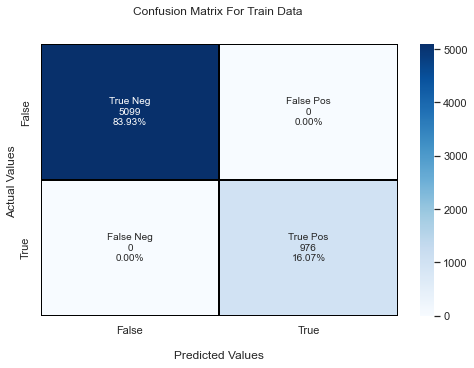

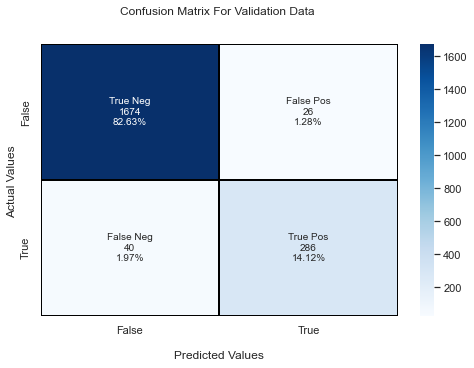

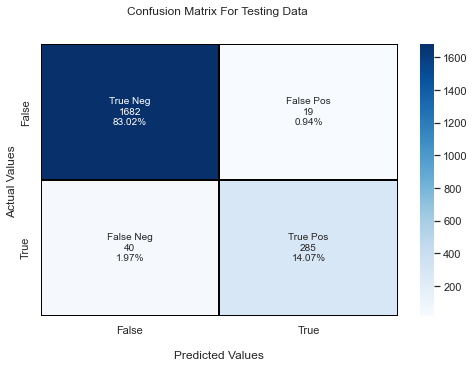

<IPython.core.display.Javascript object>

In [241]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(gbc_tuned, include_test=True)

In [242]:
# importance of features
get_feature_imp_list(gbc_tuned)

,Feature Importance
Total_Trans_Ct,0.236336
Total_Trans_Amt_Log,0.207508
Total_Revolving_Bal,0.163939
Total_Ct_Chng_Q4_Q1_Sqrt,0.082294
Total_Relationship_Count,0.079836
Total_Amt_Chng_Q4_Q1_Sqrt,0.077587
Avg_Open_To_Buy_sqrt,0.030495
Avg_Utilization_Ratio,0.025152
Months_Inactive_12_mon,0.021459
Credit_Limit_Log,0.019705


<IPython.core.display.Javascript object>

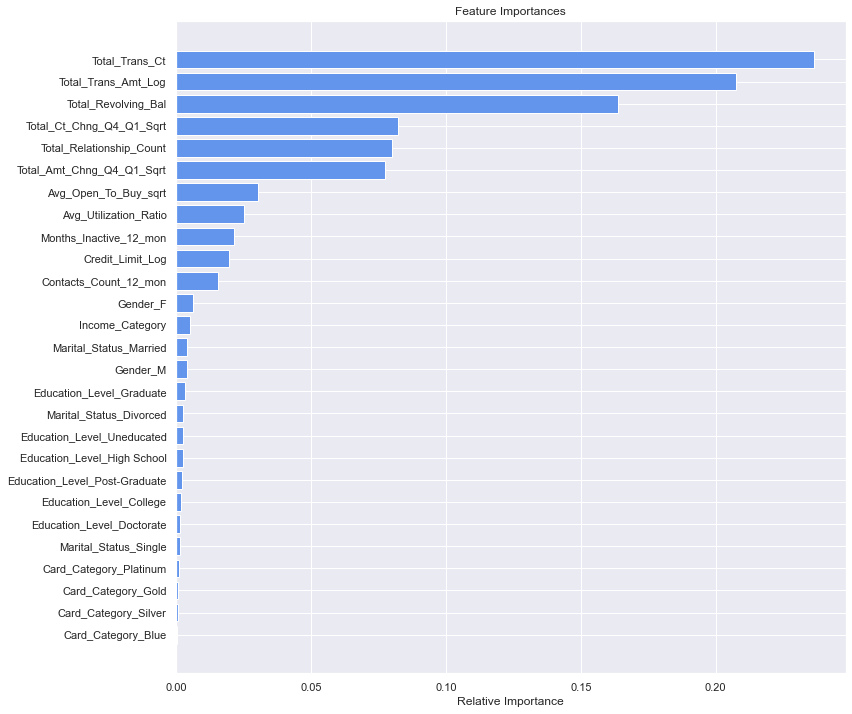

<IPython.core.display.Javascript object>

In [243]:
# plot of features
plot_feature_imp(gbc_tuned)


#### Observation : 

1. Model performance need to be further improved.

#### B. Tune Gradient Boost Classifier with default parameters and over sampled data

In [244]:
%%time 

# Choose the type of classifier.
gbc_over_tuned = GradientBoostingClassifier(
    init=AdaBoostClassifier(random_state=1), random_state=1
)

# Grid of parameters to choose from
## add from article
param_grid = {
    "n_estimators": np.arange(10, 1000, 100),
    # "subsample": [0.8, 0.9, 1],
    "max_features": np.arange(0.7, 1, 0.1),
    "max_depth": np.arange(5, 20, 5),
    # "learning_rate": [0.01, 0.1, 1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
randomized_cv = RandomizedSearchCV(estimator=gbc_over_tuned, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)
randomized_cv = randomized_cv.fit(X_train_over, y_train_over)

# Set the clf to the best combination of parameters
gbc_over_tuned = randomized_cv.best_estimator_

# Fit the best algorithm to the data.
gbc_over_tuned.fit(X_train_over, y_train_over)

CPU times: user 31.2 s, sys: 127 ms, total: 31.3 s
Wall time: 6min 53s


GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_depth=10, max_features=0.8999999999999999,
                           n_estimators=710, random_state=1)

<IPython.core.display.Javascript object>

In [245]:
# Using above defined function to get accuracy, recall and precision on train and validation set
gbc_over_tuned_score = get_metrics_score(
    gbc_over_tuned, data_category="over", include_test=True
)

,Training Score,Validation Score,Testing Score
Accuracy,1.0,0.964462,0.968411
Recall,1.0,0.880368,0.913846
Precision,1.0,0.896875,0.891892
F1,1.0,0.888545,0.902736
ROC-AUC,1.0,0.930478,0.946341


<IPython.core.display.Javascript object>

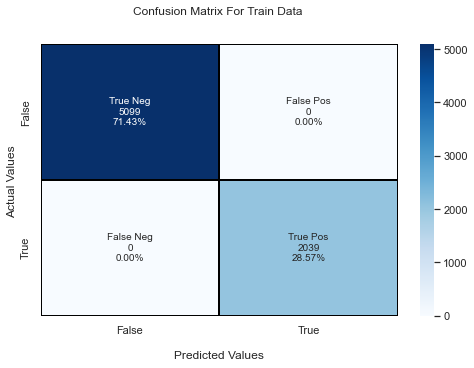

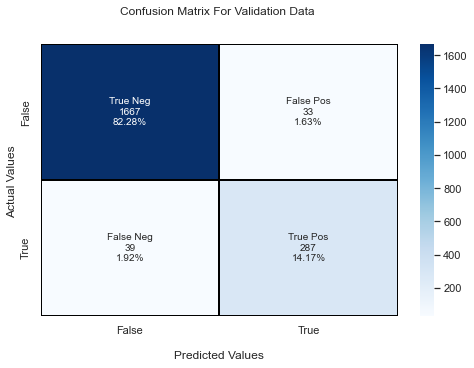

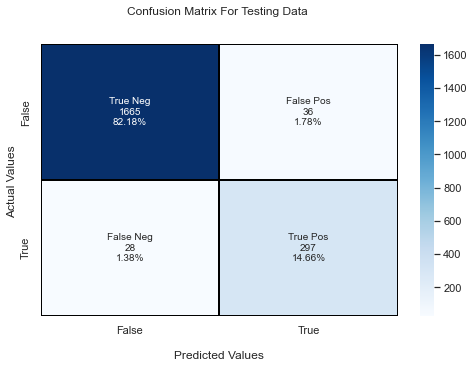

<IPython.core.display.Javascript object>

In [246]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(gbc_over_tuned, data_category="over", include_test=True)

In [247]:
# importance of features
get_feature_imp_list(gbc_over_tuned)

,Feature Importance
Total_Trans_Ct,0.323216
Total_Trans_Amt_Log,0.181851
Total_Revolving_Bal,0.146219
Total_Relationship_Count,0.078438
Total_Ct_Chng_Q4_Q1_Sqrt,0.071290
Total_Amt_Chng_Q4_Q1_Sqrt,0.064909
Avg_Utilization_Ratio,0.026261
Avg_Open_To_Buy_sqrt,0.021104
Credit_Limit_Log,0.017377
Months_Inactive_12_mon,0.010785


<IPython.core.display.Javascript object>

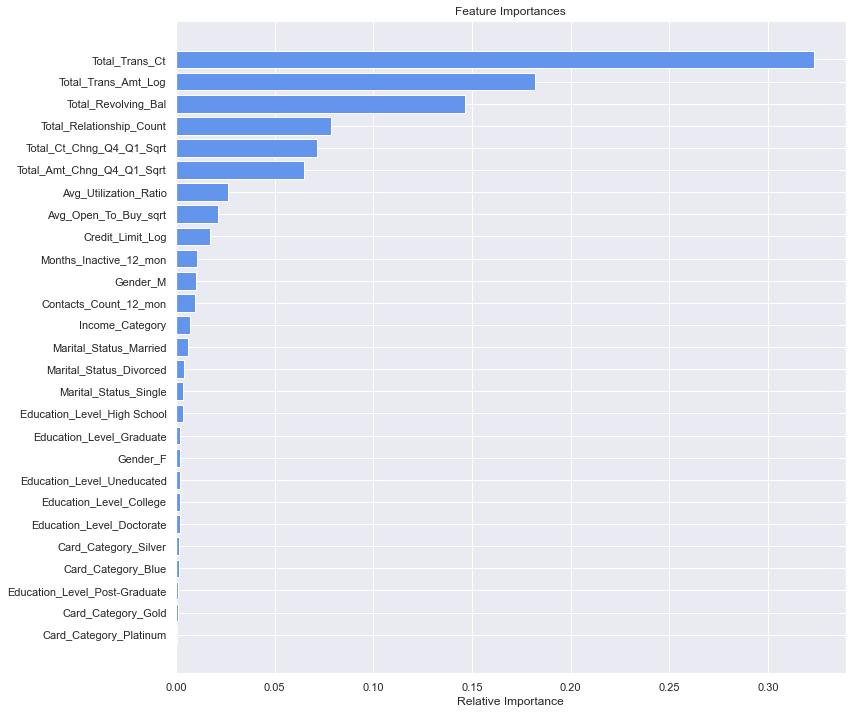

<IPython.core.display.Javascript object>

In [248]:
# plot of features
plot_feature_imp(gbc_over_tuned)


#### Observation : 

1. Model performance need to be further improved.

#### C. Tune AdaBoost Classifier with default parameters and under sampled data

In [249]:
%%time 

# Choose the type of classifier.
# abc_tuned = AdaBoostClassifier(random_state=1)
abc_under_tuned = AdaBoostClassifier(random_state=1)


# Grid of parameters to choose from
## add from article

param_grid = {
    # Let's try different max_depth for base_estimator
    "learning_rate": np.arange(0.1, 2, 0.1),
    # "max_samples": [0.7, 0.8, 0.9, 1],
    # "max_features": [0.7, 0.8, 0.9, 1],
    "n_estimators": np.arange(10, 1000, 100),
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
randomized_cv = RandomizedSearchCV(estimator=abc_under_tuned, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)
randomized_cv = randomized_cv.fit(X_train_under, y_train_under)

# Set the clf to the best combination of parameters
abc_under_tuned = randomized_cv.best_estimator_

# Fit the best algorithm to the data.
abc_under_tuned.fit(X_train_under, y_train_under)

CPU times: user 2.26 s, sys: 58.1 ms, total: 2.32 s
Wall time: 41.9 s


AdaBoostClassifier(learning_rate=0.1, n_estimators=410, random_state=1)

<IPython.core.display.Javascript object>

In [250]:
# Using above defined function to get accuracy, recall and precision on train and validation set
abc_under_tuned_score = get_metrics_score(
    abc_under_tuned, data_category="under", include_test=True
)

,Training Score,Validation Score,Testing Score
Accuracy,0.945697,0.930405,0.925962
Recall,0.956967,0.960123,0.966154
Precision,0.935872,0.709751,0.693157
F1,0.946302,0.816167,0.807198
ROC-AUC,0.945697,0.942414,0.942219


<IPython.core.display.Javascript object>

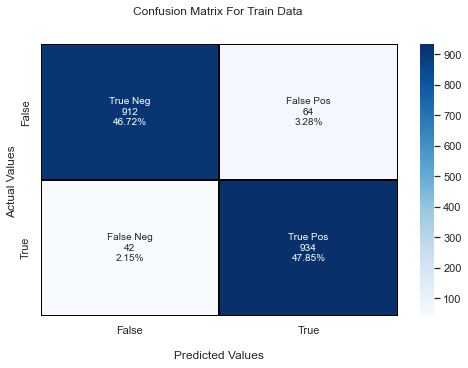

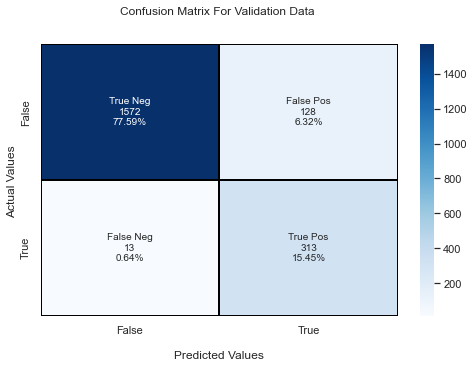

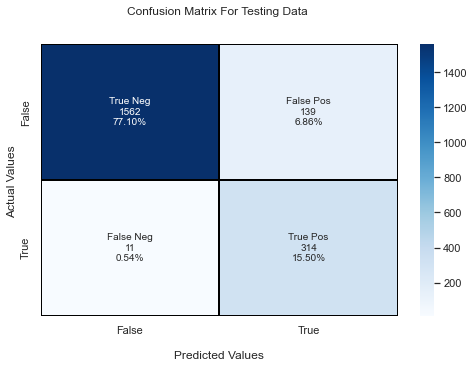

<IPython.core.display.Javascript object>

In [251]:
# Use function to get confusion matrix on train and validation set
get_confusion_matrix(abc_under_tuned, data_category="under", include_test=True)

In [252]:
# importance of features
get_feature_imp_list(abc_under_tuned)

,Feature Importance
Total_Trans_Amt_Log,0.370732
Total_Trans_Ct,0.226829
Total_Revolving_Bal,0.117073
Total_Amt_Chng_Q4_Q1_Sqrt,0.082927
Total_Ct_Chng_Q4_Q1_Sqrt,0.058537
Total_Relationship_Count,0.056098
Months_Inactive_12_mon,0.029268
Contacts_Count_12_mon,0.024390
Credit_Limit_Log,0.019512
Avg_Open_To_Buy_sqrt,0.009756


<IPython.core.display.Javascript object>

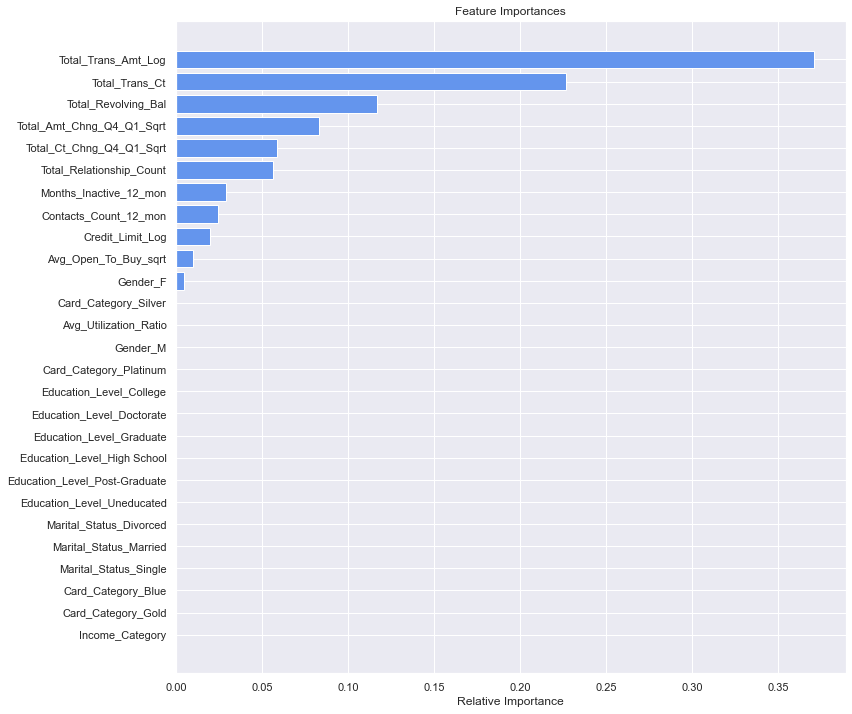

<IPython.core.display.Javascript object>

In [253]:
# plot of features
plot_feature_imp(abc_under_tuned)


#### Observation : 

1. Model performance need to be further improved.

### 8. Model - Performance Comparison - Test Data

In [254]:
model_performance_comparison(
    [gbc_tuned, gbc_over_tuned, abc_under_tuned,],
    [
        "Gradient Boost Classifier with default parameters",
        "Gradient Boost Classifier with default parameters and over sampled data",
        "AdaBoost Classifier with default parameters and under sampled data",
    ],
    include_test=True,
)

,Gradient Boost Classifier with default parameters,Gradient Boost Classifier with default parameters and over sampled data,AdaBoost Classifier with default parameters and under sampled data
Model,Gradient Boost Classifier with default parameters,Gradient Boost Classifier with default paramet...,AdaBoost Classifier with default parameters an...
Train_Accuracy,1.0,1.0,0.93
Validation_Accuracy,0.97,0.96,0.93
Testing_Accuracy,0.97,0.97,0.93
Train_Recall,1.0,1.0,0.96
Validation_Recall,0.88,0.88,0.96
Testing_Recall,0.88,0.91,0.97
Train_Precision,1.0,1.0,0.7
Validation_Precision,0.92,0.9,0.71
Testing_Precision,0.94,0.89,0.69


<IPython.core.display.Javascript object>

#### Observation : 

1. Performance of three tuned models on various metrics has been displayed.
2. Recall score is our right metric as per business case.
3. Models were tested against test data as well.
4. AdaBoost Model tuned against under sampled data gives good test recall score of 0.97. But, its precision is very low and doesnt generalise much on all scoring metrics. It was also trained in fewer data set which could make it overfit when deployed in production.
4. **Gradient Boost Classifier model tuned in oversampled data gives good recall score of 0.91 in testing set and 0.88 in validation set. Other scores like Accuracy,Precision and F1 is also very good for this model. This model is not overfitted and generalises well in training, validation and testing data sets. It was trained with oversampled data and should be a right fit. This model is a best fit and a good suggestion for production.**


### 11. Productionize the model

In [255]:
# creating a list of numerical variables
numerical_features = [
    "Income_Category",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])

# creating a list of categorical variables
categorical_features = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Card_Category",
]

# creating a transformer for categorical variables, which will first apply simple imputer and 
#then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)
# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data 
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes



<IPython.core.display.Javascript object>

In [256]:
# Create X and Y data for independent and dependent variables respectively
X_prod = churn_data.drop(["Attrition_Flag",], axis=1,)

Y_prod = churn_data["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [257]:
# Splitting the data into train and test sets
X_train_prod, X_test_prod, y_train_prod, y_test_prod = train_test_split(
    X_prod, Y_prod, test_size=0.30, random_state=1, stratify=Y_prod
)

<IPython.core.display.Javascript object>

In [258]:
print("Shape of Training set : ", X_train_prod.shape)
print("Shape of Test set : ", X_test_prod.shape)
print("Percentage of classes in Training set:")
print(y_train_prod.value_counts(normalize=True))
print("Percentage of classes in Test set:")
print(y_test_prod.value_counts(normalize=True))

Shape of Training set :  (7088, 16)
Shape of Test set :  (3039, 16)
Percentage of classes in Training set:
0    0.839306
1    0.160694
Name: Attrition_Flag, dtype: float64
Percentage of classes in Test set:
0    0.839421
1    0.160579
Name: Attrition_Flag, dtype: float64


<IPython.core.display.Javascript object>

In [259]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "GBC_OVER",
            GradientBoostingClassifier(
                init=AdaBoostClassifier(random_state=1),
                max_depth=10,
                max_features=0.8999999999999999,
                n_estimators=710,
                random_state=1,
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train_prod, y_train_prod)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Income_Category']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Gender', 'Education_Level',
                                                   'Marital_Status',
                         

<IPython.core.display.Javascript object>

In [260]:
# Using above defined function to get accuracy, recall and precision on train and test set
# defining an empty list to store train and test results
score_list = []

# Predicting on train and tests
pred_train = model.predict(X_train_prod)
pred_test = model.predict(X_test_prod)

# Accuracy of the model
train_acc = model.score(X_train_prod, y_train_prod)
test_acc = model.score(X_test_prod, y_test_prod)

# Recall of the model
train_recall = metrics.recall_score(y_train_prod, pred_train)
test_recall = metrics.recall_score(y_test_prod, pred_test)

# Precision of the model
train_precision = metrics.precision_score(y_train_prod, pred_train)
test_precision = metrics.precision_score(y_test_prod, pred_test)

# F1 Score of the model
train_f1 = metrics.f1_score(y_train_prod, pred_train)
test_f1 = metrics.f1_score(y_test_prod, pred_test)

# ROC-AUC Score of the model
train_roc_auc = metrics.roc_auc_score(y_train_prod, pred_train)
test_roc_auc = metrics.roc_auc_score(y_test_prod, pred_test)


score_list.extend(
    (
        train_acc,
        test_acc,
        train_recall,
        test_recall,
        train_precision,
        test_precision,
        train_f1,
        test_f1,
        train_roc_auc,
        test_roc_auc,
    )
)


display(
    pd.DataFrame(
        {
            # "Score": ["Accuracy", "Recall", "Precision", "F1","ROC-AUC"],
            "Training Score": [
                train_acc,
                train_recall,
                train_precision,
                train_f1,
                train_roc_auc,
            ],
            "Testing Score": [
                test_acc,
                test_recall,
                test_precision,
                test_f1,
                test_roc_auc,
            ],
        },
        index=["Accuracy", "Recall", "Precision", "F1", "ROC-AUC"],
    )
)

,Training Score,Testing Score
Accuracy,1.0,0.965449
Recall,1.0,0.870902
Precision,1.0,0.910064
F1,1.0,0.890052
ROC-AUC,1.0,0.927219


<IPython.core.display.Javascript object>

#### Observation : 

1. Performance of production model on various metrics has been displayed.
2. Recall score is our right metric as per business case.
3. **Gradient Boost Classifier model tuned in oversampled data gives gives recall score of 0.91 in testing set and 0.88 in validation set. It also gives good recall score of 0.87 in production testing set. Other scores like Accuracy,Precision and F1 is also very good for this model. This model is not overfitted and generalises well in training and testing data sets. It was trained with oversampled data and should be a right fit.**

### 11. Actionable Insights & Recommendations

### Conclusion:

**B. Model evaluation criterion :**

#### Model can make wrong predictions as:

1) Predicting a customer will churn but in reality the customer would not churn. - Loss of resources for marketing/sales or contacting customers.

2) Predicting a customer will not churn but in reality the customer would have churn. - Loss of customer/revenue.

#### Which case is more important?

Second case is important. If we predict a customer will not churn but in reality the customer would churn, then company will loose customer and revenue.

#### How to reduce this loss i.e need to reduce False Negatives?

recall should be maximized, the greater the recall higher the chances of minimizing the false negatives.


**B. Best Model :** The best model is Gradient Boost Classifier model tuned in oversampled data. It gives gives recall score of 0.91 in testing set and 0.88 in validation set. It also gives good recall score of 0.87 in production testing set. Other scores like Accuracy,Precision and F1 is also very good for this model. This model is not overfitted and generalises well in training and testing data sets. It was trained with oversampled data and should be a right fit.


### Insights & Recommendations :

   1) Total Revolving Balance : Number of customers who attrited had less Total Revolving Balance. Probably customers are not using credit card and had decided to churn to avoid annual fees.

   2) Total amount and count change between Q4 and Q1 : Number of customers who attrited had less Total amount change between Q4 and Q1. Customers in Total amount change between Q4 and Q1 as "zero" tends to churn more.

   3) Total Transaction Amount and Count: Number of customers who attrited had less Total Transaction Amount.

   4) Average Utilization Ratio : Number of customers who attrited had less Average Utilization Ratio. Customers in Average Utilization Ratio range as "Zero" tends to churn more.


### Insights on each columns are listed below:


**1. CLIENTNUM (Client number. Unique identifier for the customer holding the account) :** This feature is unique. So this must be dropped.

**2. Attrition_Flag (Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer") :** This is the target variable. It is a categorical column. It has only two values "Existing Customer" and "Attrited Customer". Value "Attrited Customer" will be True or "1" and value "Existing Customer" will be False or "0". **Objective of this project is to predict "Attrited Customer".
Most of customers did not churn (83.9%). Whereas, 16.1 % of customers had churned.
Target data is imbalanced.** 

**3. Customer_Age (Age in Years) :** It looks like a normal distribution. It is not at all skewed
It has few outliers. But, they seems to be very close to upper whisker. So it can be legitimate values. Mean and Median are same. Mean is 46 and median is also 46. There are no missing values. Most of the customers fall under age range 46 to 50. Second most of the customers fall under age range 41-45. Third most of the customers fall under age range 51-55.

**4. Gender (Gender of the account holder) :** This is a categorical variable. There are only two values "F" which means "Female" and "M" which means "Male". Most of the customers were "Female" (52.9%) compared to "Male" (47.1%). There are no missing values.

**5. Dependent_count (Number of dependents) :** This is a categorical variable even though values are numerical. There are only six values and they are in sequencial order. Most of the customers had "3" dependents (52.9%), followed by "2" (26.2%) and "1" (18.1%). There are no missing values.

**6. Education_Level (Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate) :** This is a categorical variable. There are only six values. Most of the customers were "Graduate" (30.9%), followed by "High School" (19.9%) and "Uneducated" (14.7%). There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Graduate".

**7. Marital_Status (Marital Status of the account holder) :** This is a categorical variable. There are only three values. Most of the customers were "Married" (46.3%), followed by "Single" (38.9%) and "Divorced" (7.4%). There are missing values and treatment is required. Since this is a categorical variable, missing value imputation can be done with mode value "Married".

**8. Income_Category (Annual Income Category of the account holder) :** This is a categorical variable. However, since this is income, its in a sequential order and can be converted into numerical values. There are only six values. Most of the customers were having income "Less than $40K" (35.2%), followed by "40K - 60K" (17.7%) and "80K - 120K" (15.2%). There are no missing values. **But, value "abc" seems to be invalid and it can be converted as a null value and treated with imputation of median since this is a numeric sequential value.**

**9. Card_Category (Type of Card) :** This is a categorical variable. There are only four values. Most of the customers were having "Blue" card (93.2%), followed by "Silver" (5.5%) and "Gold" (1.1%). There are no missing values.

**10. Months_on_book (Period of relationship with the bank) :** It looks like a normal distribution. It is not at all skewed. It has few outliers. But, they seems to be very close to upper and lower whisker. So it can be legitimate values. Mean and Median are same. Mean is 36 (3 years) and median is also 36 (3 years). There are no missing values. Most of the customers fall under number of months range 36 to 40. Looks like most of customers were card holders for 3 years. Second most of the customers fall under number of months range 31-35. Third most of the customers fall under number of months range 41-45.

**11. Total_Relationship_Count (Total no. of products held by the customer) :** This is a categorical variable even though values are numerical. There are only six values and they are in sequencial order. Most of the customers had "3" products held (22.8%), followed by "4" (18.9%) and "5" (18.7%). There are no missing values.

**12. Months_Inactive_12_mon (No. of months inactive in the last 12 months) :** This is a categorical variable even though values are numerical. There are only seven values and they are in sequencial order. Most of the customers were inactive for "3" months in last 12 months(38.8%), followed by "2" (32.4%) and "1" (22.0%). There are no missing values.

**13. Contacts_Count_12_mon (No. of Contacts between the customer and bank in the last 12 months) :** This is a categorical variable even though values are numerical. There are only seven values and they are in sequencial order
Most of the customers had "3" contacts in last 12 months (33.4%), followed by "2" (31.9%) and "1" (14.8%). There are no missing values.

**14. Credit_Limit (Credit Limit on the Credit Card) :** It doesn't look like a normal distribution. It is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are not same. Mean is 8632 and median is 4549. There are no missing values. Most of the customers fall under credit range 0 to 5000. Second most of the customers fall under credit range 5001-10000. Third most of the customers fall under credit range 10001-15000.

**15. Total_Revolving_Bal (The balance that carries over from one month to the next is the revolving balance) :** It doesnt look like a normal distribution. There are a lot of zero values. It is not skewed. It has no outliers. Mean and Median are not same. Mean is 1163 and median is 1276. There are no missing values. Most of the customers fall under revolving balance range 0. Second most of the customers fall under revolving balance range "1501 to 2000". Third most of the customers fall under revolving balance range "1001 to 1500".

**16. Avg_Open_To_Buy (Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)) :** It doesn't look like a normal distribution. It is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are not same. Mean is 7469 and median is 3474. There are no missing values. Most of the customers fall under revolving balance range 0. Second most of the customers fall under revolving balance range "1501 to 2000". Third most of the customers fall under revolving balance range "1001 to 1500".

**17. Total_Trans_Amt (Total Transaction Amount (Last 12 months)):** This distribution has multiple peaks and valleys. Looks like there are different ranges. But, it's is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a log transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 4404 and median is 3899. There are no missing values. Most of the customers fall under total transaction range "2501 to 5000". Second most of the customers fall under total transaction range "0 to 2500". Third most of the customers fall under total transaction range "5001 to 7500".

**18. Total_Trans_Ct (Total Transaction Count (Last 12 months)):** This distribution has peaks and valleys. It is sligtly right skewed. It has few outliers, but, they are closer to upper whisker. Mean and Median are almost same. Mean is 65 and median is 67. There are no missing values. Most of the customers fall under total transaction count range "71 to 80". Second most of the customers fall total transaction count range "61 to 70". Third most of the customers fall total transaction count range "81 to 90".

**19. Total_Ct_Chng_Q4_Q1 (Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter):** It has a normal distribution. It is heavily right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a square root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 0.71 and median is 0.70. There are no missing values. Most of the customers fall under ratio of total transaction count range "0.6 to 1.0". Second most of the customers fall ratio of total transaction count range "0.1 to 0.5". Third most of the customers fall ratio of total transaction count range "1.1 to 1.5".

**20. Total_Amt_Chng_Q4_Q1 (Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter):** It looks like a normal distribution. But, it's is extremely right skewed. **It has lots of outliers. But, they all are very close to upper whisker and tightly close to each other. So they may be legitimate values which cannot be dropped or capped. So a squared root transformation can be applied to make distribution look like normal and treat outliers. This transformation can be done before train-test data split because this transformation is uniformly applied to whole dataset. This transformation doesnt impute or update certain values from test into train. So there wont be data leakage in this case and its fine to do this outlier treatment beore train-test split.** Mean and Median are almost same. Mean is 0.760 and median is 0.736. There are no missing values. Most of the customers fall under ratio range "0.6 to 1.0". This means customers had kept almost same total transaction amount in Q4 and Q1. Second most of the customers fall under ratio range "1.1 to 1.5". Third most of the customers fall under ratio range "0.1 to 0.5".

**21. Avg_Utilization_Ratio (Represents how much of the available credit the customer spent):** It looks like a normal distribution. It is not skewed. It has no outliers. Mean and Median are not same. Mean is 0.27 and median is 0.18. There are no missing values. Most of the customers fall under ratio of average utilization range is "0". Looks like most of customers doesnt spend much. Second most of the customers fall ratio of average utilization range "0.01 to 0.1". Third most of the customers fall ratio of average utilization range "0.11 to 0.2"




### Other Insights :

**1. Customer_Age vs Attrition_Flag :** Customers who attrited are uniformly distributed for customer age.
Also, customers who attrited and existing fall almost in same age range. There is a very slight correlation between Customer Age and Attrition Flag. Customers in age range between 65 and 70 tends to churn more.

**2. Gender vs Attrition_Flag :** Female customers had attrited more than other customers. There is no high correlation between Gender vs Attrition_Flag.

**3. Dependent_count vs Attrition_Flag :** Customers with "3", "4" dependents had attrited more than other customers. There is no high correlation between Dependent_count vs Attrition_Flag.

**4. Education_Level vs Attrition_Flag :** Customers who are "Doctorate", "Post-Graduate" etc had attrited more than other customers. There is no high correlation between Education_Level vs Attrition_Flag.

**5. Marital_Status vs Attrition_Flag :** Customers who are "Single" had attrited more than other customers. There is no high correlation between Marital_Status vs Attrition_Flag.

**6. Income_Category vs Attrition_Flag :** Customers under income group "$120K +" had attrited more than other customers. There is no high correlation between Income_Category vs Attrition_Flag.

**7. Card_Category vs Attrition_Flag :** Customers using card "Platinum" had attrited more than other customers. There is no high correlation between Card_Category vs Attrition_Flag.

**8. Months on Book vs Attrition Flag :** Number of customers who attrited are uniformly distributed for Months on Book. Box plots shows customers who attrited and existing fall almost in same Months on Book range. There is a slight correlation between Months on Book and Attrition Flag. Customers in Months on Book range between 46 and 50 tends to churn more.

**9. Total_Relationship_Count vs Attrition_Flag :** Customers having products "2" had attrited more than other customers. There is no high correlation between Total_Relationship_Count vs Attrition_Flag.

**10. Months_Inactive_12_mon vs Attrition_Flag :** Customers who were inactive for "0" months had attrited more than other customers. There is no high correlation between Months_Inactive_12_mon vs Attrition_Flag.

**11. Contacts_Count_12_mon vs Attrition_Flag :** Customers who had "6" contacts with bank had attrited more than other customers. There is no high correlation between Contacts_Count_12_mon vs Attrition_Flag.

**12. Total Revolving Balance vs Attrition Flag :** Number of customers who attrited had less Total Revolving Balance. Box plots shows customers who attrited had less Total Revolving Balance and existing customers normally has higher Total Revolving Balance which means they are using credit card frequently. There is a correlation between Total Revolving Balance and Attrition Flag. Customers in Total Revolving Balance range between 1 and 500 tends to churn more. Probably customers are not using credit card and had decided to churn to avoid annual fees.

**13. Average Open to Buy vs Attrition Flag :** Number of customers who attrited had less Average Open to Buy. Box plots shows customers who attrited and existing customers has similar Average Open to Buy. There is not much correlation between Average Open to Buy and Attrition Flag. Customers in Average Open to Buy range between 30001 and 35000 tends to churn more.

**14. Total amount change between Q4 and Q1 vs Attrition Flag :** Number of customers who attrited had less Total amount change between Q4 and Q1. Box plots shows customers who attrited and existing customers has similar Total amount change between Q4 and Q1. There is a correlation between Total amount change between Q4 and Q1 and Attrition Flag. Customers in Total amount change between Q4 and Q1 as zero tends to churn more.

**15. Total Transaction Amount vs Attrition Flag :** Number of customers who attrited had less Total Transaction Amount. Box plots shows customers who attrited had less Total Transaction Amount and existing customers had higher Total Transaction Amount. There is a correlation between Total Transaction Amount and Attrition Flag.
Customers in Total Transaction Amount range as "10001 to 12500" tends to churn more.

**16. Total Transaction Count vs Attrition Flag :** Number of customers who attrited had less Total Transaction Count. Box plots shows customers who attrited had less Total Transaction Count and existing customers had higher Total Transaction Count. There is a correlation between Total Transaction Count and Attrition Flag.
Customers in Total Transaction Count range as "0 to 10" tends to churn more.

**17. Total Count Change Q4-Q1 vs Attrition Flag :** Number of customers who attrited had less Total Count Change Q4-Q1. Box plots shows customers who attrited had less Total Count Change Q4-Q1 and existing customers had higher Total Count Change Q4-Q1. There is a correlation between Total Count Change Q4-Q1 and Attrition Flag.
Customers in Total Count Change Q4-Q1 range as "0" tends to churn more.

**18. Average Utilization Ratio vs Attrition Flag :** Number of customers who attrited had less Average Utilization Ratio. Box plots shows customers who attrited had less Average Utilization Ratio and existing customers had higher Average Utilization Ratio. There is a correlation between Average Utilization Ratio and Attrition Flag.
Customers in Average Utilization Ratio range as "Zero" tends to churn more.

